# Clustering and validation
In this script we cluster pull request graphs and their associated feature vectors that capture the structural properties of the graphs. We arrive at a final partition of 5 group type.


In [1]:
import networkx as nx
import pickle
from scipy.spatial import distance
import numpy as np
import seaborn as sns
from collections import defaultdict
from itertools import combinations
import matplotlib as mp
import matplotlib.pyplot as plt
from nxpd import draw
from IPython.display import display
import operator
import random
import community
import MySQLdb
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import adjusted_mutual_info_score

Graphs and feature vectors have been prepared in a separate script.

Load network data

In [2]:
networkl=pickle.load(open("data/networks8to20", "rb"))

Load feature vectors that have been precalculated in different notebook

In [3]:
feature_vecs_8to20 = pickle.load( open("data/feature_vecs_8to20.p", "rb"))

In [4]:

colors=["#35a8e0", "#05c100", "#ffd300",'#d8b69f', '#d1000a']

# connect to ghtorrent db dump
db=MySQLdb.connect(
                 host="127.0.0.1",
                 user="root",
                 passwd="enterenter"
               )
cursor = db.cursor()
cursor.execute("use ghtorrent_restore")


def get_project_info(_id):
    cursor.execute("select owner_id, name from projects where id=%s"%(_id))
    project_data=cursor.fetchone()
    name=project_data[1]
    # get owner login name
    owner_id = project_data[0]
    cursor.execute("select * from users where id=%s"%(owner_id))
    owner=cursor.fetchone()
    #returns name, owner id, owner login name, user type
    return (name, owner[0], owner[1], owner[4])

def get_user(_id):
    cursor.execute("select * from users where id=%s"%(_id))
    return cursor.fetchone()

def get_commits(p_id, u_id):
    cursor.execute("""select * from commits c, project_commits pc
                          where pc.project_id=%s
                          and pc.commit_id=c.id
                          and (c.author_id=%s or c.committer_id=%s)
        
    """%(p_id,u_id,u_id))
    return cursor.fetchall()

def get_graph_by_id(_id):
    return next(nw for nw in networkl if nw.graph['id']==_id)

def draw_github_project(_id,node_color="black"):
    testnw=next(nw for nw in networkl if nw.graph['id']==_id)
    nx.set_node_attributes(testnw, node_color ,'color')
    for pairs in testnw.adjacency():
        for edge in pairs[1]:   
            testnw[pairs[0]][edge]['label']=str(pairs[1][edge]['weight'])
    

    fig=plt.figure(figsize=(10,2))
    project_info=get_project_info(_id)
    print("Project name: " + str(project_info[0]) + ", project owner: " + str(project_info[2]) + ", ghtorrent id: " + str(_id))
    
    return draw(testnw, show='ipynb')

def draw_graph(G,node_color):
    nx.set_node_attributes(G, node_color ,'color')
    for pairs in G.adjacency():
        for edge in pairs[1]:   
            G[pairs[0]][edge]['label']=str(pairs[1][edge]['weight'])
    
    fig=plt.figure(figsize=(10,2))
    return draw(G, show='ipynb')


def dunn_centroids(labels, vectors, min_cluster_size = 1):
    """
    Dunn index for cluster validation (larger is better).
    cluster diameter: 2* average distance from centroid.
    cluster distance: distance between cluster centroids.
    """
    labels = LabelEncoder().fit(labels).transform(labels)
    vectors = np.array(vectors)
    
    ignore_cluster = []
    for i in np.unique(labels):
        if len(labels[labels==i]) < min_cluster_size:
            ignore_cluster.append(i)
    
    #calculate centroids of each cluster
    centroids = [ np.mean(vectors[labels == i], axis=0) for i in np.unique(labels)]

    #Calculates the cluster diameters as 2 times the average distance from the centroids.
    diameters = []
    for i in np.unique(labels):
        if i not in ignore_cluster:
            diameters.append(2*np.mean([distance.seuclidean(vec, centroids[i], varis)  for vec in vectors[labels == i]]))
            
    # in case cluster does not have min_cluster_size, we remove the centroid so that it is not considered
    for index in sorted(ignore_cluster, reverse=True):
        del centroids[index]
        
    #Calculates the distances between the centroids of each cluster.
    ic_distances = [distance.seuclidean(centroids[i], centroids[j], varis) for i in range(len(centroids)) for j in range(i+1, len(centroids))]
    ic_distances = np.array(ic_distances)
    
    # In the case of only one cluster, we set min_distance to zero
    if len(ic_distances)>0:
        min_distance = min(ic_distances[ic_distances.nonzero()])
    else:
        min_distance = 0
    max_diameter = max(diameters)
    
    return min_distance / max_diameter

def connectedness(partition, l=5):
    conn = 0
    for node in partition:
        node_cl = partition[node]
        ind = index_dict[node]
        neighbors_idxs = sorted_dists[index_dict[node]][:l]
        for j,neighbor_idx in enumerate(neighbors_idxs):
            neighbor = nodes[neighbor_idx]
            if partition[neighbor]!=node_cl:
                conn+= 1/(j+1)
    return conn

In [5]:

fvs=list(feature_vecs_8to20.values())
varis=np.var(fvs, axis=0)



def get_most_representatives(node_ids, node_dict, n, nstart=0, nsample=0):
    if nsample==0:
        nsample=len(node_ids)
    node_ids=random.sample(node_ids, nsample)    
    vectors=[node_dict[nid] for nid in node_ids]
    Y=distance.pdist(vectors, 'seuclidean', V=varis)
    dsums=distance.squareform(Y).sum(axis=0)
    sorted_indeces=sorted(range(len(dsums)), key=lambda k: dsums[k])
    return [[(node_ids[i], dsums[i]/nsample) for i in sorted_indeces[nstart:nstart+n]],[(node_ids[i], dsums[i]/nsample) for i in sorted_indeces[len(sorted_indeces)-nstart-n:len(sorted_indeces)-nstart]], Y]

def get_ranking(node_ids, node_dict):  
    vectors=[node_dict[nid] for nid in node_ids]
    leng=len(node_ids)
    Y=distance.pdist(vectors, 'seuclidean', V=varis)
    dsums=distance.squareform(Y).sum(axis=0)
    sorted_indeces=sorted(range(len(dsums)), key=lambda k: dsums[k])
    sorted_dict={}
    for i,j in enumerate(sorted_indeces):
        sorted_dict[node_ids[j]]=(i+1,(i+1)/leng, dsums[j]/leng) 
        
    return sorted_dict

def draw_most_representatives(node_ids, node_dict, n, nstart=0, nsample=0, color="#000000"):
    
    data=get_most_representatives(node_ids, node_dict, n, nstart, nsample)
    
    print("Distance distribution")
    print("---------------------------------------------------------------------------------")
    #sns.distplot(data[2], hist=True, bins=200, color="g", kde=True)
    #plt.show()
    print("most central projects in cluster:")
    print("---------------------------------------------------------------------------------")
    for sample in data[0]:
        print("mean distance ", sample[1])
        display(draw_github_project(sample[0], color))
        
    print("most decentral projects in cluster:")
    print("---------------------------------------------------------------------------------")
    for sample in data[1]:
        print("mean distance ", sample[1])
        display(draw_github_project(sample[0], color))

        
def draw_most_decentral(node_ids, node_dict, n, nstart=0, nsample=0):
    
    data=get_most_representatives(node_ids, node_dict, n, nstart, nsample)
    
    print("most decentral projects in cluster:")
    print("---------------------------------------------------------------------------------")
    for sample in data[1]:
        print("mean distance ", sample[1])
        display(draw_github_project(sample[0], "#000000"))


## Plot distance distribution for projects

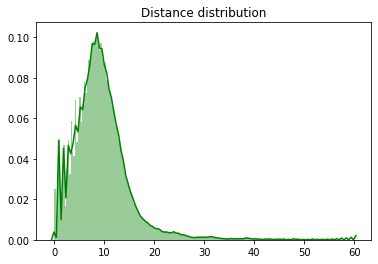

In [25]:
Y=distance.pdist([feature_vecs_8to20[k] for k in feature_vecs_8to20], 'seuclidean', V=varis)
sns.distplot(Y, hist=True, bins=200, color="g", kde=True)
plt.title("Distance distribution")
plt.show()

In [17]:
np.mean(Y)

9.400243602444355

## Clustering

To find a typology of projects, we create a similarity network in which similar projects are connected by a weighted tie that depends on the distance between projects. We introduce a treshold distance at which nodes do not have a tie anymore. We do not want projects that have a great distance to be connected. At the same time we do not want the cluster solution to depend explicitly on the treshold. We therefore vary the threshold and try to find a stable cluster solution. We vary the treshold starting roughly from the  mean distance between all project to two times the mean distance (i.e from 10 to 19). 

In [9]:
len([d for d in Y if d < 19])/len(Y)

0.953354808134783

The treshold of 19 includes more than 95 percent of all ties.
To calculate the similarity we normalize the distances d with min-max standardization (min=0, max=treshold) s to the interval [0,1] and the similarity between two projects becomes s = 1 - s(d).
We use the Louvain clustering algorithm for different values of the treshold and for different values of the resolution parameter.

Sidenote: For the clustering to be meaningful, we want as much variety in the weights as possible. If we do not set a threshold and then do a min-max standardization to calculate the similarities, the majority of all pairs would  have a very high similarity, because of the skewed distribution. For example as you can see above 95 percent of all project pairs would have a similarity weight of greater than ~ (60-20)/60 = 0.66. 

In [10]:
np.random.seed(seed=123)

fv_keys=feature_vecs_8to20.keys()
no_partitions=defaultdict(list)
partitions={}
modularities={}

nodes= fv_keys
Y=distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)


for treshold in range(10,20,1):
    tuples=combinations(nodes,2)
    G=nx.Graph()
    G.add_weighted_edges_from([(*indeces,(treshold - dist)/treshold) for indeces, dist in zip(tuples,Y) if dist < treshold ])

    G_nodes=G.nodes
    for node in nodes:
        if node not in G_nodes:
            G.add_node(node)
    #compute the best partition
    
   
    for res in [(0.1*x+0.7) for x in range(10)]:
        partition = community.best_partition(G, resolution=res)
        modularity=community.modularity(partition, G, weight='weight')
        name="tresh" + str(treshold) + "-res-"+str(np.round(res,1))[:3]
        partitions[name]=partition
        modularities[name]=modularity
        print(treshold, res, len(set(partition.values())))
        print("modularity ", modularity)
        no_partitions[str(treshold)].append(len(set(partition.values())))
    
   

10 0.7 837
modularity  0.1355872321400374
10 0.7999999999999999 17
modularity  0.15620067757621298
10 0.8999999999999999 7
modularity  0.18887111631718398
10 1.0 6
modularity  0.19156406274807763
10 1.1 6
modularity  0.19134872671952977
10 1.2 5
modularity  0.18399725765571479
10 1.3 5
modularity  0.18316394704624925
10 1.4 5
modularity  0.18235574233968083
10 1.5 7
modularity  0.17953087092253775
10 1.6 5
modularity  0.16475979673823243
11 0.7 909
modularity  0.11727679419821378
11 0.7999999999999999 18
modularity  0.13603247100777688
11 0.8999999999999999 7
modularity  0.16845063190411158
11 1.0 5
modularity  0.17162919239647836
11 1.1 6
modularity  0.1715051945152299
11 1.2 6
modularity  0.1696909493067095
11 1.3 6
modularity  0.16875588880387013
11 1.4 4
modularity  0.09549950826489897
11 1.5 4
modularity  0.08478200967139898
11 1.6 4
modularity  0.08279132758504816
12 0.7 1020
modularity  0.09419325176618623
12 0.7999999999999999 23
modularity  0.11977119781048233
12 0.89999999999

In [97]:
pickle.dump(partitions, open("data/partitions_level1", "wb"))
pickle.dump(modularities, open("data/modularities_level1", "wb"))

In [6]:
partitions = pickle.load(open("data/partitions_level1", "rb"))
modularities = pickle.load(open("data/modularities_level1", "rb"))

In [8]:
fvs=list(feature_vecs_8to20.values())
varis=np.var(fvs, axis=0)
std=np.std(fvs, axis=0)

def normalize(x):
    return np.array([x[i]/std[i] for i in range(len(x))])

feature_vecs_normalized = {x:normalize(v) for x,v in feature_vecs_8to20.items()}

# Explore number of clusters
we check the number of clusters  that have at least 20 projects. 
This is ok, because we want to find a typology of groups so there should be at least a decent amount of projects in a cluster for a typology to make sense.

In [62]:
no_p_clean=[]
no_singlets=[]
for treshold in range(10,20,1):
    counts=[]
    singletsn=[]
    for res in [(0.1*x+0.7) for x in range(10)]:
        name="tresh" + str(treshold) + "-res-"+str(np.round(res,1))[:3]
        tp=partitions[name]
        d = defaultdict(int)
        for k,v in tp.items():
            d[v]+=1

        count=0
        singlets=0
        for k,v in d.items():
            # only count partitions that have at least 20 projects
            if v>20:
                count+=1
            else:
                singlets+=1
        counts.append(count)
        singletsn.append(singlets)
    no_p_clean.append(counts)
    no_singlets.append(singletsn)


    

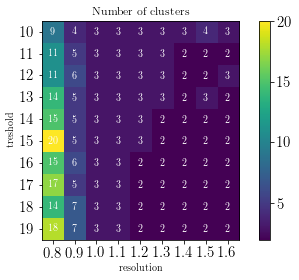

In [63]:
xticks=['0.8', '0.9', '1.0', '1.1', '1.2', '1.3', '1.4', '1.5', '1.6']
yticks=['10','11', '12', '13', '14', '15', '16', '17', '18', '19']

dmat=np.array([x[1:] for x in no_p_clean])

fig, ax = plt.subplots()
im = ax.imshow(dmat)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*dmat.nonzero()):
    ax.text(j, i, dmat[i, j], color='white', ha='center', va='center')

ax.set_title("Number of clusters")
plt.xlabel("resolution")
plt.ylabel("treshold")
fig.tight_layout()
plt.colorbar(im)
plt.show()

we also check the number of clusters  that have at least  **200 projects**. 

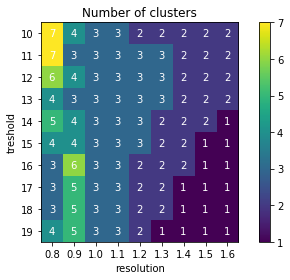

In [7]:
no_p_clean=[]
no_singlets=[]
for treshold in range(10,20,1):
    counts=[]
    singletsn=[]
    for res in [(0.1*x+0.7) for x in range(10)]:
        name="tresh" + str(treshold) + "-res-"+str(np.round(res,1))[:3]
        tp=partitions[name]
        d = defaultdict(int)
        for k,v in tp.items():
            d[v]+=1

        count=0
        singlets=0
        for k,v in d.items():
            # only count partitions that have at least 20 projects
            if v>200:
                count+=1
            else:
                singlets+=1
        counts.append(count)
        singletsn.append(singlets)
    no_p_clean.append(counts)
    no_singlets.append(singletsn)


xticks=['0.8', '0.9', '1.0', '1.1', '1.2', '1.3', '1.4', '1.5', '1.6']
yticks=['10','11', '12', '13', '14', '15', '16', '17', '18', '19']

dmat=np.array([x[1:] for x in no_p_clean])

fig, ax = plt.subplots()
im = ax.imshow(dmat)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*dmat.nonzero()):
    ax.text(j, i, dmat[i, j], color='white', ha='center', va='center')

ax.set_title("Number of clusters")
plt.xlabel("resolution")
plt.ylabel("treshold")
fig.tight_layout()
plt.colorbar(im)
fig.savefig('clustermatrix.png', dpi=300)
plt.show()

We see that many of the cluster solutions in the right bottom consist of only 1 big cluster (and maybe some additional very small clusters).
We see that for varying tresholds, the only stable plateaus are at resolutions 1.0 and 1.1 with three cluster solutions.
To pick between these values and explore the cluster solutions further, we calculate three cluster validity indeces. 

The first is modularity, which the Louvain algorithm that we used tries to maximize.

The second index is Connectedness which takes into account wether neigbouring nodes are in the same cluster (smaller values are better).

The third index is dunn's index.

# Stability of cluster solutions

To have a quantitative measure for the stability of the cluster solutions with respect to the treshold parameter we calculate
both the adjusted rand score and the adjusted mutual information for each pair of cluster solutions with the same resolution parameter. 

In [8]:
nodes = list(feature_vecs_8to20.keys())
resolutions = [(0.1*x+0.7) for x in range(10)]
avg_ari = []
ari_matrices = []
avg_ami = []
ami_matrices = []

for res in resolutions:
    names=["tresh" + str(treshold) + "-res-"+str(np.round(res,1))[:3] for treshold in range(10,20,1)]
    ari_matrix=[]
    ami_matrix=[]
    for i in range(len(names)):
        arr_ari = []
        arr_ami = []
        for j in range(len(names)):
            p1 = partitions[names[i]]
            p2 = partitions[names[j]]
            ari = adjusted_rand_score([p1[n] for n in nodes], [p2[n] for n in nodes])
            ami = adjusted_mutual_info_score([p1[n] for n in nodes], [p2[n] for n in nodes])
            arr_ari.append(ari)       
            arr_ami.append(ami)
        ari_matrix.append(arr_ari)
        ami_matrix.append(arr_ami)
    ari_matrices.append(ari_matrix)
    ami_matrices.append(ami_matrix)
    avg_ari.append(np.mean(ari_matrix))
    avg_ami.append(np.mean(ami_matrix))
    

/home/trurl/anaconda3/envs/myenv/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Below we plot the average adjusted rand index and the average adjusted mutual information for all pairs of partitions from the cluster solutions with the same resolution parameter. We clearly see a maximum in partition stability for the cluster solutions with resolution parameter 1.0, where the obtained partitions show the highes congruence for different tresholds.

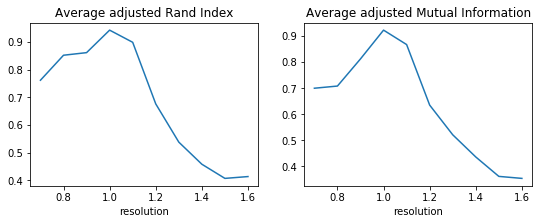

In [10]:
fig, axs = plt.subplots(1, 2, figsize=(9, 3))
axs[0].plot(resolutions, avg_ari)
axs[0].set_title("Average adjusted Rand Index")
axs[0].set_xlabel("resolution")

axs[1].plot(resolutions, avg_ami)
axs[1].set_title("Average adjusted Mutual Information")
axs[1].set_xlabel("resolution")
plt.show()

# modularity

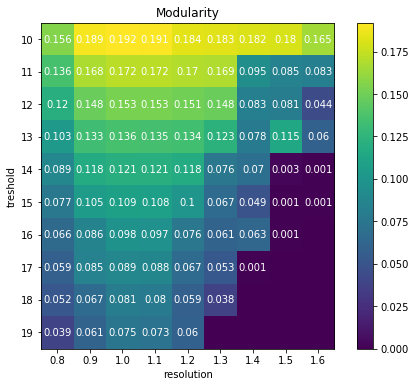

In [11]:
modularities_plot=[]
for treshold in range(10,20,1):
    m_arr = []
    for res in [(0.1*x+0.8) for x in range(9)]:
        name="tresh" + str(treshold) + "-res-"+str(np.round(res,1))[:3]
        m = modularities[name]
        m_arr.append(m)
    modularities_plot.append(m_arr)

modularities_coeff=np.round(np.array(modularities_plot),3)

fig, ax = plt.subplots(figsize = (8,6) )
im = ax.imshow(modularities_coeff)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*modularities_coeff.nonzero()):
    ax.text(j, i, modularities_coeff[i, j], color='white', fontsize = 10, ha='center', va='center')

plt.colorbar(im)
ax.set_title("Modularity")
plt.xlabel("resolution")
plt.ylabel("treshold")
#fig.tight_layout()
#plt.colorbar(modularities_coeff)
#fig.savefig('clustermatrix.png', dpi=300)
plt.show()

We see that the maximum modularity is consistently reached at resolution parameters 1.0 followed by 1.1 with nearly identical modularities.
Generally modularity is higher for smaller tresholds. This is due to the fact, that each treshold corresponds to a different graph, where a higher treshold means that nodes with greater distance still share a tie. So it only makes sense to  compare cluster solutions for the same threshold graph.

# connectedness

In [19]:
nodes = list(feature_vecs_8to20.keys())
dists=distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)
dists = distance.squareform(dists)
sorted_dists = [np.argsort(dists[i]) for i in range(len(nodes))]
sorted_dists = [sorted_dists[i][sorted_dists[i]!=i] for i in range(len(nodes))] #remove the distance to itself (which of course are zeros)
index_dict = {node:i for i,node in enumerate(nodes)} 

def connectedness(partition, l=5):
    conn = 0
    for node in partition:
        node_cl = partition[node]
        ind = index_dict[node]
        neighbors_idxs = sorted_dists[index_dict[node]][:l]
        for j,neighbor_idx in enumerate(neighbors_idxs):
            neighbor = nodes[neighbor_idx]
            if partition[neighbor]!=node_cl:
                conn+= 1/(j+1)
    return conn/len(partition)

connectedness_dict = {}
for key in partitions:
    c = connectedness(partitions[key],5)
    connectedness_dict[key]=c

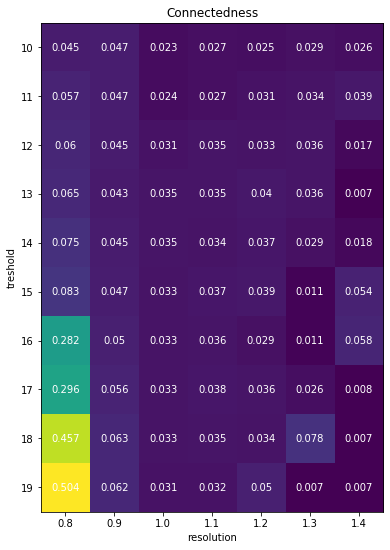

In [20]:
xticks=['0.8', '0.9', '1.0', '1.1', '1.2', '1.3', '1.4']
yticks=['10', '11', '12','13', '14', '15', '16', '17', '18', '19']

connectivities_plot=[]
for treshold in range(10,20,1):
    m_arr = []
    for res in [(0.1*x+0.8) for x in range(7)]:
        name="tresh" + str(treshold) + "-res-"+str(np.round(res,1))[:4]
        m = connectedness_dict[name]
        m_arr.append(m)
    connectivities_plot.append(m_arr)

connectivities_coeff=np.round(np.array(connectivities_plot),3)

fig, ax = plt.subplots(figsize = (12,9) )
im = ax.imshow(connectivities_coeff)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*connectivities_coeff.nonzero()):
    ax.text(j, i, connectivities_coeff[i, j], color='white', fontsize = 10, ha='center', va='center')
plt.colorbar(im)
ax.set_title("Connectedness")
plt.xlabel("resolution")
plt.ylabel("treshold")
#fig.tight_layout()
#plt.colorbar(modularities_coeff)
#fig.savefig('clustermatrix.png', dpi=300)
plt.show()

Connectedness seems to reach a minimum at res = 1.0. There are some smaller values for connectedness at higher values for the resolution parameter, but these are due to cluster solutions with only one very big cluster (see exploration for the number of clusters above). If there only is a single cluster, all neigbors are obviously in the same cluster, so connectedness becomes optimal ~ 0.

Besides, for higher values of the resolution parameter, the solutions and their associated values for connectedness are unstable with respect to the treshold and we are looking for a stable solution.


# dunn's index

In [25]:
dunns_index_centroids_dict = {}
for key in partitions:
    partition = partitions[key]
    nodes = list(partition.keys())
    vecs=[feature_vecs_8to20[n] for n in nodes]
    labels = [partition[n] for n in nodes]
    di = dunn_centroids(labels, vecs)
    dunns_index_centroids_dict[key]=di

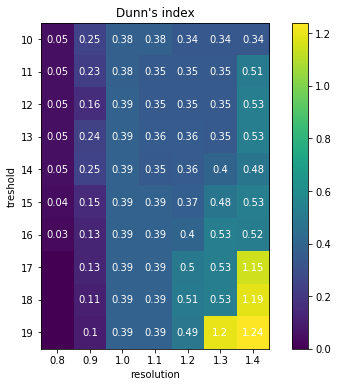

In [27]:

xticks=['0.8', '0.9', '1.0', '1.1', '1.2', '1.3', '1.4']
yticks=['10', '11', '12','13', '14', '15', '16', '17', '18', '19']

dunns_index_centroids_plot=[]
for treshold in range(10,20,1):
    m_arr = []
    for res in [(0.1*x+0.8) for x in range(7)]:
        name="tresh" + str(treshold) + "-res-"+str(np.round(res,1))[:4]
        m = dunns_index_centroids_dict[name]
        m_arr.append(m)
    dunns_index_centroids_plot.append(m_arr)

dunns_index_centroids_coeff=np.round(np.array(dunns_index_centroids_plot),2)

fig, ax = plt.subplots(figsize = (8,6) )
im = ax.imshow(dunns_index_centroids_coeff)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*dunns_index_centroids_coeff.nonzero()):
    ax.text(j, i, dunns_index_centroids_coeff[i, j], color='white', fontsize = 10, ha='center', va='center')

plt.colorbar(im)
ax.set_title("Dunn's index")
plt.xlabel("resolution")
plt.ylabel("treshold")
#fig.tight_layout()
#plt.colorbar(modularities_coeff)
#fig.savefig('clustermatrix.png', dpi=300)
plt.show()

We see that for resolution r = 1.0 the dunn's index reaches a stable plateau, which is more stable and on average higher than that for r = 1.1.
There are some cluster solutions with a higher dunn's index for higher values of the resolution parameters.

But for higher values of the resolution parameter, the solutions and their associated Dunn's indeces are unstable with respect to the treshold and we are looking for a stable solution.
Also, the highest values for the Dunn's index are reached for the treshold, resolution pairs (19,1.3), (19,1.4), (18,1.3) and (17,1.15) where the solution basically consists of only one very big cluster (see exploration for the number of clusters above) and where the modularity of the solution is zero.

Dunn's index is known to work well for sperically shaped and compact clusters and has its shortcomings  for hypersperical and noisy datasets. Putting our emphasis on cluster stability, connectedness and the modularity of the solution (which is the quantity that we set out to optimize)  we proceed with the solutions around resolution parameter 1.0.
-> We thus proceed with the stable solutions at resolution 1.0. 

### Exploration of the solutions at resolution r = 1.0

Print the number of projects in clusters for different treshold parameters and resolution = 1.0

In [12]:
compare_ps=['tresh10-res-1.0','tresh11-res-1.0', 'tresh12-res-1.0', 'tresh13-res-1.0', 'tresh14-res-1.0', 'tresh15-res-1.0', 'tresh16-res-1.0', 'tresh17-res-1.0', 'tresh18-res-1.0', 'tresh19-res-1.0']
for k in compare_ps:
    print(k)
    p=partitions[k]
    cluster0=[x for x in p if p[x]==0]
    cluster1=[x for x in p if p[x]==1]
    cluster2=[x for x in p if p[x]==2]
    cluster3=[x for x in p if p[x]==3]
    cluster4=[x for x in p if p[x]==4]
    print("cluster 0: ", len(cluster0))
    print("cluster 1: ", len(cluster1))
    print("cluster 2: ", len(cluster2))
    print("cluster 3: ", len(cluster3))
    print("cluster 4: ", len(cluster4))
    print("\n")

tresh10-res-1.0
cluster 0:  2108
cluster 1:  1777
cluster 2:  1639
cluster 3:  4
cluster 4:  1


tresh11-res-1.0
cluster 0:  2130
cluster 1:  1752
cluster 2:  1646
cluster 3:  1
cluster 4:  1


tresh12-res-1.0
cluster 0:  2149
cluster 1:  1618
cluster 2:  1762
cluster 3:  1
cluster 4:  0


tresh13-res-1.0
cluster 0:  2153
cluster 1:  1578
cluster 2:  1798
cluster 3:  1
cluster 4:  0


tresh14-res-1.0
cluster 0:  2163
cluster 1:  1546
cluster 2:  1820
cluster 3:  1
cluster 4:  0


tresh15-res-1.0
cluster 0:  2173
cluster 1:  1496
cluster 2:  1860
cluster 3:  1
cluster 4:  0


tresh16-res-1.0
cluster 0:  2178
cluster 1:  1488
cluster 2:  1864
cluster 3:  0
cluster 4:  0


tresh17-res-1.0
cluster 0:  2182
cluster 1:  1480
cluster 2:  1868
cluster 3:  0
cluster 4:  0


tresh18-res-1.0
cluster 0:  2183
cluster 1:  1475
cluster 2:  1872
cluster 3:  0
cluster 4:  0


tresh19-res-1.0
cluster 0:  2183
cluster 1:  1472
cluster 2:  1875
cluster 3:  0
cluster 4:  0




The cluster solutions above are very similar as we showed already in the stability analysis before.
To tidy up the clusters and to make sure that our final cluster solution does not depend on a single value of the treshold parameter, we only keep the projects that are consistently classified in the same cluster for different treshold values. 
For a good cluster solution the treshold should not have an influence.

In [13]:
cluster0s=set(cluster0)
cluster1s=set(cluster1)
cluster2s=set(cluster2)
cluster3s=set(cluster3)
for key in compare_ps:
    partition=partitions[key]
    cluster0=[x for x in partition if partition[x]==0]
    cluster1=[x for x in partition if partition[x]==1]
    cluster2=[x for x in partition if partition[x]==2]
    cluster3=[x for x in partition if partition[x]==3]
    cluster0s=cluster0s.intersection(set(cluster0))
    cluster1s=cluster1s.intersection(set(cluster1))
    cluster2s=cluster2s.intersection(set(cluster2))
    cluster3s=cluster3s.intersection(set(cluster3))
print("cluster 0: ", len(cluster0s))
print("cluster 1: ", len(cluster1s))
print("cluster 2: ", len(cluster2s))
print("cluster 3: ", len(cluster3s))
print("")

cluster 0:  2108
cluster 1:  1472
cluster 2:  1634
cluster 3:  0



In the garbage set we collect all projects that have not been consistently grouped in the same cluster for different treshold values. In the following we display and explore some examples of these projects.

In [14]:
garbage=set(partition.keys()).difference(cluster0s,cluster1s,cluster2s,cluster3s)

In [15]:
len(garbage)

316

we see that in total 316 projects have been inconsistently grouped. Since they can not unambigously be assigned to a certain cluster, we do not include them in the subsequent analysis of the clusters.

 Dunn's index depends on the maximum inner cluster diameter and the min intra cluster distance.
 By discarding projects that have been inconsistently clustered, we effectively discard projects on the border between clusters.
 That of course means that the Dunn's index should have improved.

In [32]:

nodes = list(cluster0s) + list(cluster1s) + list(cluster2s)
vecs=[feature_vecs_8to20[n] for n in nodes]
labels = [0 for _ in range(len(cluster0s))] +[1 for _ in range(len(cluster1s))] + [2 for _ in range(len(cluster2s))]
di_final_level1 = dunn_centroids(labels, vecs)

print("Dunn's index after cleaning", di_final_level1 )

Dunn's index after cleaning 0.39476325121364375


In [55]:
#connectedness of cleaned clusters
nodes = list(cluster0s) + list(cluster1s) + list(cluster2s)
dists = distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)
dists = distance.squareform(dists)

sorted_dists = [np.argsort(dists[i]) for i in range(len(nodes))]
sorted_dists = [sorted_dists[i][sorted_dists[i]!=i] for i in range(len(nodes))] #remove distance to itself


index_dict = {node:i for i,node in enumerate(nodes)} 

def connectedness(partition, l=5):
    conn = 0
    for node in partition:
        node_cl = partition[node]
        ind = index_dict[node]
        neighbors_idxs = sorted_dists[index_dict[node]][:l]
        for j,neighbor_idx in enumerate(neighbors_idxs):
            neighbor = nodes[neighbor_idx]
            if partition[neighbor]!=node_cl:
                conn+= 1/(j+1)
    return conn/len(partition)

cleaned_partition_level1 = {}
for node in cluster0s:
    cleaned_partition_level1[node]=0
for node in cluster1s:
    cleaned_partition_level1[node]=1
for node in cluster2s:
    cleaned_partition_level1[node]=2
    
c = connectedness(cleaned_partition_level1)
print("final connectedness clustering level 1", c)


final connectedness clustering level 1 0.007278481012658226


### Explore cluster 1 (cluster0s)

To see what kind of projects are in the first cluster (cluster0s) we desplay the 10 projects that on average have the smallest distance to all other projects in the cluster.
Furthermore, the function below subsequently also displays the 10 projects that have the biggest distance to all other projects in the cluster. These are the projects on the periphery of the cluster. 

We see that all projects show a star-shaped form with one central maintainer. The projects on the periphery show some complication but essentially still exhibit the star-shape. This cluster therefore has a clear and intuitive interpretation.

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  2.6431200687890555
Project name: node-red-nodes, project owner: node-red, ghtorrent id: 5482033


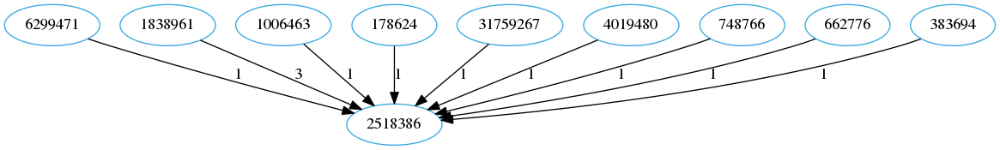

mean distance  2.6431200687890555
Project name: Transportr, project owner: grote, ghtorrent id: 27568159


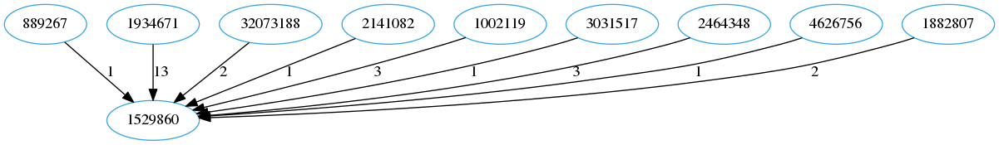

mean distance  2.6431200687890555
Project name: vim-autoformat, project owner: Chiel92, ghtorrent id: 1016248


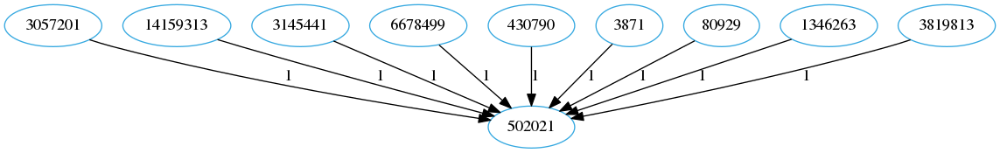

mean distance  2.6431200687890555
Project name: brooklyn-library, project owner: apache, ghtorrent id: 29176124


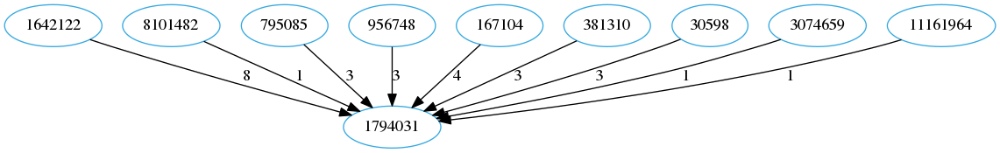

mean distance  2.6431200687890555
Project name: documentation-theme-jekyll, project owner: tomjohnson1492, ghtorrent id: 16823571


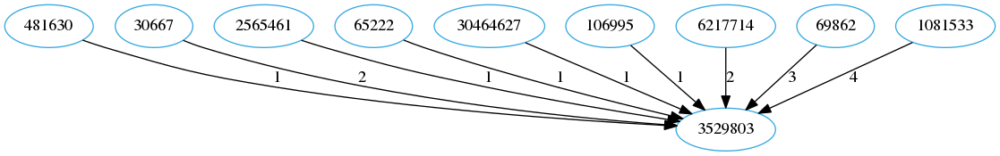

mean distance  2.6431200687890555
Project name: kanan, project owner: cursey, ghtorrent id: 41677415


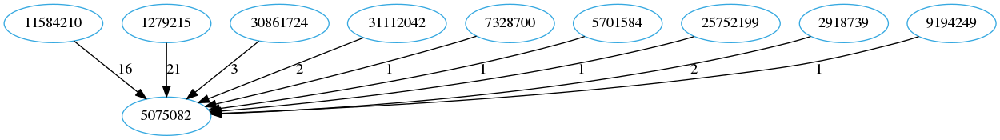

mean distance  2.6431200687890555
Project name: material-dialogs, project owner: afollestad, ghtorrent id: 13095869


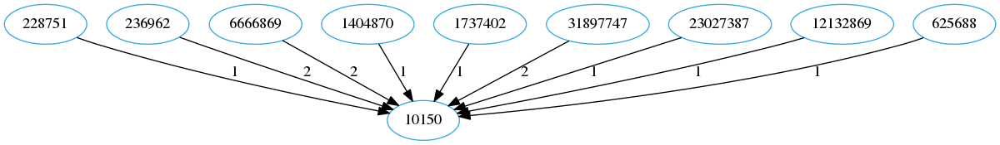

mean distance  2.6431200687890555
Project name: MultivariableCalculus, project owner: siefkenj, ghtorrent id: 50054692


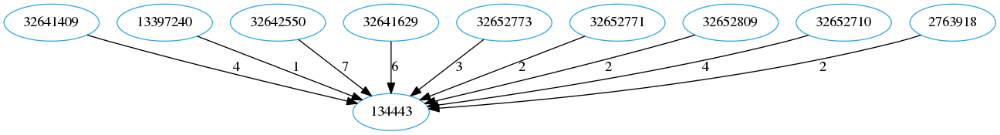

mean distance  2.6431200687890555
Project name: early-career-hawaii, project owner: DDD-Moore, ghtorrent id: 48269380


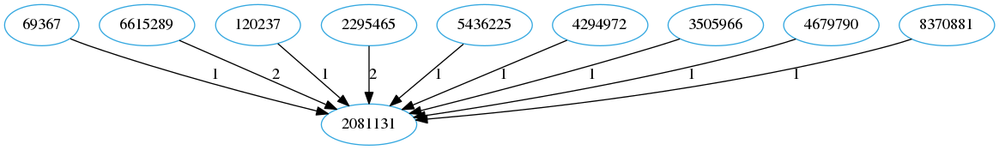

mean distance  2.6431200687890555
Project name: angular-strap, project owner: mgcrea, ghtorrent id: 738430


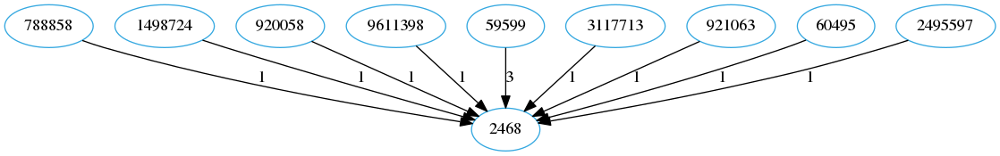

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  10.132352997248264
Project name: boot, project owner: CodeRGV, ghtorrent id: 39693951


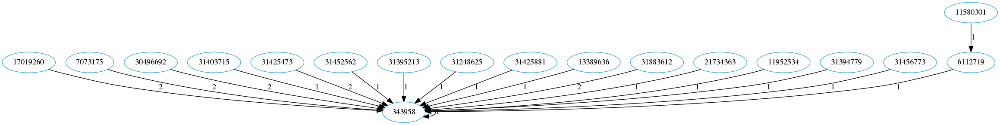

mean distance  10.38470853444243
Project name: PromiseKit, project owner: mxcl, ghtorrent id: 8992078


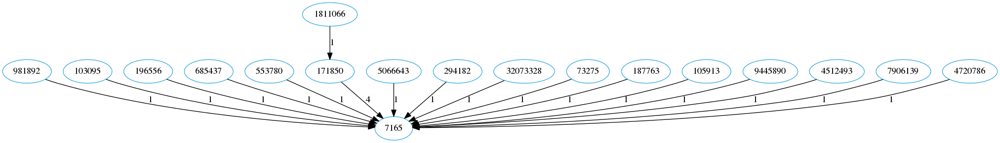

mean distance  10.384708534442431
Project name: docker-sync, project owner: EugenMayer, ghtorrent id: 40899702


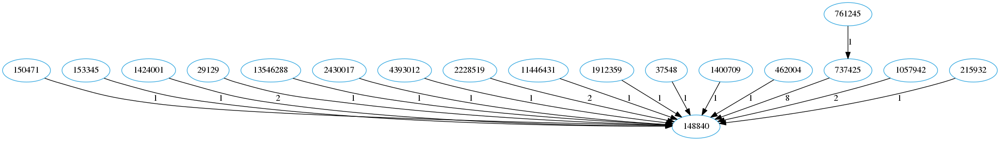

mean distance  10.668468439184547
Project name: react-native-image-picker, project owner: marcshilling, ghtorrent id: 21040730


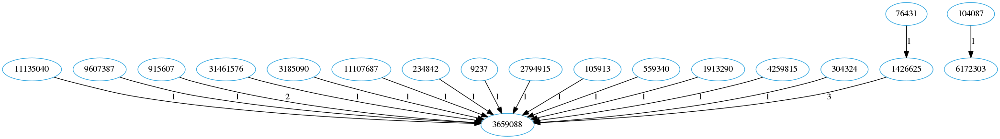

mean distance  10.79631678588232
Project name: rojak, project owner: pyk, ghtorrent id: 47352003


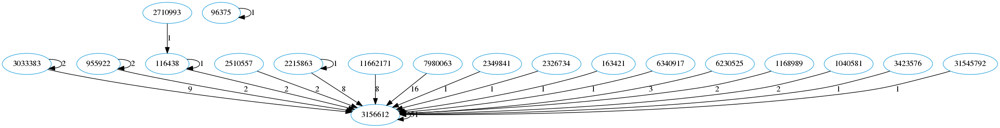

mean distance  10.79972922064571
Project name: lego, project owner: xenolf, ghtorrent id: 21239186


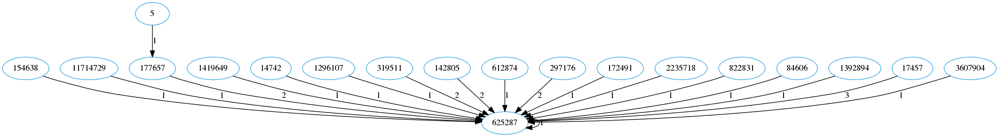

mean distance  10.826225651331182
Project name: homebrew-shopify, project owner: Shopify, ghtorrent id: 14807443


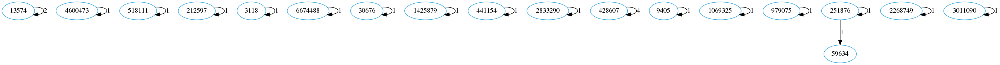

mean distance  10.857872729907763
Project name: laravel-medialibrary, project owner: Spatie, ghtorrent id: 20374325


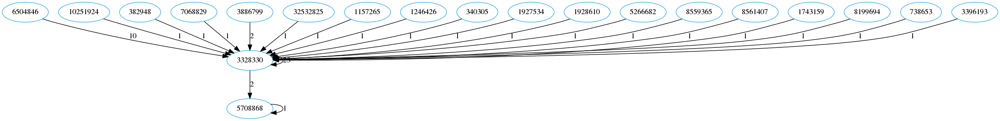

mean distance  10.897509985769222
Project name: flatpak.github.io, project owner: flatpak, ghtorrent id: 37298662


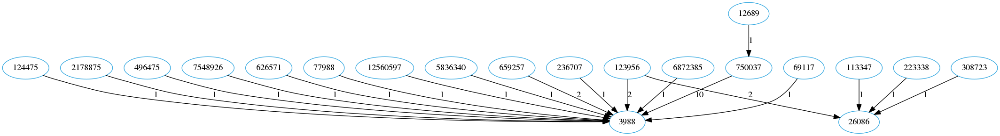

mean distance  10.960781711848743
Project name: chain, project owner: chain, ghtorrent id: 49081522


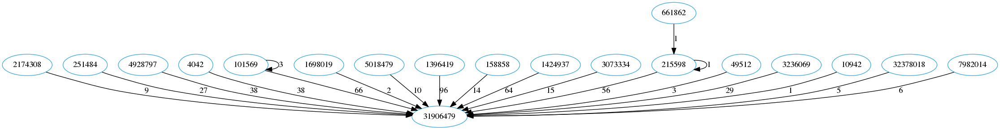

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [157]:
draw_most_representatives(cluster0s, feature_vecs_8to20, 10, 0, 0, colors[0])

### Explore  cluster 2 (cluster2s)

To see what kind of projects are in the second cluster (cluster2s) we desplay the 10 projects that on average have the smallest distance to all other projects in the cluster.
Furthermore, the function below subsequently also displays the 10 projects that have the biggest distance to all other projects in the cluster. These are the projects on the periphery of the cluster.

We see that all projects show a complex form with not a single central maintainer but several maintainers. All projects exhibit some form of transitity and reciprocity between at least some members of the group.


Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  8.57897815112223
Project name: kumascript, project owner: mozilla, ghtorrent id: 52973


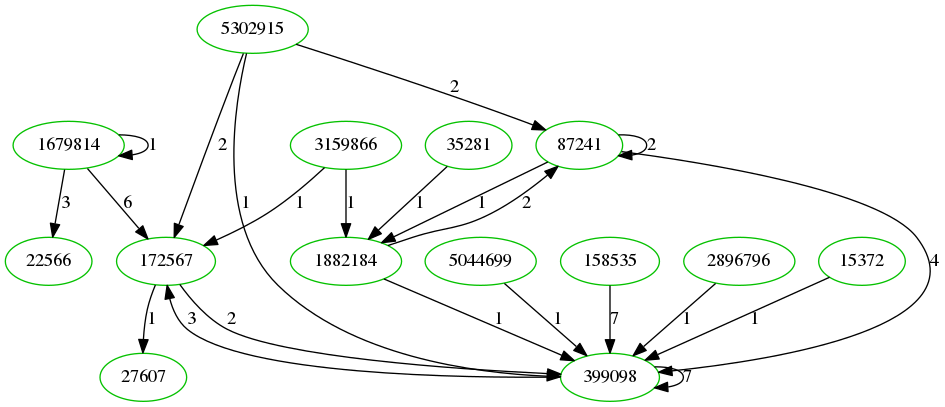

mean distance  8.629692044256952
Project name: hiyaoroshigo, project owner: matsueoss, ghtorrent id: 43818409


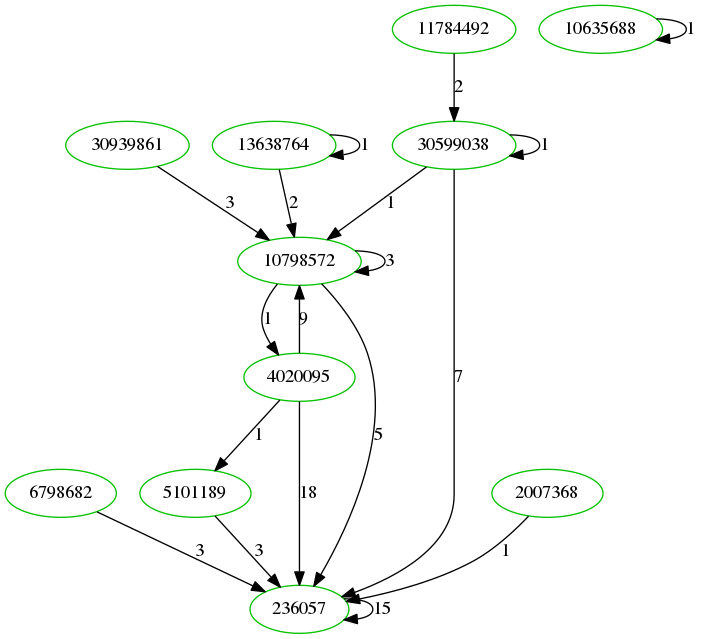

mean distance  8.701780252044358
Project name: p4c, project owner: p4lang, ghtorrent id: 52891428


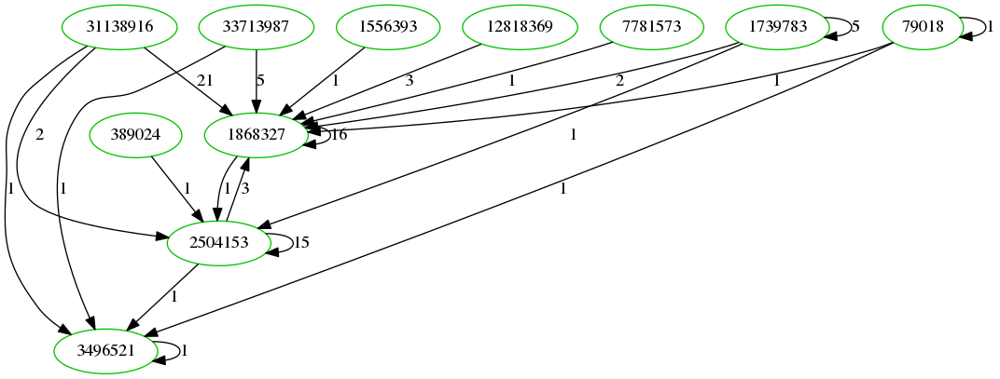

mean distance  8.705431314708605
Project name: travis-api, project owner: travis-ci, ghtorrent id: 59351


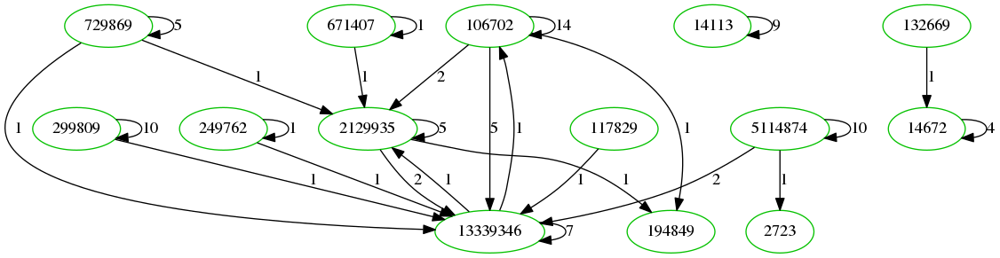

mean distance  8.709909871272478
Project name: prestashop.github.io, project owner: PrestaShop, ghtorrent id: 17251585


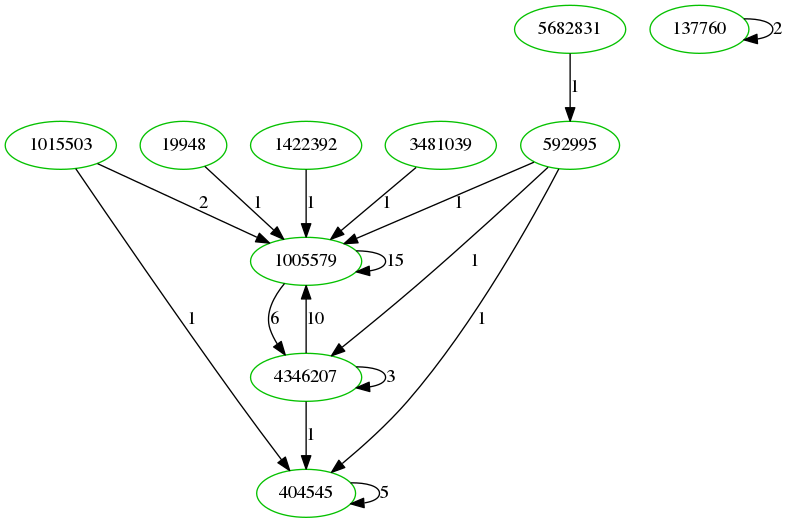

mean distance  8.73793311942264
Project name: WhereHows, project owner: linkedin, ghtorrent id: 33029881


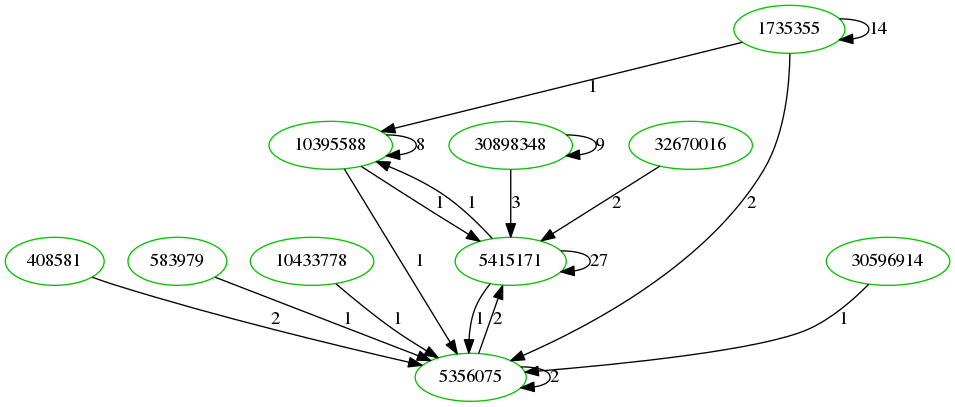

mean distance  8.739302269397973
Project name: scale, project owner: ngageoint, ghtorrent id: 28941838


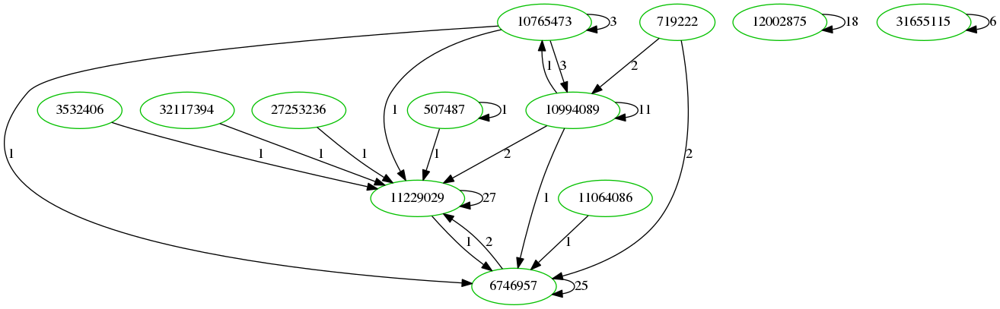

mean distance  8.753843156599524
Project name: gcon, project owner: gopheracademy, ghtorrent id: 52575002


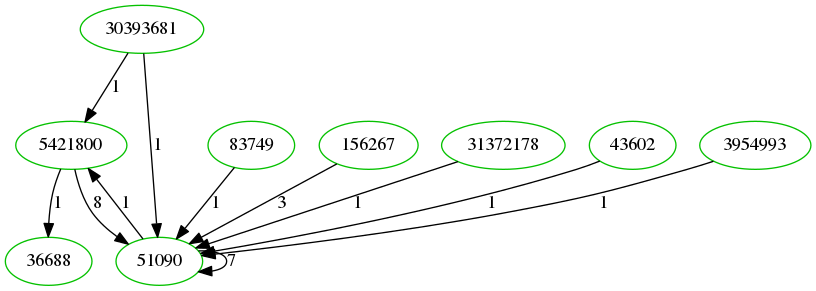

mean distance  8.76361476232804
Project name: CS-190-F2016, project owner: Purdue-CSUSB, ghtorrent id: 40844290


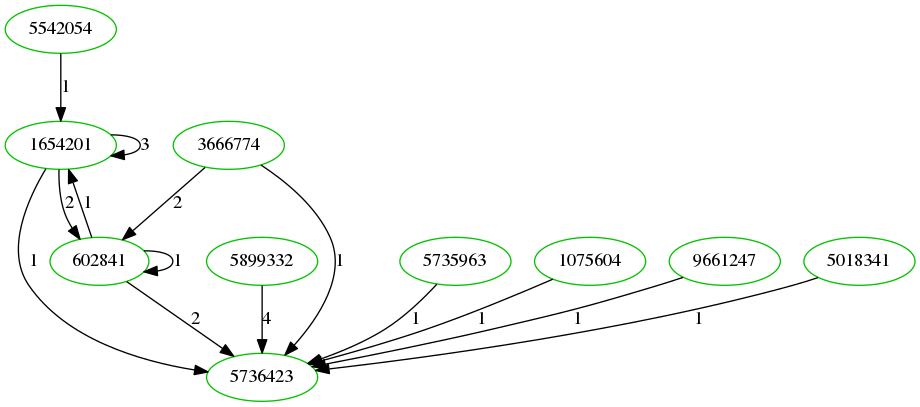

mean distance  8.7860455223121
Project name: orange3-prototypes, project owner: biolab, ghtorrent id: 24914194


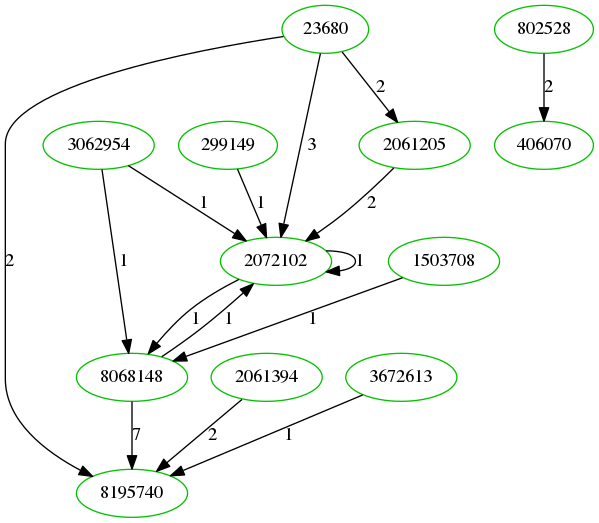

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  34.63449730997445
Project name: amp, project owner: appcelerator, ghtorrent id: 39288643


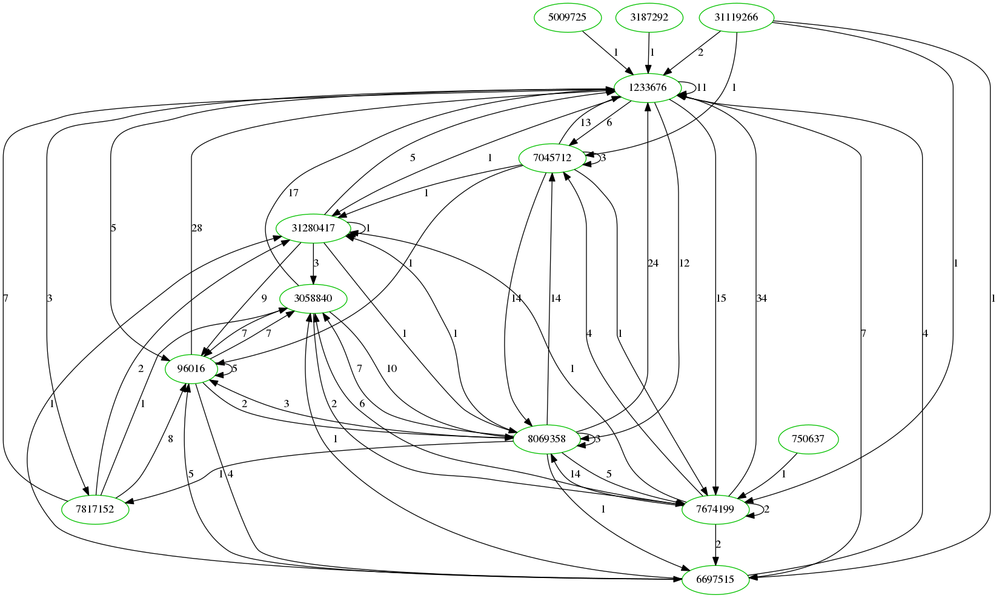

mean distance  35.678501890256825
Project name: hoist, project owner: BonnyCI, ghtorrent id: 50439493


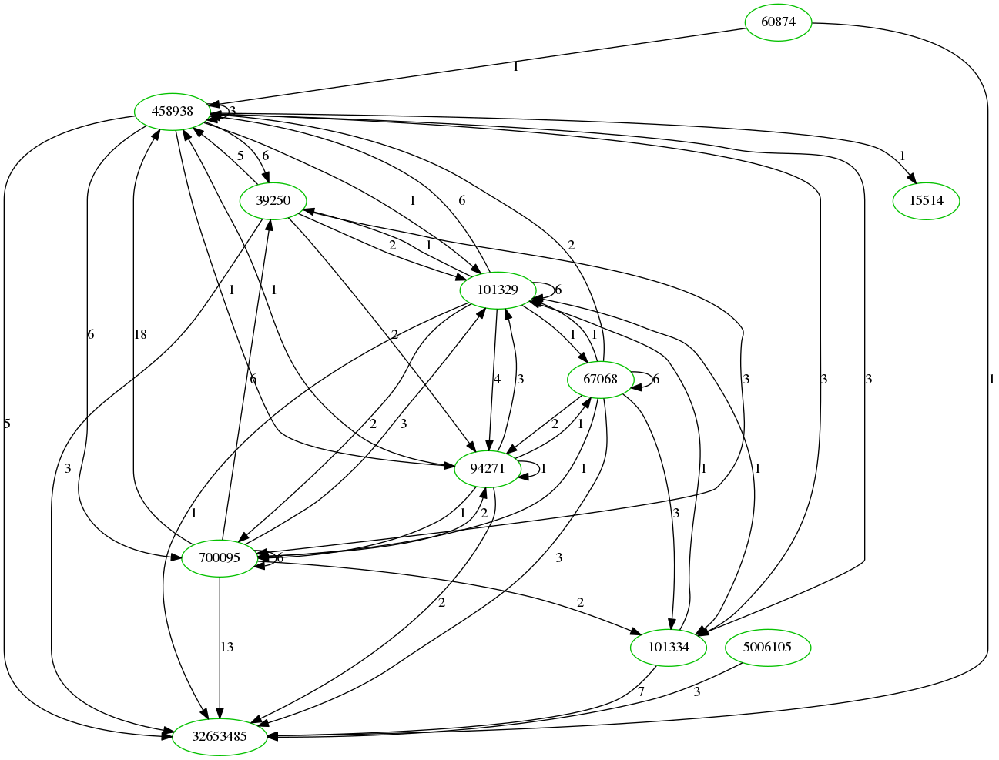

mean distance  36.42151413127459
Project name: h, project owner: hypothesis, ghtorrent id: 58572


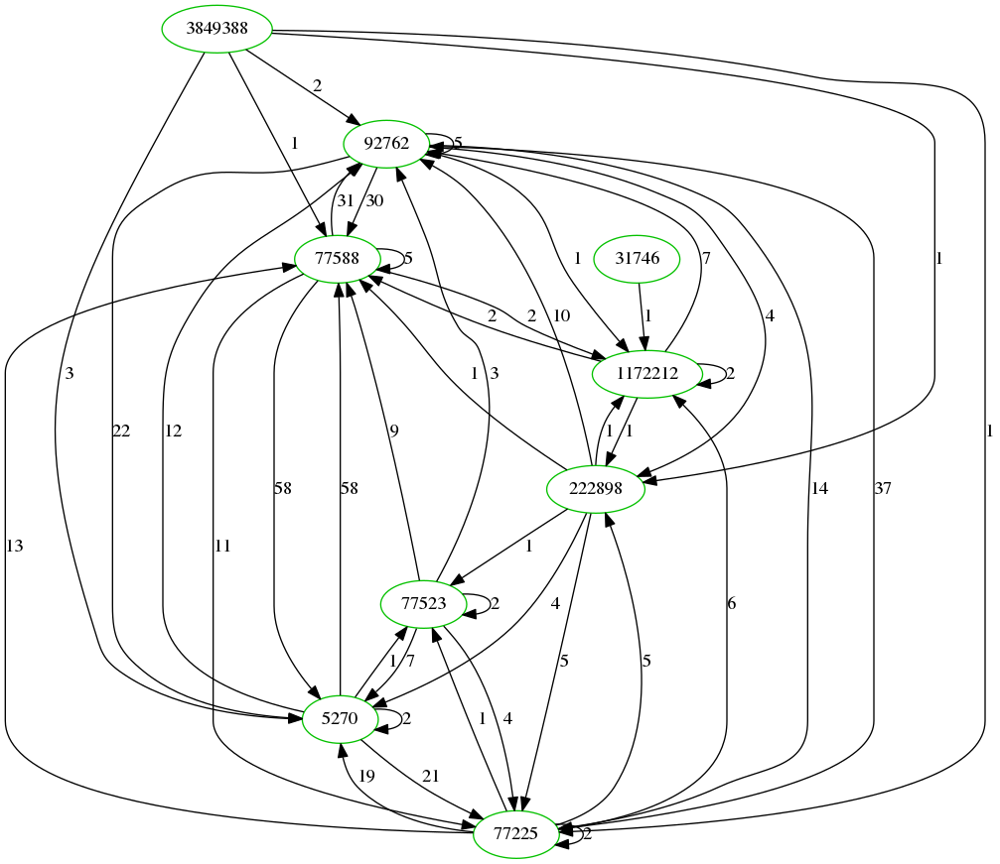

mean distance  38.121114481427234
Project name: fset-faststream-frontend, project owner: hmrc, ghtorrent id: 41128998


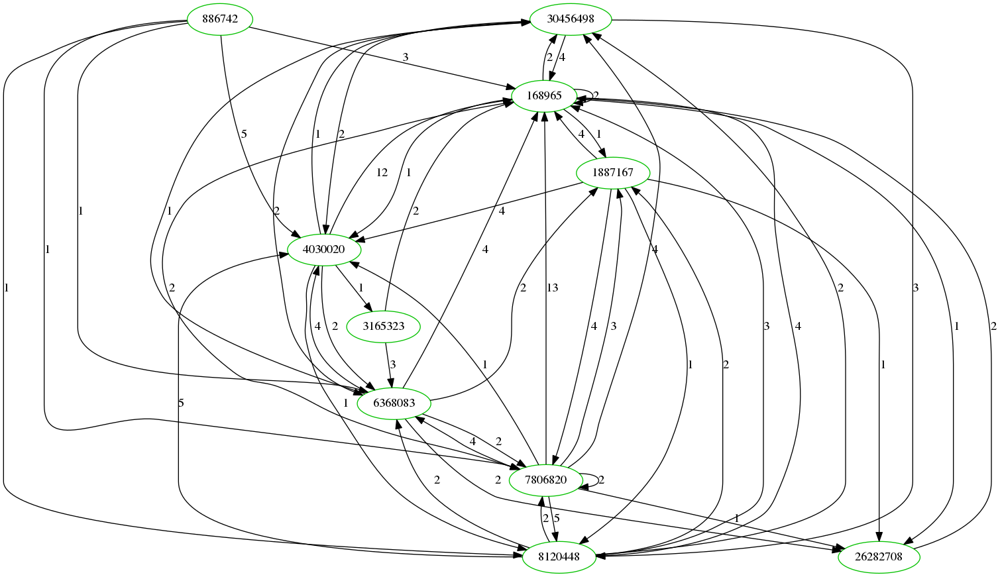

mean distance  40.37317515338091
Project name: www.ubuntu.com, project owner: ubuntudesign, ghtorrent id: 40797811


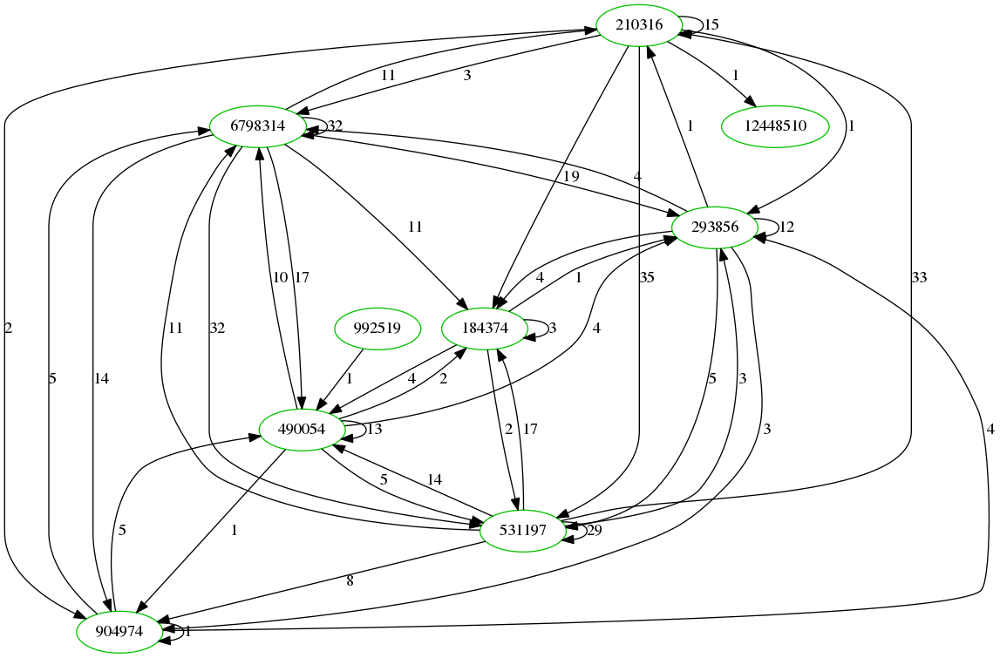

mean distance  41.61691035414298
Project name: investment-tax-relief-submission-frontend, project owner: hmrc, ghtorrent id: 38819714


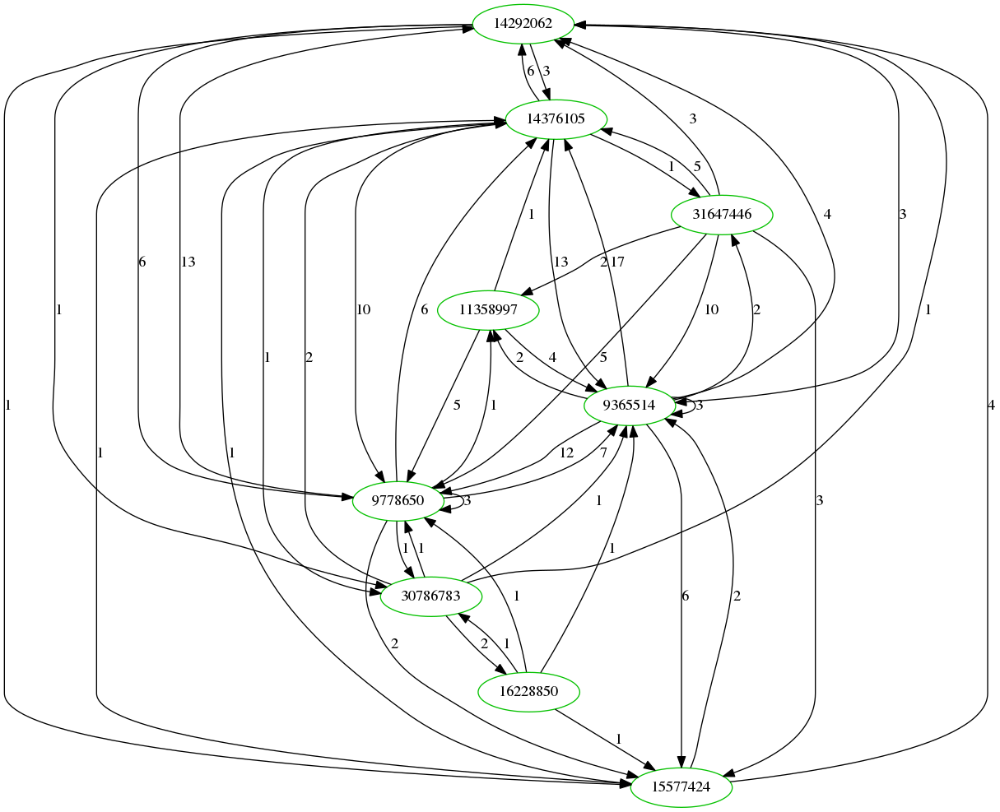

mean distance  43.73746050648417
Project name: kuzzle, project owner: kuzzleio, ghtorrent id: 23725660


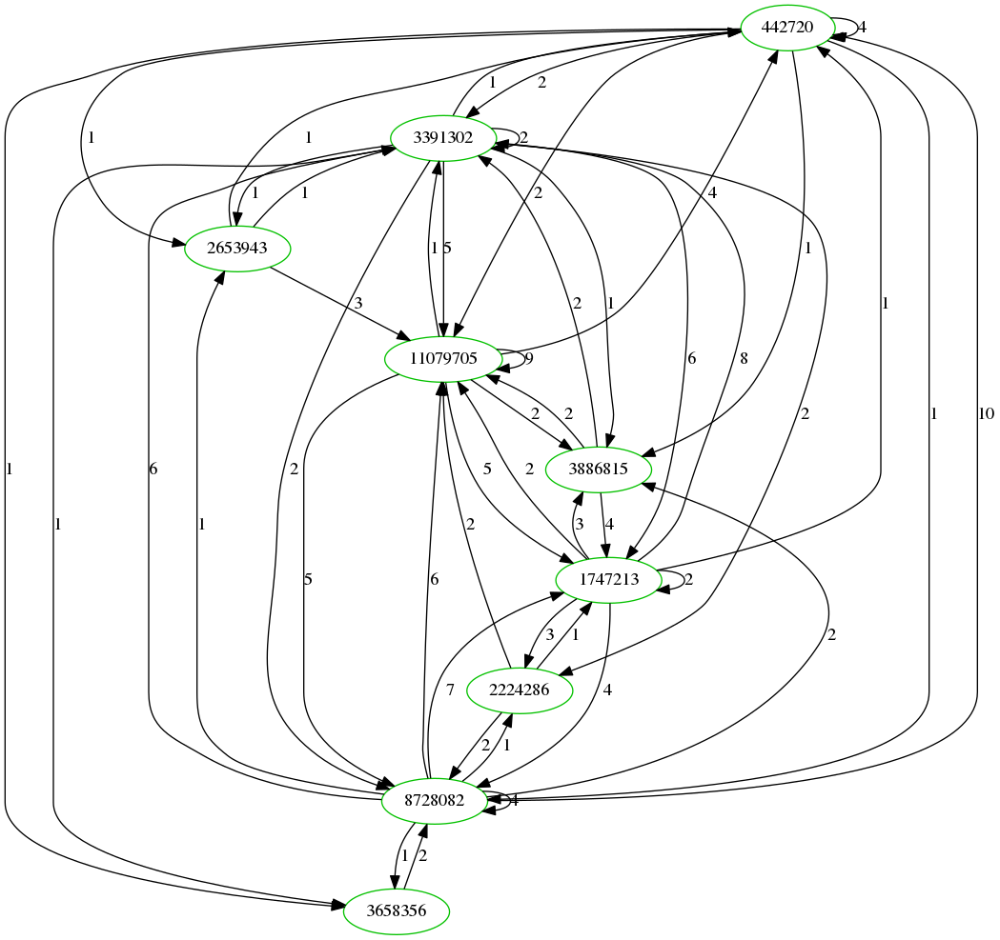

mean distance  43.76291217880418
Project name: calcentral, project owner: ets-berkeley-edu, ghtorrent id: 424371


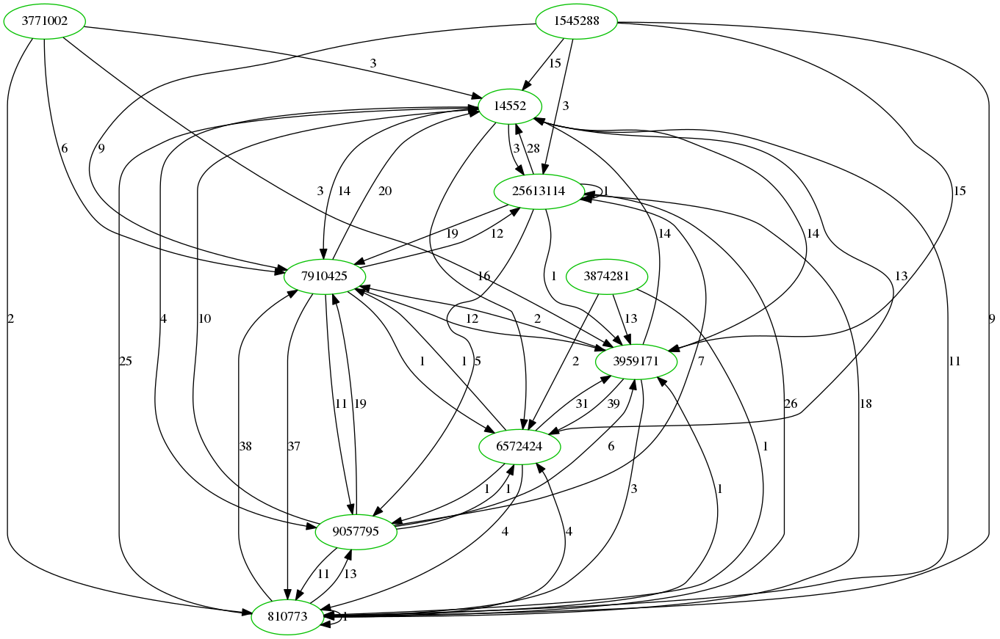

mean distance  47.62536172871059
Project name: int-perl, project owner: a-panayotopoulos, ghtorrent id: 45897740


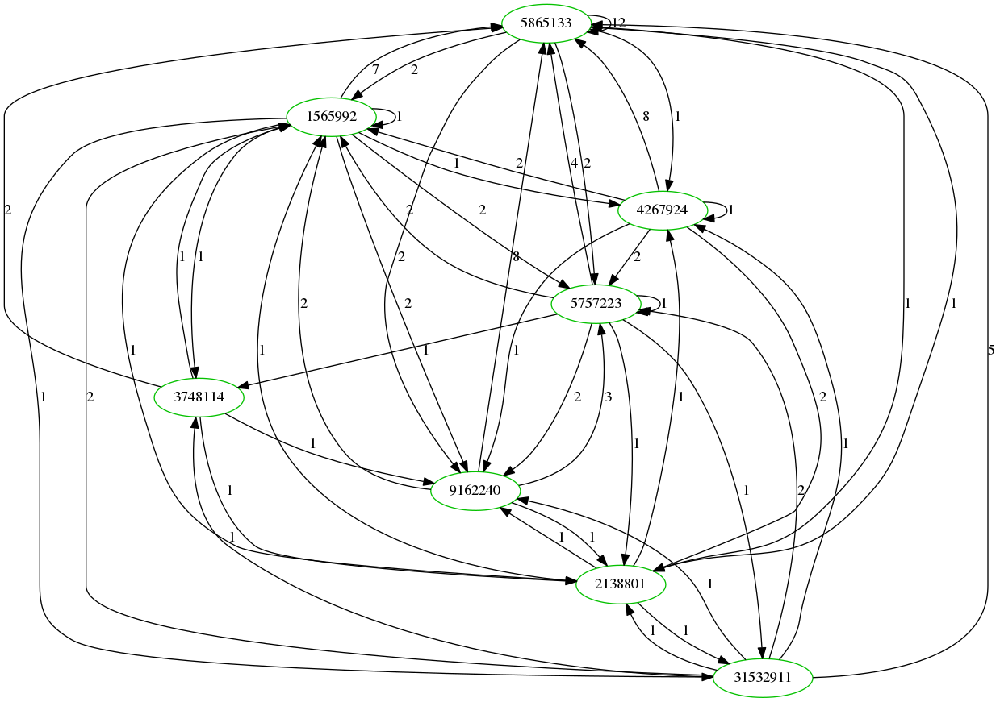

mean distance  53.169086486008936
Project name: quasar, project owner: quasar-analytics, ghtorrent id: 27825237


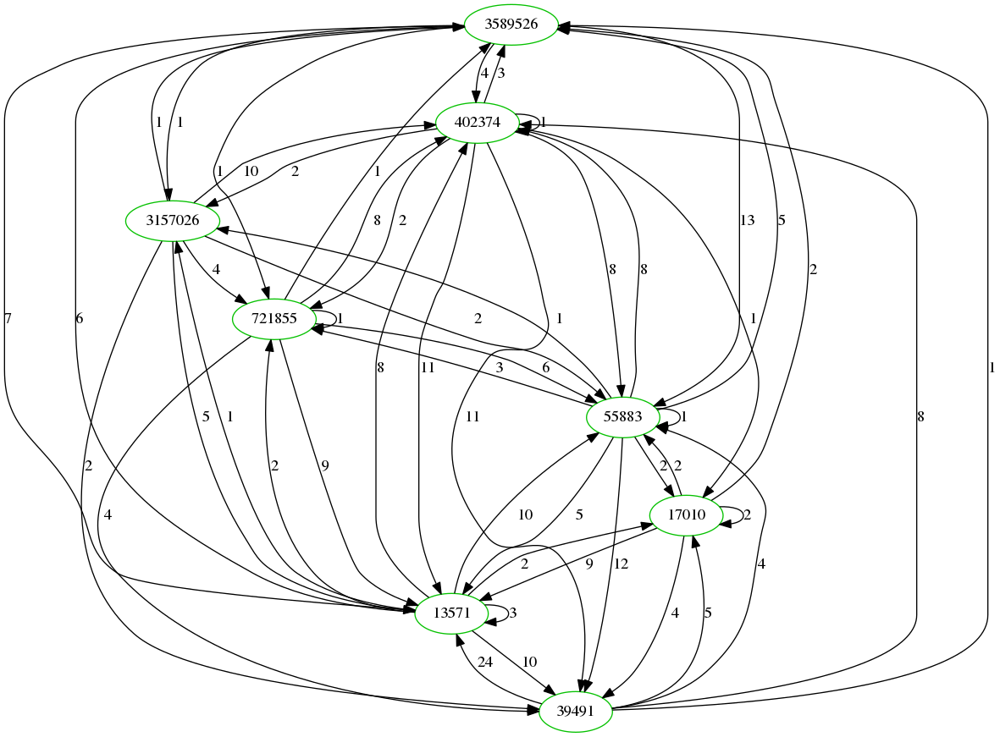

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [158]:
draw_most_representatives(cluster2s, feature_vecs_8to20, 10, 0, 0, colors[1])

### Explore cluster 3 (cluster1s)

To see what kind of projects are in the third cluster (cluster1s) we desplay the 10 projects that on average have the smallest distance to all other projects in the cluster.
Furthermore, the function below subsequently also displays the 10 projects that have the biggest distance to all other projects in the cluster. These are the projects on the periphery of the cluster.

This cluster seems to still possess a huge variety of different structures and we can not see a clear intuitive interpretation.
The commonality of the central projects and the projects on the periphery seems to be, that they do not fit in the other two clusters. Many projects seem to degenerate into several components

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  4.840821593232248
Project name: proj.4, project owner: OSGeo, ghtorrent id: 17650217


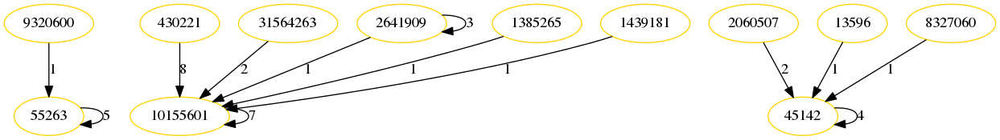

mean distance  4.850648350584756
Project name: dolores-landingham-slack-bot, project owner: 18F, ghtorrent id: 43823987


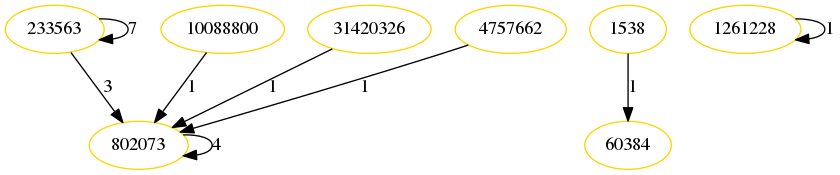

mean distance  4.850648350584756
Project name: twilio-csharp, project owner: twilio, ghtorrent id: 52181


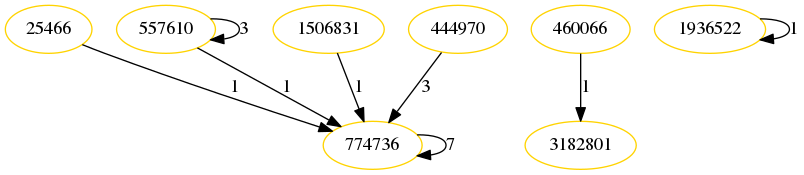

mean distance  4.855197360180376
Project name: build, project owner: boostorg, ghtorrent id: 2778687


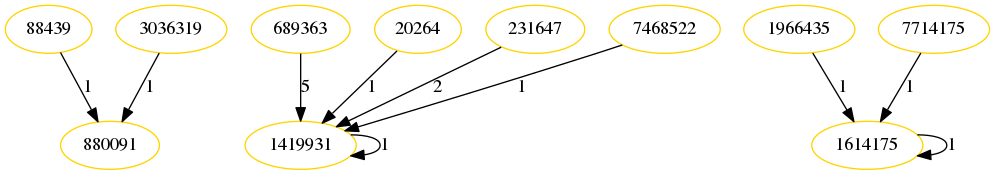

mean distance  4.855926072024067
Project name: purescript-maps, project owner: purescript, ghtorrent id: 8444565


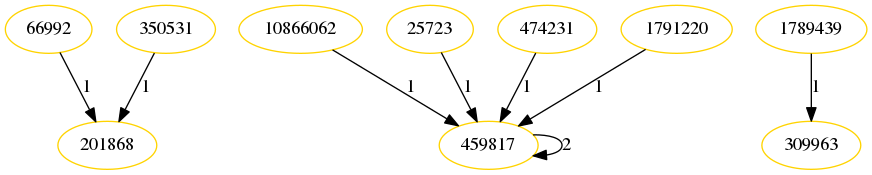

mean distance  4.858517955495185
Project name: paper-slider, project owner: PolymerElements, ghtorrent id: 19897236


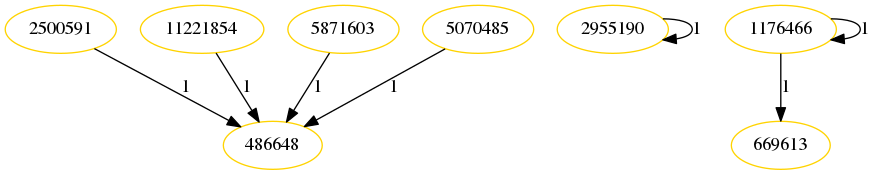

mean distance  4.861465037774267
Project name: go-pivnet, project owner: pivotal-cf, ghtorrent id: 45272984


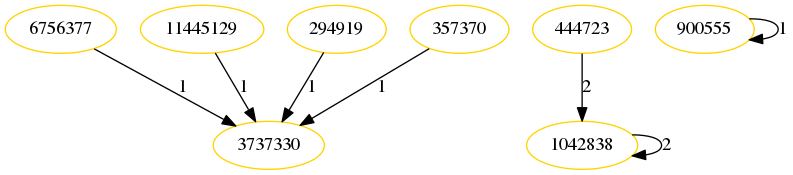

mean distance  4.866933913280103
Project name: spring-petclinic, project owner: spring-projects, ghtorrent id: 5297839


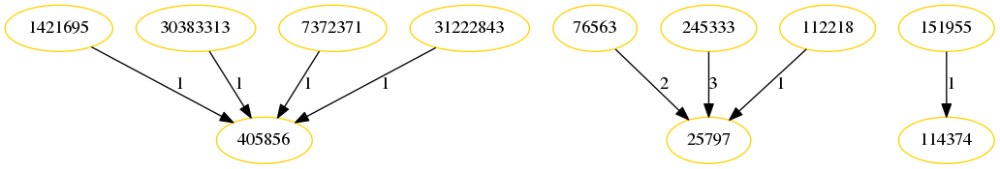

mean distance  4.8669339132801035
Project name: state_machines, project owner: state-machines, ghtorrent id: 13546346


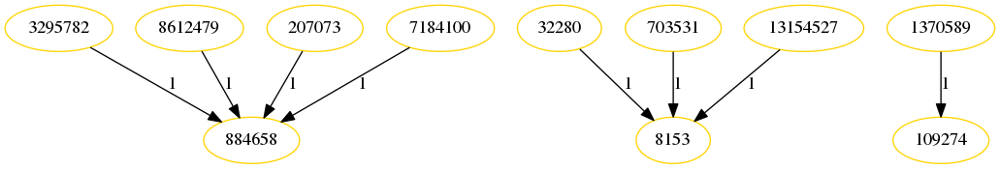

mean distance  4.8669339132801035
Project name: less-docs, project owner: less, ghtorrent id: 4232071


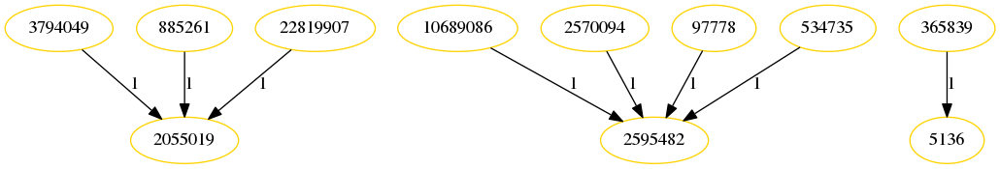

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  16.390342569744156
Project name: OMS-Agent-for-Linux, project owner: Microsoft, ghtorrent id: 29258503


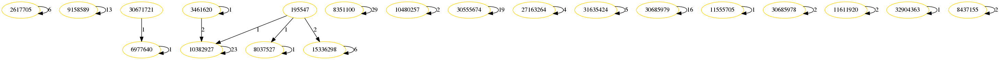

mean distance  16.762687555169617
Project name: next-product-selector, project owner: Financial-Times, ghtorrent id: 21391687


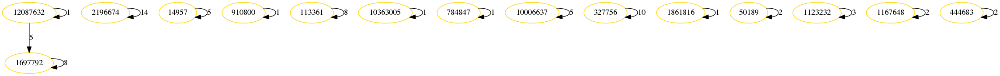

mean distance  16.818576149120023
Project name: developers-dec-2016, project owner: githubteacher, ghtorrent id: 51913182


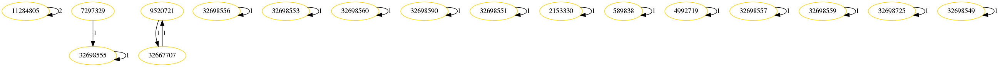

mean distance  17.26459808091103
Project name: feb-27, project owner: githubteacher, ghtorrent id: 58297392


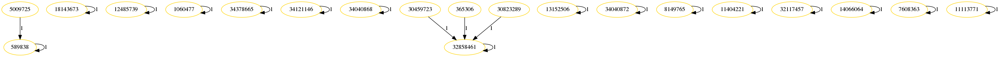

mean distance  17.45714517631487
Project name: Common, project owner: aspnet, ghtorrent id: 16439239


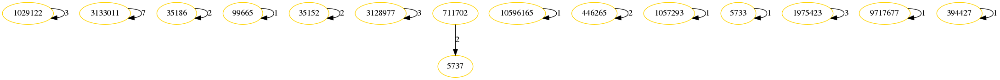

mean distance  18.496162864153153
Project name: everyone-sdfe-12-2016, project owner: praqma-training, ghtorrent id: 52635524


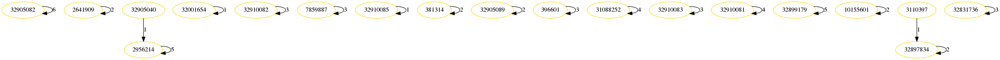

mean distance  20.43036073321065
Project name: homebrew-shopify, project owner: Shopify, ghtorrent id: 14807443


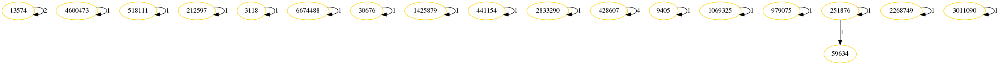

mean distance  21.42983851574365
Project name: oct-04-dev, project owner: githubteacher, ghtorrent id: 47472936


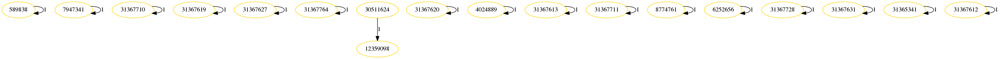

mean distance  21.845366659111015
Project name: dev-dec-19, project owner: githubteacher, ghtorrent id: 53019708


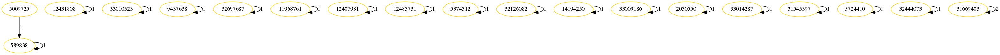

mean distance  21.92429484528976
Project name: devs-september, project owner: githubteacher, ghtorrent id: 45268976


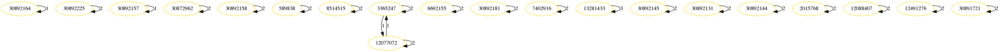

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [118]:
draw_most_representatives(cluster1s, feature_vecs_8to20, 10, 0, 0, colors[2])

### Second level clustering on cluster 3 (cluster1s)
Since cluster1s still shows a lot of variety in terms of network structures, we perform a second level clustering on this cluster.
We follow the same reasoning as before only on the subset of projects that belong to cluster 3 (cluster1s).

->  we create a similarity network in which similar projects are connected by a weighted tie that depends on the distance between projects. We introduce a treshold distance at which nodes do not have a tie anymore. We do not want projects that have a great distance to be connected. At the same time we do not want the cluster solution to depend explicitly on the treshold. We therefore vary the threshold and try to find a stable cluster solution. We vary the treshold starting roughly from the  mean distance between all project to two times the mean distance (i.e from 10 to 19). 

In [28]:
np.random.seed(seed=123)
no_partitions2=defaultdict(list)
partitions2={}
modularities2={}

nodes= cluster1s
Y=distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)
for treshold in range(10,20,1):

    tuples=combinations(nodes,2)

    G=nx.Graph()

    G.add_weighted_edges_from([(*indeces,(treshold - dist)/treshold) for indeces, dist in zip(tuples,Y) if dist < treshold ])

    G_nodes=G.nodes
    for node in nodes:
        if node not in G_nodes:
            G.add_node(node)
    #compute the best partition
    
   
    for res in [(0.1*x+ 0.8) for x in range(7)]:
        try:
            partition1s = community.best_partition(G, resolution=res)
            modularity1s=community.modularity(partition1s, G, weight='weight')
            name="tresh" + str(treshold) + "-res-"+str(res)[:4]
            partitions2[name]=partition1s
            modularities2[name]=modularity1s
            print(treshold, res, len(set(partition1s.values())))
            print("modularity ", modularity1s)
            no_partitions2[str(treshold)].append(len(set(partition1s.values())))
        except:
            print("fail")
            pass

10 0.8 110
modularity  0.04539074868080807
10 0.9 9
modularity  0.06587797895019931
10 1.0 3
modularity  0.07578931650639341
10 1.1 2
modularity  0.06265279309861416
10 1.2000000000000002 1
modularity  -2.609024107869118e-14
10 1.3 1
modularity  -2.609024107869118e-14
10 1.4000000000000001 1
modularity  -2.609024107869118e-14
11 0.8 161
modularity  0.03358807107604383
11 0.9 10
modularity  0.05237443503121769
11 1.0 3
modularity  0.0638078281329282
11 1.1 2
modularity  0.05261131770767871
11 1.2000000000000002 1
modularity  -1.9451107391432743e-13
11 1.3 1
modularity  -1.9451107391432743e-13
11 1.4000000000000001 1
modularity  -1.9451107391432743e-13
12 0.8 214
modularity  0.02432599355217329
12 0.9 13
modularity  0.04280610845412564
12 1.0 3
modularity  0.05500752238245246
12 1.1 2
modularity  0.045269227323938954
12 1.2000000000000002 1
modularity  7.771561172376096e-14
12 1.3 1
modularity  7.771561172376096e-14
12 1.4000000000000001 1
modularity  7.771561172376096e-14
13 0.8 288
mod

In [98]:
pickle.dump(partitions2, open("data/partitions_level2", "wb"))
pickle.dump(modularities2, open("data/modularities_level2", "wb"))

In [16]:
partitions2 = pickle.load(open("data/partitions_level2", "rb"))
modularities2 = pickle.load(open("data/modularities_level2", "rb"))

# subcluster sizes

In [17]:
no_p_clean2=[]
no_singlets2=[]
for treshold in range(10,20,1):
    counts=[]
    singletsn=[]
    for res in [(0.1*x+0.8) for x in range(7)]:
        name="tresh" + str(treshold) + "-res-"+str(res)[:4]
        tp=partitions2[name]
        d = defaultdict(int)
        for k,v in tp.items():
            d[v]+=1

        count=0
        singlets=0
        for k,v in d.items():
            if v>20:
                count+=1
            else:
                singlets+=1
        counts.append(count)
        singletsn.append(singlets)
    no_p_clean2.append(counts)
    no_singlets2.append(singletsn)



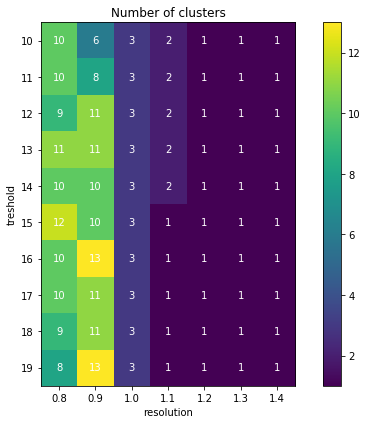

In [18]:
xticks=['0.8', '0.9', '1.0', '1.1', '1.2', '1.3', '1.4']
yticks=['10','11', '12', '13', '14', '15', '16', '17', '18', '19']

dmat=np.array(no_p_clean2)

fig, ax = plt.subplots(figsize = (8,6))
im = ax.imshow(dmat)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*dmat.nonzero()):
    ax.text(j, i, dmat[i, j], color='white', ha='center', va='center')

ax.set_title("Number of clusters")
plt.xlabel("resolution")
plt.ylabel("treshold")
fig.tight_layout()
plt.colorbar(im)
fig.savefig('clustermatrix.png', dpi=300)
plt.show()

# Stability of cluster solutions

To have a quantitative measure for the stability of the cluster solutions with respect to the treshold parameter we calculate
both the adjusted rand score and the adjusted mutual information for each pair of cluster solutions with the same resolution parameter. 

In [19]:
nodes = cluster1s
resolutions = [(0.1*x+0.8) for x in range(4)] #we only look at r<1.1 because for r>=1.2 we only get a single cluster
avg_ari = []
ari_matrices = []
avg_ami = []
ami_matrices = []

for res in resolutions:
    names=["tresh" + str(treshold) + "-res-"+str(res)[:4] for treshold in range(10,20,1)]
    ari_matrix=[]
    ami_matrix=[]
    for i in range(len(names)):
        arr_ari = []
        arr_ami = []
        for j in range(len(names)):
            p1 = partitions2[names[i]]
            p2 = partitions2[names[j]]
            ari = adjusted_rand_score([p1[n] for n in nodes], [p2[n] for n in nodes])
            ami = adjusted_mutual_info_score([p1[n] for n in nodes], [p2[n] for n in nodes])
            arr_ari.append(ari)       
            arr_ami.append(ami)
        ari_matrix.append(arr_ari)
        ami_matrix.append(arr_ami)
    ari_matrices.append(ari_matrix)
    ami_matrices.append(ami_matrix)
    avg_ari.append(np.mean(ari_matrix))
    avg_ami.append(np.mean(ami_matrix))
    

/home/trurl/anaconda3/envs/myenv/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Below we plot the average adjusted rand index and the average adjusted mutual information for all pairs of partitions from the cluster solutions with the same resolution parameter. We clearly see a maximum in partition stability for the cluster solutions with resolution parameter 1.0, where the obtained partitions show the highes congruence for different tresholds.

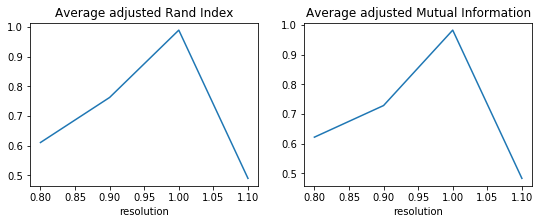

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(9, 3))
axs[0].plot(resolutions, avg_ari)
axs[0].set_title("Average adjusted Rand Index")
axs[0].set_xlabel("resolution")

axs[1].plot(resolutions, avg_ami)
axs[1].set_title("Average adjusted Mutual Information")
axs[1].set_xlabel("resolution")
plt.show()

Again we choose the resolution parameter 1.0 since there is the first clear plateau and it has a clear meaning with classic modularity. Subsequently we proceed as before and vary the tresholds values to clean the clusters and only keep the ones that are consistently classified in the same cluster.

# modularity

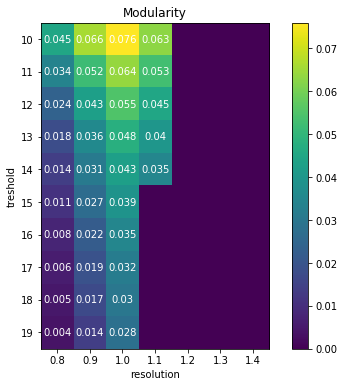

In [21]:

modularities_plot=[]
for treshold in range(10,20,1):
    m_arr = []
    for res in [(0.1*x+0.8) for x in range(7)]:
        name="tresh" + str(treshold) + "-res-"+str(res)[:4]
        m = modularities2[name]
        m_arr.append(m)
    modularities_plot.append(m_arr)

modularities_coeff=np.round(np.array(modularities_plot),3)

fig, ax = plt.subplots(figsize = (8,6) )
im = ax.imshow(modularities_coeff)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*modularities_coeff.nonzero()):
    ax.text(j, i, modularities_coeff[i, j], color='white', fontsize = 10, ha='center', va='center')

plt.colorbar(im)
ax.set_title("Modularity")
plt.xlabel("resolution")
plt.ylabel("treshold")
#fig.tight_layout()
#plt.colorbar(modularities_coeff)
#fig.savefig('clustermatrix.png', dpi=300)
plt.show()

# Dunn's index

In [23]:
dunns_index_centroids_dict2 = {}
for key in partitions2:
    partition = partitions2[key]
    if len(np.unique(list(partition.values())))>1: #check that partition has at least two clusters
        nodes = list(partition.keys())
        vecs=[feature_vecs_8to20[n] for n in nodes]
        labels = [partition[n] for n in nodes]
        di = dunn_centroids(labels, vecs, min_cluster_size = 5)    
        dunns_index_centroids_dict2[key]=di

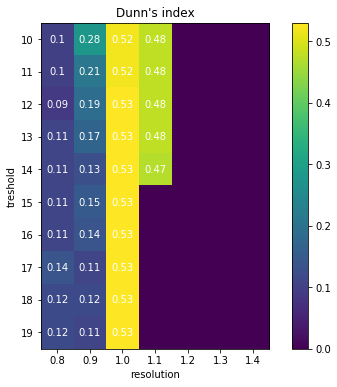

In [24]:

xticks=['0.8', '0.9', '1.0', '1.1', '1.2', '1.3', '1.4']
yticks=['10', '11', '12','13', '14', '15', '16', '17', '18', '19']

dunns_index_centroids_plot=[]
for treshold in range(10,20,1):
    m_arr = []
    for res in [(0.1*x+0.8) for x in range(7)]:
        name="tresh" + str(treshold) + "-res-"+str(res)[:4]
        try:
            m = dunns_index_centroids_dict2[name]
        except:
            m = 0
        m_arr.append(m)
    dunns_index_centroids_plot.append(m_arr)

dunns_index_centroids_coeff=np.round(np.array(dunns_index_centroids_plot),2)

fig, ax = plt.subplots(figsize = (8,6) )
im = ax.imshow(dunns_index_centroids_coeff)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*dunns_index_centroids_coeff.nonzero()):
    ax.text(j, i, dunns_index_centroids_coeff[i, j], color='white', fontsize = 10, ha='center', va='center')
plt.colorbar(im)

ax.set_title("Dunn's index")
plt.xlabel("resolution")
plt.ylabel("treshold")
#fig.tight_layout()
#plt.colorbar(modularities_coeff)
#fig.savefig('clustermatrix.png', dpi=300)
plt.show()

# connectedness

In [38]:
nodes = list(cluster1s)
dists=distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)
dists = distance.squareform(dists)

In [39]:
sorted_dists = [np.argsort(dists[i]) for i in range(len(nodes))]
sorted_dists = [sorted_dists[i][sorted_dists[i]!=i] for i in range(len(nodes))] #remove distance to itself


In [40]:
index_dict = {node:i for i,node in enumerate(nodes)} 

In [41]:
def connectedness(partition, l=5):
    conn = 0
    for node in partition:
        node_cl = partition[node]
        ind = index_dict[node]
        neighbors_idxs = sorted_dists[index_dict[node]][:l]
        for j,neighbor_idx in enumerate(neighbors_idxs):
            neighbor = nodes[neighbor_idx]
            if partition[neighbor]!=node_cl:
                conn+= 1/(j+1)
    return conn/len(partition)

In [42]:
connectedness_dict2 = {}
for key in partitions2:
    c = connectedness(partitions2[key],5)
    
    print(key)
    for p in range(len(set(partitions2[key].values()))):
        print("cluster ", p, len([node for node in partitions2[key] if partitions2[key][node]==p]))
        
    print("connectedness", c)
    connectedness_dict2[key]=c

tresh10-res-0.8
cluster  0 133
cluster  1 251
cluster  2 290
cluster  3 1
cluster  4 74
cluster  5 96
cluster  6 218
cluster  7 3
cluster  8 26
cluster  9 4
cluster  10 2
cluster  11 15
cluster  12 8
cluster  13 20
cluster  14 2
cluster  15 48
cluster  16 3
cluster  17 17
cluster  18 21
cluster  19 4
cluster  20 13
cluster  21 1
cluster  22 14
cluster  23 2
cluster  24 4
cluster  25 1
cluster  26 8
cluster  27 6
cluster  28 1
cluster  29 7
cluster  30 4
cluster  31 6
cluster  32 2
cluster  33 3
cluster  34 7
cluster  35 3
cluster  36 5
cluster  37 3
cluster  38 3
cluster  39 1
cluster  40 1
cluster  41 2
cluster  42 1
cluster  43 1
cluster  44 26
cluster  45 2
cluster  46 1
cluster  47 10
cluster  48 2
cluster  49 5
cluster  50 1
cluster  51 2
cluster  52 1
cluster  53 1
cluster  54 1
cluster  55 3
cluster  56 1
cluster  57 2
cluster  58 2
cluster  59 2
cluster  60 2
cluster  61 3
cluster  62 2
cluster  63 2
cluster  64 1
cluster  65 1
cluster  66 1
cluster  67 1
cluster  68 1
cluster 

cluster  6 88
cluster  7 39
cluster  8 65
cluster  9 84
cluster  10 24
cluster  11 7
cluster  12 4
cluster  13 2
connectedness 0.16526268115942014
tresh13-res-1.0
cluster  0 527
cluster  1 387
cluster  2 558
connectedness 0.039798460144927564
tresh13-res-1.1
cluster  0 805
cluster  1 667
connectedness 0.07546422101449277
tresh13-res-1.20
cluster  0 1472
connectedness 0.0
tresh13-res-1.3
cluster  0 1472
connectedness 0.0
tresh13-res-1.40
cluster  0 1472
connectedness 0.0
tresh14-res-0.8
cluster  0 1
cluster  1 146
cluster  2 98
cluster  3 140
cluster  4 1
cluster  5 1
cluster  6 1
cluster  7 51
cluster  8 50
cluster  9 103
cluster  10 133
cluster  11 64
cluster  12 1
cluster  13 7
cluster  14 1
cluster  15 7
cluster  16 1
cluster  17 1
cluster  18 11
cluster  19 1
cluster  20 3
cluster  21 14
cluster  22 7
cluster  23 1
cluster  24 5
cluster  25 1
cluster  26 27
cluster  27 2
cluster  28 24
cluster  29 11
cluster  30 2
cluster  31 4
cluster  32 1
cluster  33 1
cluster  34 1
cluster  35 

cluster  21 2
cluster  22 1
cluster  23 2
cluster  24 1
cluster  25 1
cluster  26 1
cluster  27 1
connectedness 0.19427083333333273
tresh15-res-1.0
cluster  0 527
cluster  1 386
cluster  2 559
connectedness 0.04112318840579714
tresh15-res-1.1
cluster  0 1472
connectedness 0.0
tresh15-res-1.20
cluster  0 1472
connectedness 0.0
tresh15-res-1.3
cluster  0 1472
connectedness 0.0
tresh15-res-1.40
cluster  0 1472
connectedness 0.0
tresh16-res-0.8
cluster  0 1
cluster  1 12
cluster  2 84
cluster  3 112
cluster  4 115
cluster  5 2
cluster  6 1
cluster  7 1
cluster  8 43
cluster  9 50
cluster  10 26
cluster  11 111
cluster  12 56
cluster  13 1
cluster  14 4
cluster  15 1
cluster  16 7
cluster  17 7
cluster  18 62
cluster  19 1
cluster  20 1
cluster  21 1
cluster  22 1
cluster  23 6
cluster  24 3
cluster  25 1
cluster  26 1
cluster  27 1
cluster  28 11
cluster  29 1
cluster  30 18
cluster  31 1
cluster  32 23
cluster  33 12
cluster  34 4
cluster  35 1
cluster  36 1
cluster  37 1
cluster  38 1
cl

cluster  332 1
cluster  333 1
cluster  334 1
cluster  335 1
cluster  336 1
cluster  337 1
cluster  338 1
cluster  339 1
cluster  340 1
cluster  341 1
cluster  342 1
cluster  343 3
cluster  344 1
cluster  345 1
cluster  346 1
cluster  347 1
cluster  348 1
cluster  349 1
cluster  350 1
cluster  351 2
cluster  352 1
cluster  353 1
cluster  354 1
cluster  355 1
cluster  356 1
cluster  357 1
cluster  358 1
cluster  359 1
cluster  360 1
cluster  361 1
cluster  362 1
cluster  363 1
cluster  364 1
cluster  365 1
cluster  366 1
cluster  367 1
cluster  368 1
cluster  369 1
cluster  370 1
cluster  371 1
cluster  372 1
cluster  373 1
cluster  374 1
cluster  375 1
cluster  376 1
cluster  377 1
cluster  378 1
cluster  379 1
cluster  380 1
cluster  381 1
cluster  382 1
cluster  383 1
cluster  384 1
cluster  385 1
cluster  386 1
cluster  387 1
cluster  388 2
cluster  389 1
cluster  390 2
cluster  391 1
cluster  392 1
cluster  393 2
cluster  394 1
cluster  395 1
cluster  396 1
cluster  397 1
cluster  3

cluster  668 1
cluster  669 1
cluster  670 1
cluster  671 1
cluster  672 1
cluster  673 1
cluster  674 1
cluster  675 1
cluster  676 1
cluster  677 1
cluster  678 1
cluster  679 1
cluster  680 1
cluster  681 1
cluster  682 1
cluster  683 1
cluster  684 1
connectedness 1.199784873188411
tresh18-res-0.9
cluster  0 3
cluster  1 259
cluster  2 243
cluster  3 7
cluster  4 62
cluster  5 77
cluster  6 226
cluster  7 125
cluster  8 7
cluster  9 64
cluster  10 11
cluster  11 8
cluster  12 10
cluster  13 3
cluster  14 15
cluster  15 45
cluster  16 20
cluster  17 20
cluster  18 3
cluster  19 54
cluster  20 20
cluster  21 6
cluster  22 50
cluster  23 2
cluster  24 22
cluster  25 8
cluster  26 14
cluster  27 2
cluster  28 4
cluster  29 3
cluster  30 9
cluster  31 2
cluster  32 1
cluster  33 5
cluster  34 3
cluster  35 3
cluster  36 3
cluster  37 4
cluster  38 1
cluster  39 3
cluster  40 3
cluster  41 8
cluster  42 8
cluster  43 3
cluster  44 1
cluster  45 4
cluster  46 2
cluster  47 4
cluster  48 2

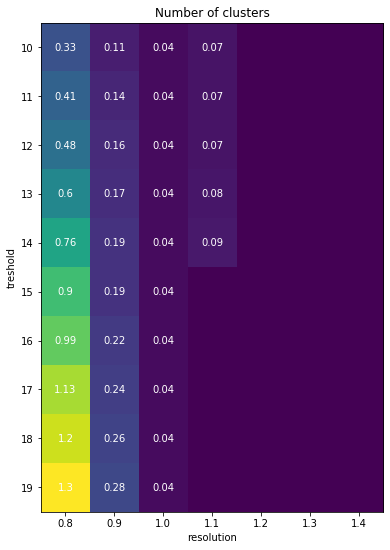

In [43]:

xticks=['0.8', '0.9', '1.0', '1.1', '1.2', '1.3', '1.4']
yticks=['10', '11', '12','13', '14', '15', '16', '17', '18', '19']

connectivities_plot=[]
for treshold in range(10,20,1):
    m_arr = []
    for res in [(0.1*x+0.8) for x in range(7)]:
        name="tresh" + str(treshold) + "-res-"+str(res)[:4]
        m = connectedness_dict2[name]
        m_arr.append(m)
    connectivities_plot.append(m_arr)

connectivities_coeff=np.round(np.array(connectivities_plot),2)

fig, ax = plt.subplots(figsize = (12,9) )
im = ax.imshow(connectivities_coeff)

# We want to show all ticks...
ax.set_xticks(np.arange(len(xticks)))
ax.set_yticks(np.arange(len(yticks)))
# ... and label them with the respective list entries
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)


# Loop over data dimensions and create text annotations.
for i, j in zip(*connectivities_coeff.nonzero()):
    ax.text(j, i, connectivities_coeff[i, j], color='white', fontsize = 10, ha='center', va='center')

ax.set_title("Number of clusters")
plt.xlabel("resolution")
plt.ylabel("treshold")
#fig.tight_layout()
#plt.colorbar(modularities_coeff)
#fig.savefig('clustermatrix.png', dpi=300)
plt.show()

In [43]:
compare_ps=[ 'tresh10-res-1.0', 'tresh11-res-1.0', 'tresh12-res-1.0', 'tresh13-res-1.0', 'tresh14-res-1.0', 'tresh15-res-1.0', 'tresh16-res-1.0', 'tresh17-res-1.0', 'tresh18-res-1.0', 'tresh19-res-1.0']
for k in compare_ps:
    print(k)
    p=partitions2[k]
    cluster1s0=[x for x in p if p[x]==0]
    cluster1s1=[x for x in p if p[x]==1]
    cluster1s2=[x for x in p if p[x]==2]
    print("cluster 0: ", len(cluster1s0))
    print("cluster 1: ", len(cluster1s1))
    print("cluster 2: ", len(cluster1s2))
    print("\n")

tresh10-res-1.0
cluster 0:  527
cluster 1:  402
cluster 2:  543


tresh11-res-1.0
cluster 0:  527
cluster 1:  399
cluster 2:  546


tresh12-res-1.0
cluster 0:  527
cluster 1:  393
cluster 2:  552


tresh13-res-1.0
cluster 0:  527
cluster 1:  387
cluster 2:  558


tresh14-res-1.0
cluster 0:  527
cluster 1:  386
cluster 2:  559


tresh15-res-1.0
cluster 0:  527
cluster 1:  386
cluster 2:  559


tresh16-res-1.0
cluster 0:  527
cluster 1:  386
cluster 2:  559


tresh17-res-1.0
cluster 0:  527
cluster 1:  386
cluster 2:  559


tresh18-res-1.0
cluster 0:  527
cluster 1:  386
cluster 2:  559


tresh19-res-1.0
cluster 0:  527
cluster 1:  386
cluster 2:  559




In [44]:
cluster1s0s=set(cluster1s0)
cluster1s1s=set(cluster1s1)
cluster1s2s=set(cluster1s2)
for key in compare_ps:
    partition=partitions2[key]
    cluster0=[x for x in partition if partition[x]==0]
    cluster1=[x for x in partition if partition[x]==1]
    cluster2=[x for x in partition if partition[x]==2]
    cluster1s0s=cluster1s0s.intersection(set(cluster0))
    cluster1s1s=cluster1s1s.intersection(set(cluster1))
    cluster1s2s=cluster1s2s.intersection(set(cluster2))
print("cluster 0: ", len(cluster1s0s))
print("cluster 1: ", len(cluster1s1s))
print("cluster 2: ", len(cluster1s2s))

cluster 0:  527
cluster 1:  385
cluster 2:  542


In [45]:
garbage=set(partition.keys()).difference(cluster1s0s,cluster1s1s,cluster1s2s)

In [46]:
len(garbage)

18

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  1.8648742472333355
Project name: firstHackDallas-Submissions, project owner: firsthackdallas, ghtorrent id: 50038064


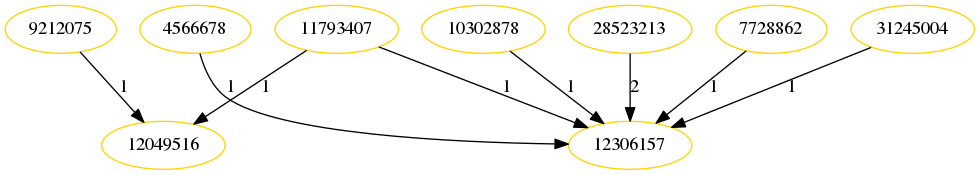

mean distance  1.8648742472333355
Project name: subtitleedit, project owner: SubtitleEdit, ghtorrent id: 7744539


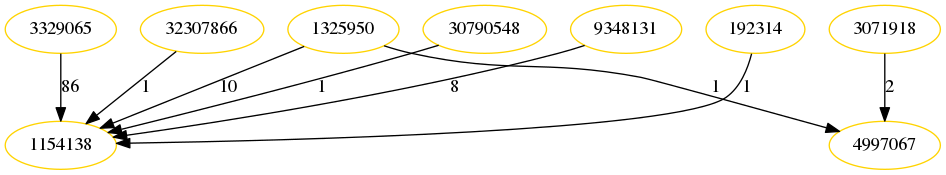

mean distance  1.8648742472333357
Project name: ohpc, project owner: openhpc, ghtorrent id: 28718415


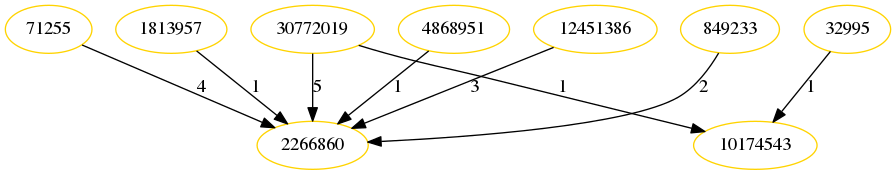

mean distance  1.8648742472333357
Project name: daia-config, project owner: gbv, ghtorrent id: 4330736


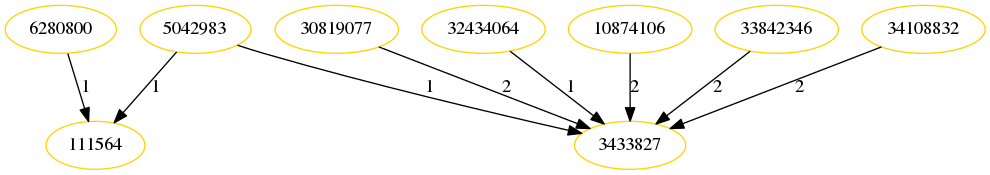

mean distance  1.8949723370271412
Project name: location-plugin, project owner: rainlab, ghtorrent id: 19833548


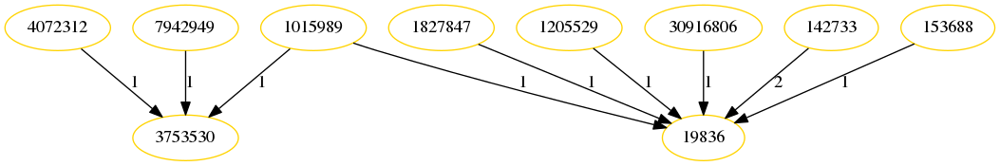

mean distance  1.8949723370271416
Project name: googleads-php-lib, project owner: googleads, ghtorrent id: 7176099


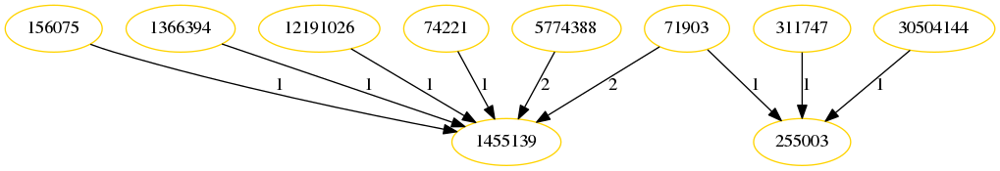

mean distance  1.9236418016739159
Project name: opensips, project owner: OpenSIPS, ghtorrent id: 3648248


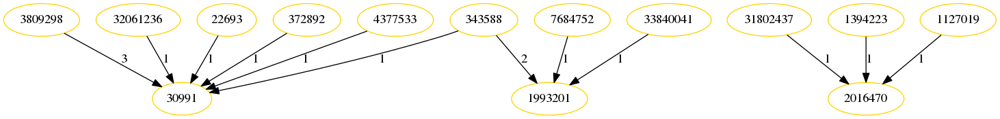

mean distance  1.9283415750836432
Project name: felayout_t3kit, project owner: t3kit, ghtorrent id: 27404682


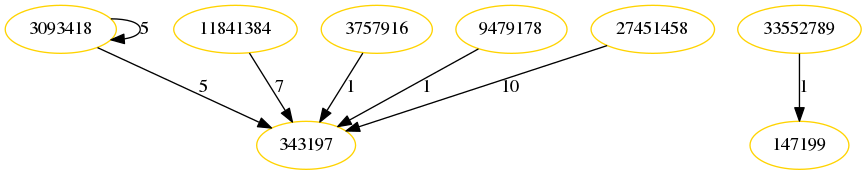

mean distance  1.929179292490679
Project name: pet-store, project owner: codefellows-portland-javascript-401d4, ghtorrent id: 53230622


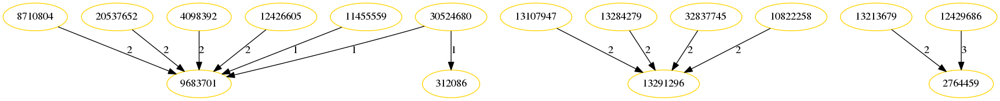

mean distance  1.9362580247166012
Project name: xrootd, project owner: xrootd, ghtorrent id: 3181271


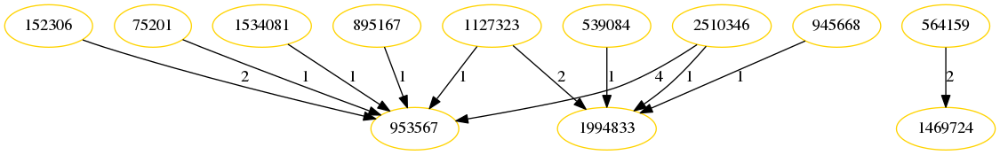

mean distance  1.937333130041322
Project name: xelm, project owner: exercism, ghtorrent id: 25125181


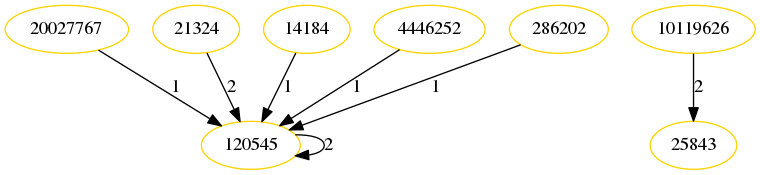

mean distance  1.937333130041322
Project name: prawn, project owner: prawnpdf, ghtorrent id: 21276


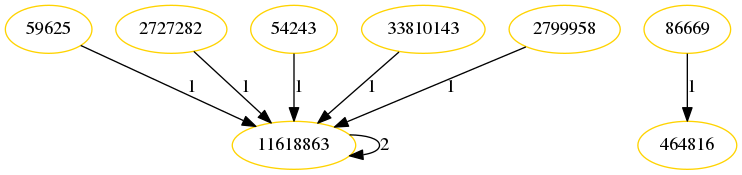

mean distance  1.937333130041322
Project name: grafter, project owner: zalando, ghtorrent id: 51996428


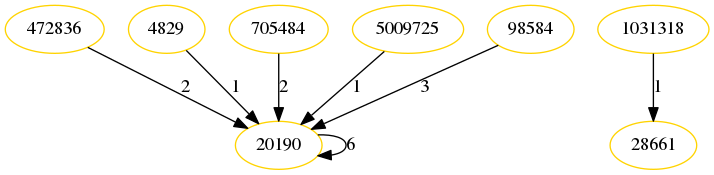

mean distance  1.937333130041322
Project name: operationcode_bot, project owner: OperationCode, ghtorrent id: 52938288


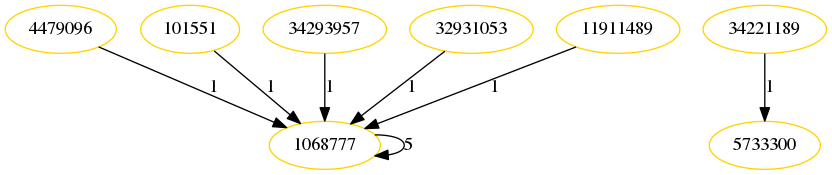

mean distance  1.937333130041322
Project name: front-end-frameworks, project owner: usablica, ghtorrent id: 1587178


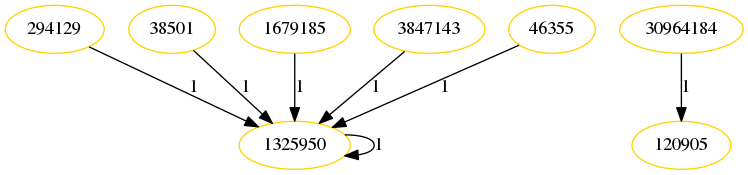

mean distance  1.937333130041322
Project name: rekall, project owner: google, ghtorrent id: 9730565


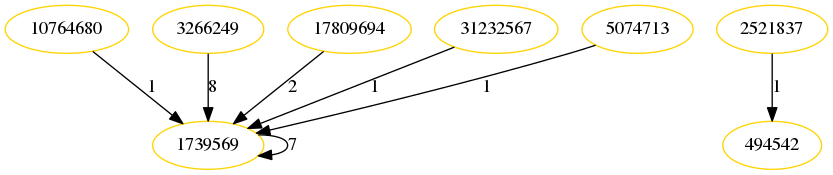

mean distance  1.937333130041322
Project name: php-amqplib, project owner: php-amqplib, ghtorrent id: 32028693


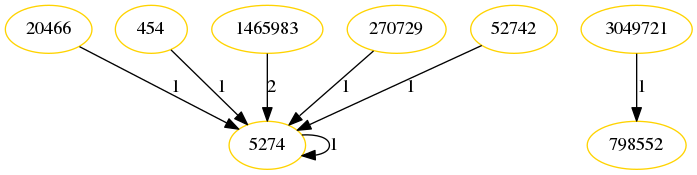

mean distance  1.937333130041322
Project name: BeeHive, project owner: alibaba, ghtorrent id: 42571977


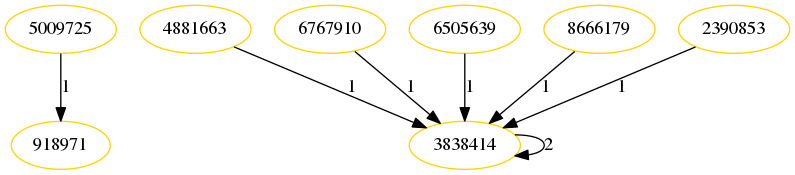

mean distance  1.937333130041322
Project name: mollie-api-ruby, project owner: mollie, ghtorrent id: 6829060


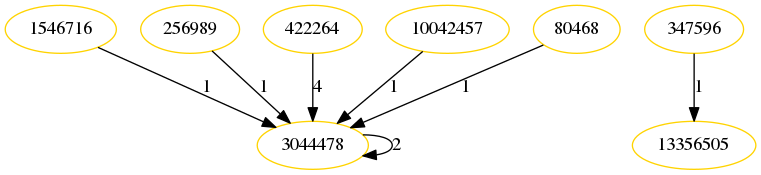

mean distance  1.937333130041322
Project name: utf8proc, project owner: JuliaLang, ghtorrent id: 17146954


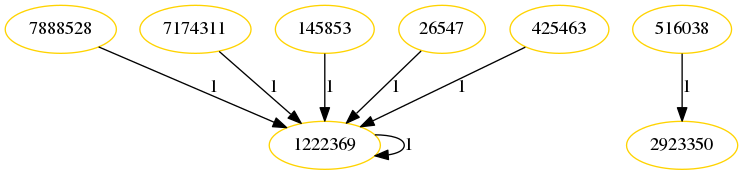

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  4.062174590251992
Project name: mtasa-blue, project owner: multitheftauto, ghtorrent id: 17534932


/home/trurl/anaconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


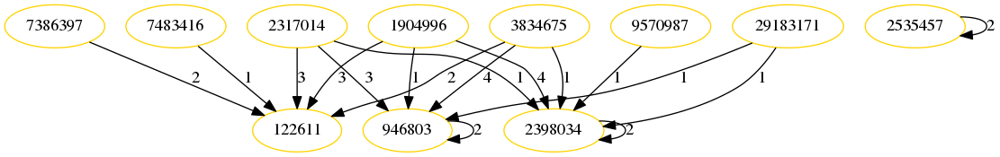

mean distance  4.132753456453317
Project name: cakephp.org, project owner: cakephp, ghtorrent id: 38272198


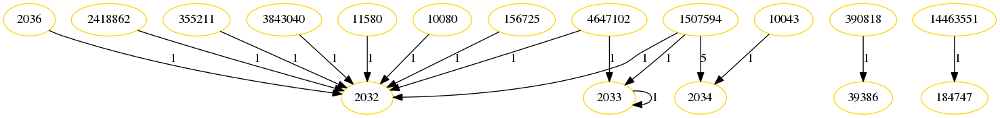

mean distance  4.171777636031277
Project name: therion, project owner: therion, ghtorrent id: 14591294


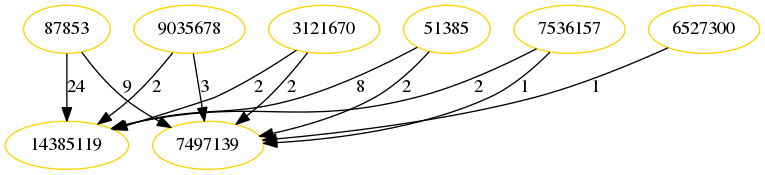

mean distance  4.274910014305129
Project name: docs-metrics, project owner: pivotal-cf, ghtorrent id: 34141652


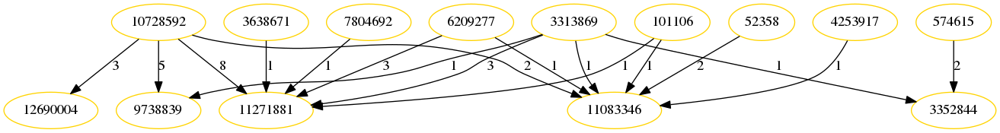

mean distance  4.341576575726517
Project name: centerforopenscience.org, project owner: CenterForOpenScience, ghtorrent id: 4554476


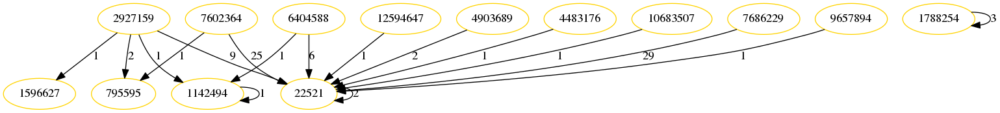

mean distance  4.378415757487975
Project name: account-financial-tools, project owner: OCA, ghtorrent id: 10483614


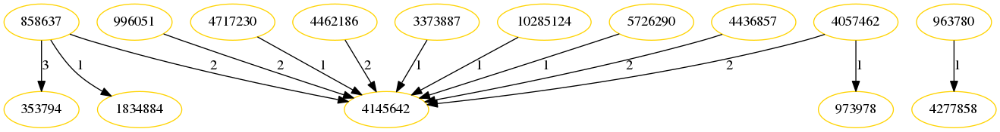

mean distance  4.525672210130661
Project name: proprietary_vendor_sony, project owner: TheMuppets, ghtorrent id: 25419


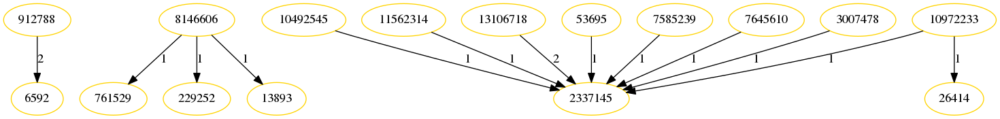

mean distance  4.590117214380467
Project name: club_management_01, project owner: framgia, ghtorrent id: 52546708


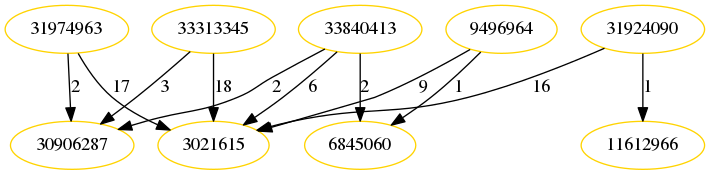

mean distance  4.641357747795884
Project name: ygopro-scripts, project owner: Fluorohydride, ghtorrent id: 26044652


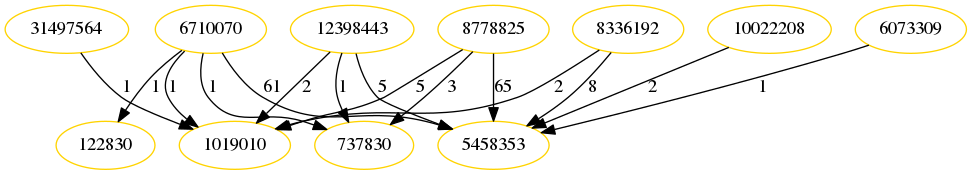

mean distance  4.983873396391732
Project name: wdi19-homework, project owner: textchimp, ghtorrent id: 52166210


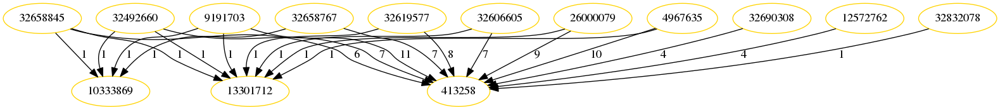

mean distance  5.095546762210383
Project name: portal-educacao, project owner: cefet-inf-2015, ghtorrent id: 46623051


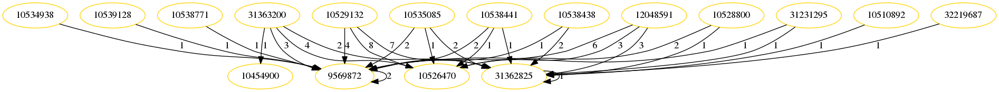

mean distance  5.132528921295299
Project name: containercafe, project owner: containercafe, ghtorrent id: 44242220


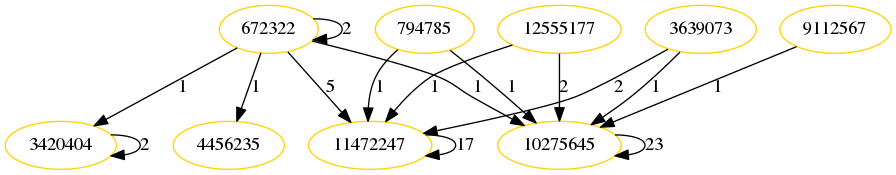

mean distance  5.151455411271657
Project name: ruby-oct-2016, project owner: CodingDojoDallas, ghtorrent id: 47480675


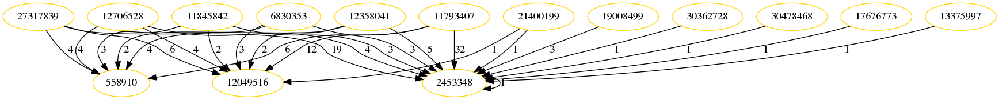

mean distance  5.2170623007834145
Project name: hyuga-cfh, project owner: andela, ghtorrent id: 48089440


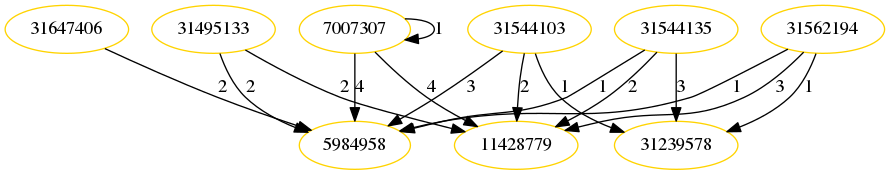

mean distance  5.252996636233996
Project name: dl-core-webapi, project owner: danliris, ghtorrent id: 42786114


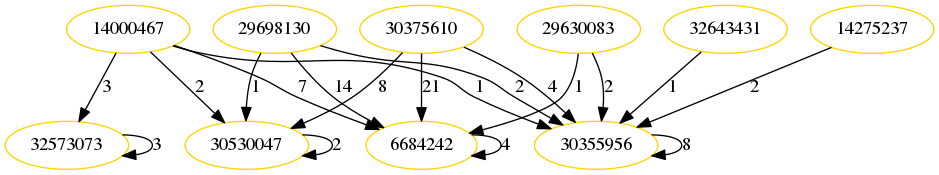

mean distance  5.334354088694227
Project name: hacklab-almeria.github.io, project owner: HackLab-Almeria, ghtorrent id: 16535577


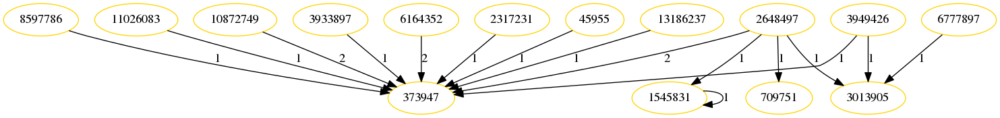

mean distance  5.3537664914782175
Project name: ensembl-webcode, project owner: Ensembl, ghtorrent id: 6977976


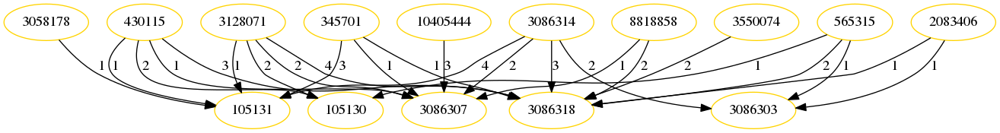

mean distance  5.706155991169533
Project name: dl-ui, project owner: danliris, ghtorrent id: 42787101


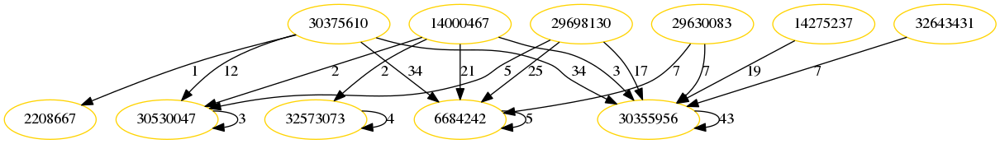

mean distance  5.727165702740672
Project name: oe-alliance-plugins, project owner: oe-alliance, ghtorrent id: 123568


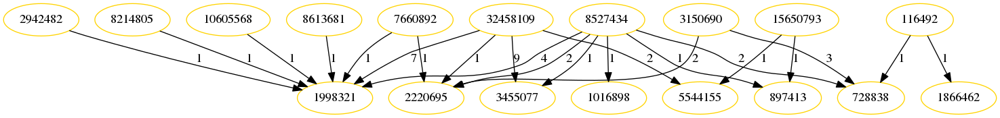

mean distance  6.552627246433159
Project name: enigma2, project owner: openatv, ghtorrent id: 3410497


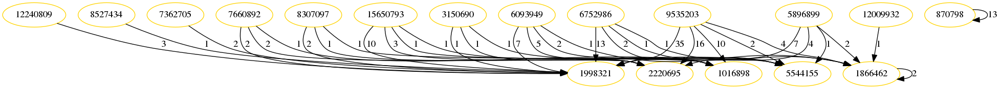

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [108]:
draw_most_representatives(cluster1s2s, feature_vecs_8to20, 20, 0, 0, colors[2])

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  3.904719486227779
Project name: Platform-CI, project owner: RHQE, ghtorrent id: 33806433


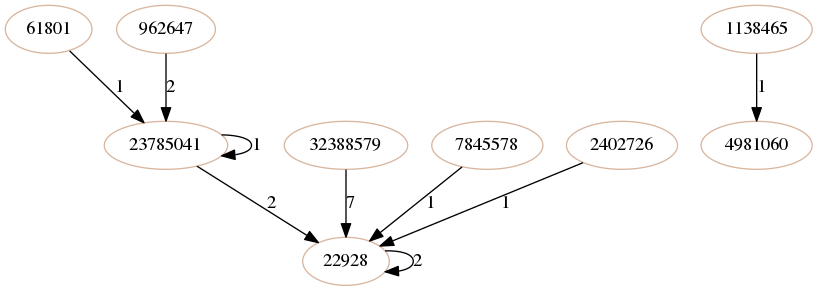

mean distance  3.943089920036883
Project name: linux-sgx, project owner: 01org, ghtorrent id: 39882805


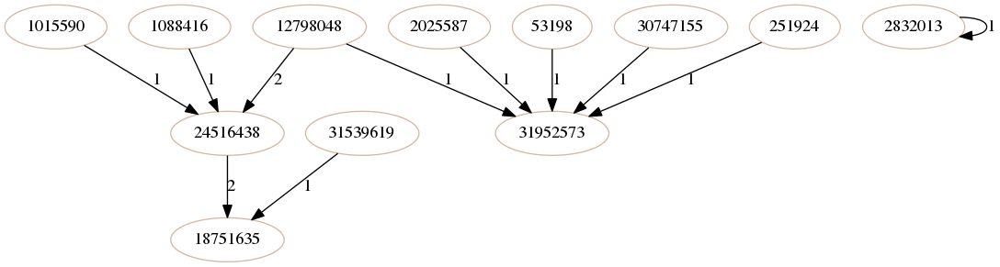

mean distance  3.991197940275474
Project name: Magneticraft, project owner: Magneticraft-Team, ghtorrent id: 30965635


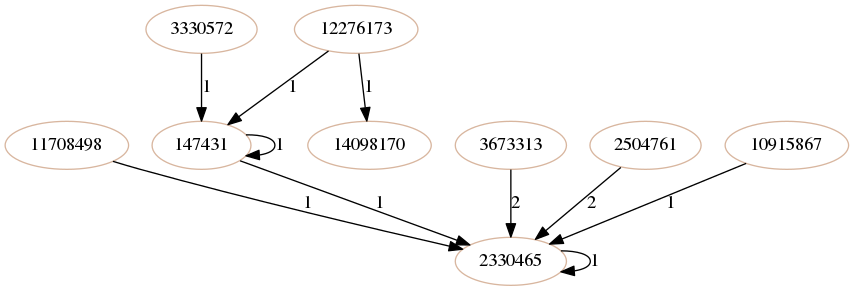

mean distance  4.017047782701026
Project name: fedy, project owner: folkswithhats, ghtorrent id: 22281442


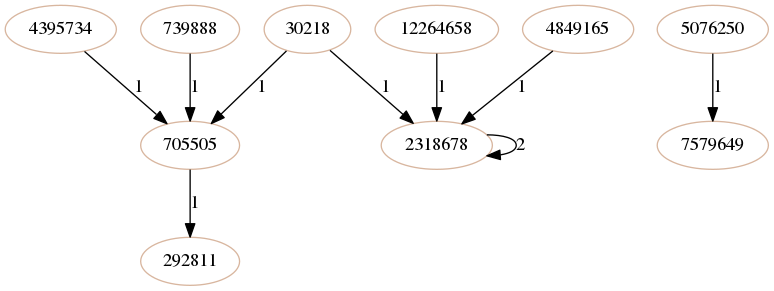

mean distance  4.02844230770241
Project name: kafka-connect-hdfs, project owner: confluentinc, ghtorrent id: 28852302


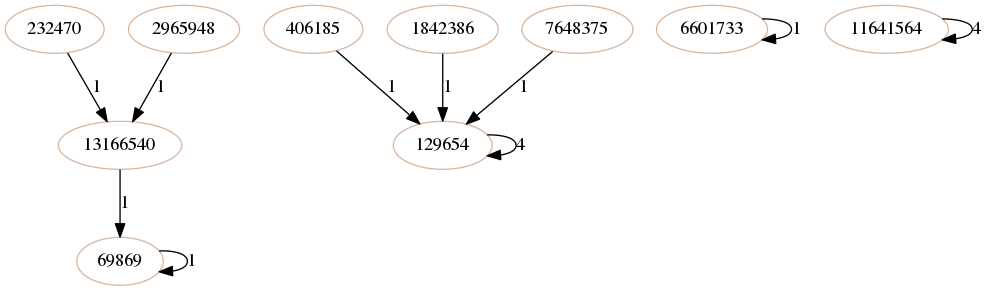

mean distance  4.053597358321689
Project name: EndToEnd, project owner: Particular, ghtorrent id: 32860956


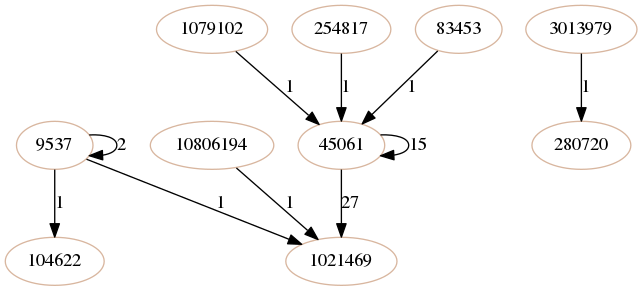

mean distance  4.062876175602094
Project name: redmine_tags, project owner: ixti, ghtorrent id: 16050


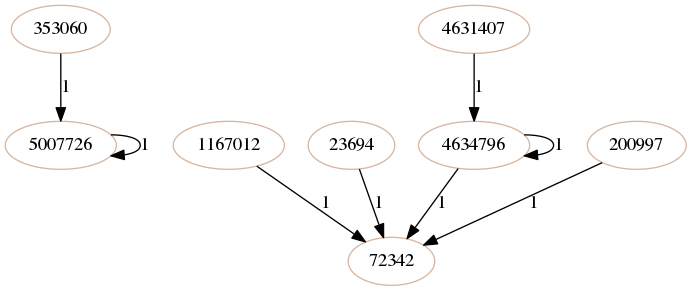

mean distance  4.07465356524941
Project name: CTK, project owner: commontk, ghtorrent id: 24030


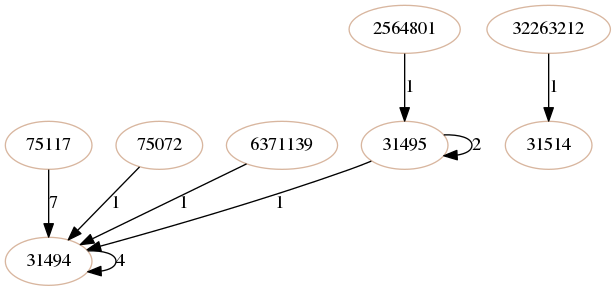

mean distance  4.079095143481815
Project name: on-tftp, project owner: RackHD, ghtorrent id: 28283184


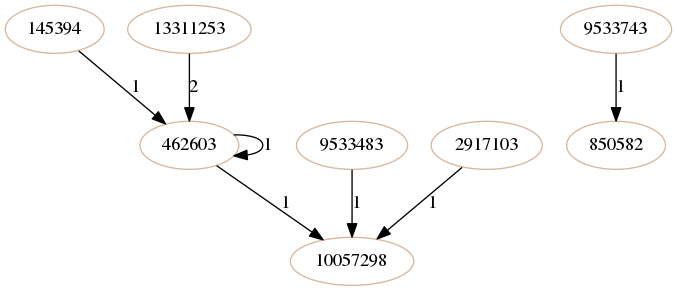

mean distance  4.091118044942714
Project name: la-guia, project owner: platanus, ghtorrent id: 17362143


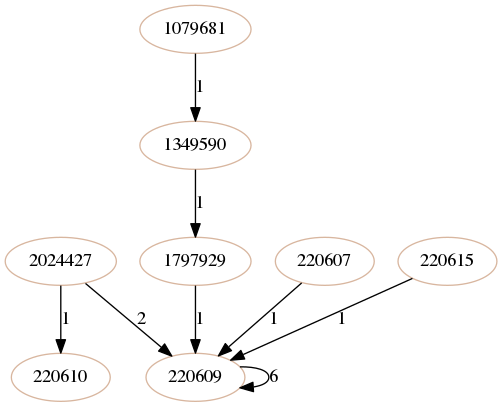

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  7.840203304664707
Project name: universal, project owner: angular, ghtorrent id: 21593710


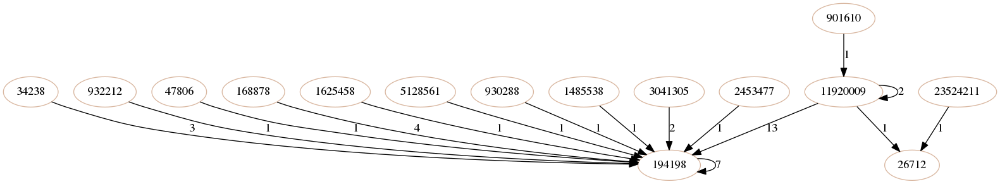

mean distance  8.033813151786372
Project name: devportal, project owner: cloud-elements, ghtorrent id: 35680162


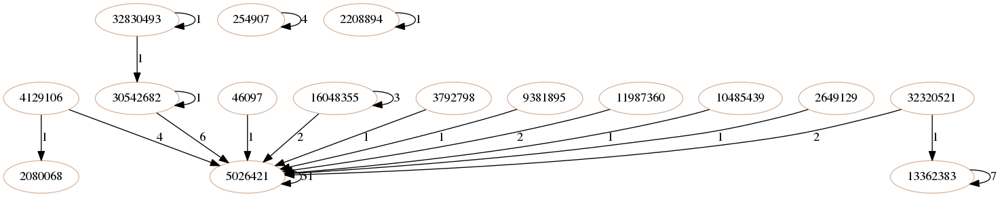

mean distance  8.075788711663748
Project name: gds-sso, project owner: alphagov, ghtorrent id: 333984


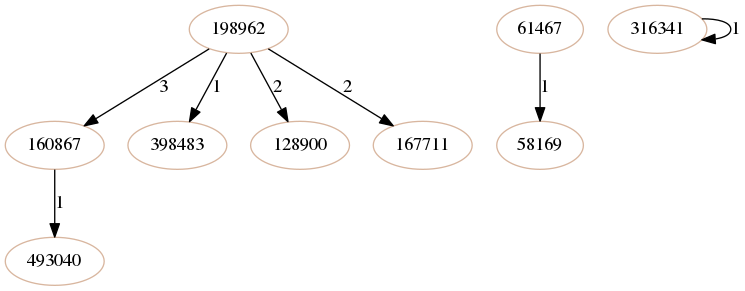

mean distance  8.10744620922295
Project name: find-and-replace, project owner: Atom, ghtorrent id: 8233337


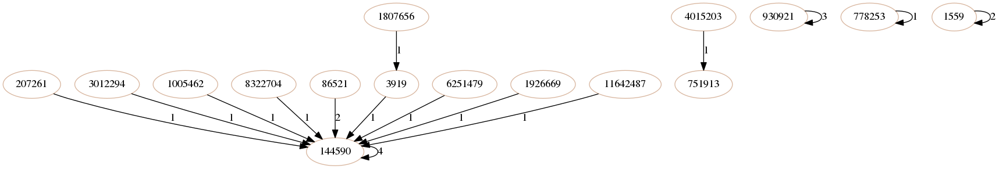

mean distance  8.250201639735877
Project name: xap-docs, project owner: Gigaspaces, ghtorrent id: 27318998


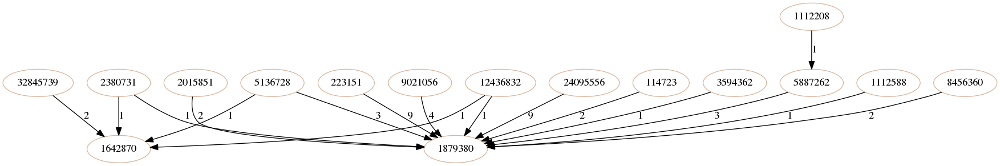

mean distance  8.431729087599956
Project name: concourse-tutorial, project owner: StarkAndWayne, ghtorrent id: 19756096


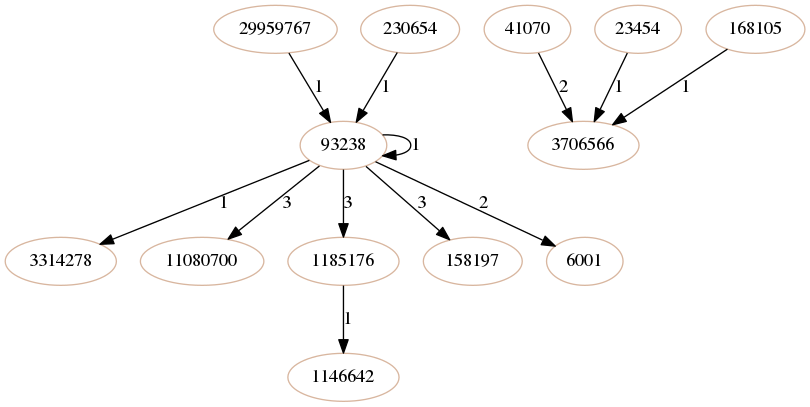

mean distance  8.483418356983197
Project name: ircv3.github.io, project owner: ircv3, ghtorrent id: 19273658


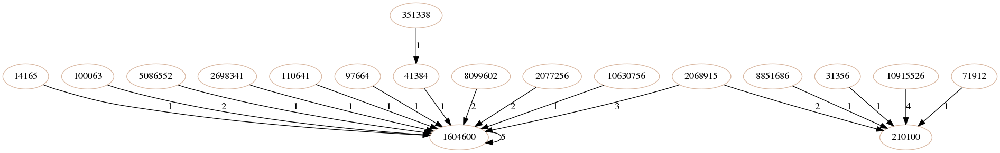

mean distance  8.793949263165633
Project name: maslow, project owner: alphagov, ghtorrent id: 5640587


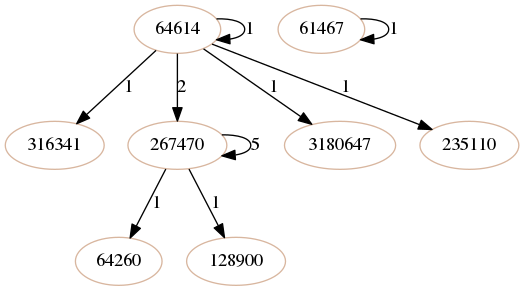

mean distance  8.951848074898445
Project name: github-tutorial, project owner: SeNSE-lab, ghtorrent id: 56402493


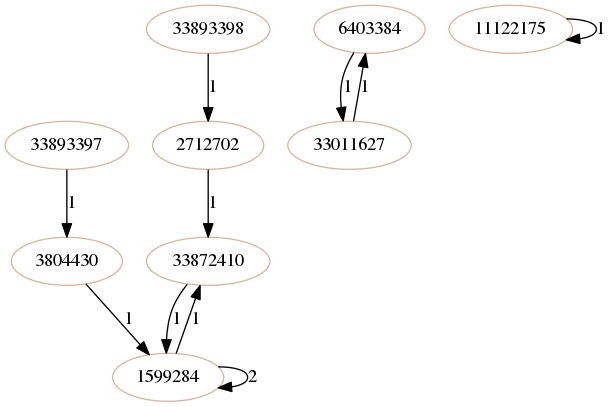

mean distance  9.417754432044353
Project name: devs-september, project owner: githubteacher, ghtorrent id: 45268976


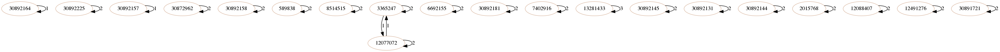

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [91]:
draw_most_representatives(cluster1s0s, feature_vecs_8to20, 10, 0, 0, colors[3])

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  3.378968632094434
Project name: hazelcast-code-samples, project owner: hazelcast, ghtorrent id: 10304631


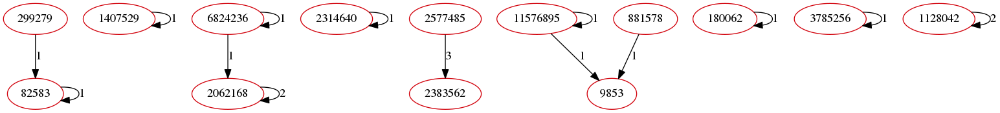

mean distance  3.3882784531366457
Project name: strong-error-handler, project owner: strongloop, ghtorrent id: 36892254


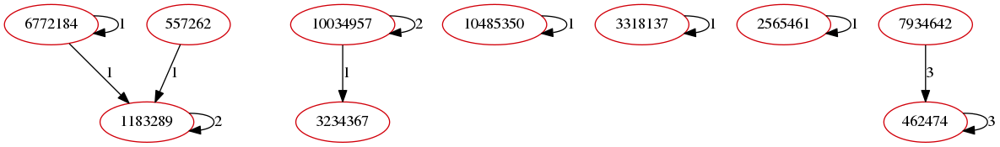

mean distance  3.3902199542135296
Project name: sentry-plugins, project owner: getsentry, ghtorrent id: 42885683


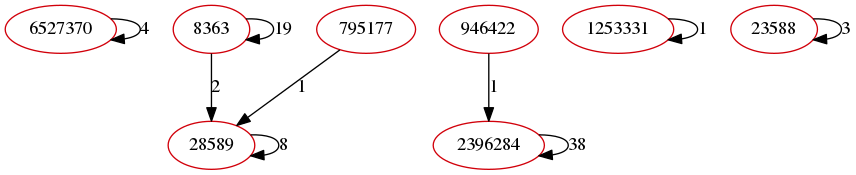

mean distance  3.3999069552084236
Project name: website, project owner: appuio, ghtorrent id: 32307337


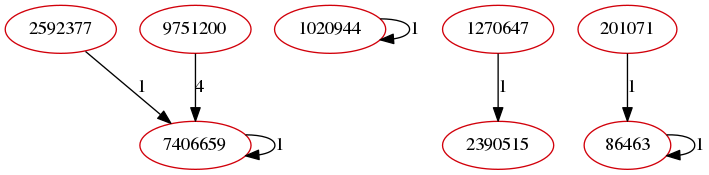

mean distance  3.3999069552084236
Project name: ember-frost-popover, project owner: ciena-frost, ghtorrent id: 34835314


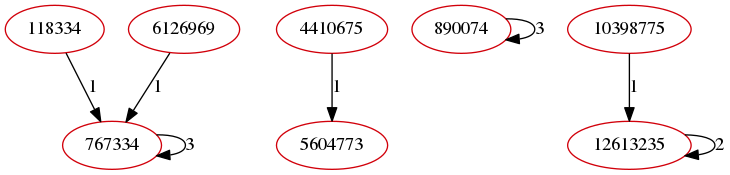

mean distance  3.3999069552084236
Project name: feathers-memory, project owner: feathersjs, ghtorrent id: 9140824


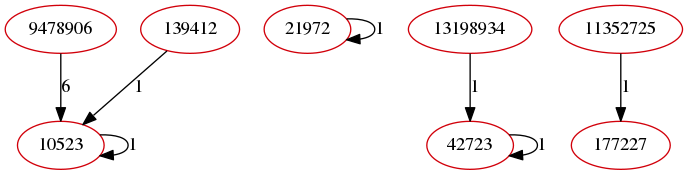

mean distance  3.400680414361871
Project name: docker-containers, project owner: mesosphere, ghtorrent id: 11383488


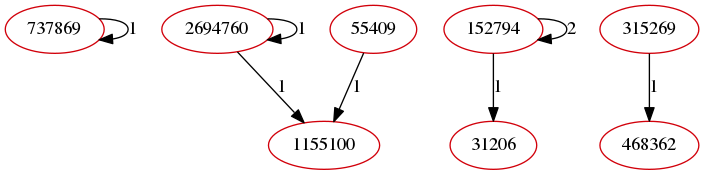

mean distance  3.4011486391690595
Project name: chef-provisioning, project owner: chef, ghtorrent id: 15435832


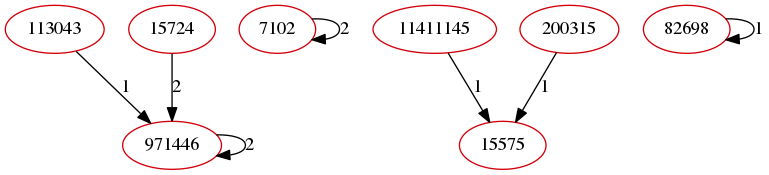

mean distance  3.4073726871572063
Project name: cloudify-agent, project owner: cloudify-cosmo, ghtorrent id: 19094257


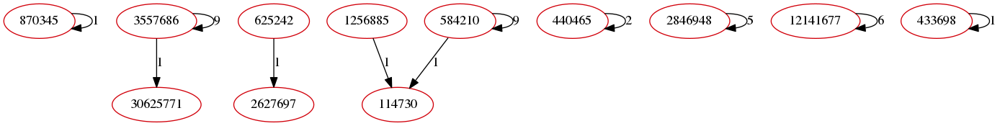

mean distance  3.413263402860395
Project name: api-enumerations, project owner: companieshouse, ghtorrent id: 22218377


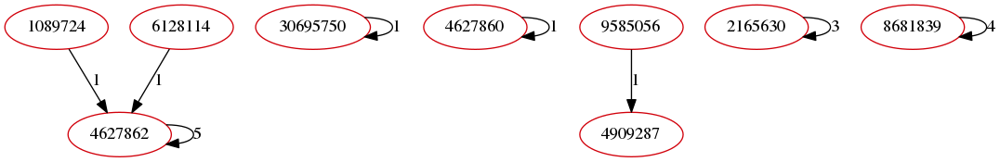

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  7.440127671222554
Project name: essentials-nov, project owner: githubteacher, ghtorrent id: 49817301


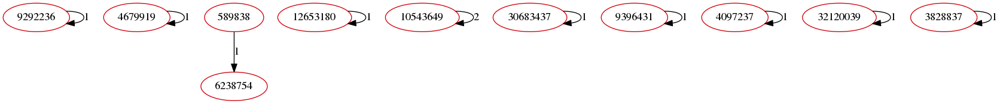

mean distance  7.440127671222556
Project name: che-dependencies, project owner: eclipse, ghtorrent id: 31932275


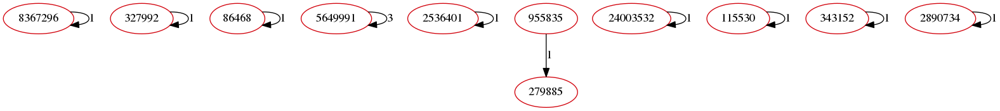

mean distance  8.020704444024823
Project name: developers-jan-12, project owner: githubteacher, ghtorrent id: 54664375


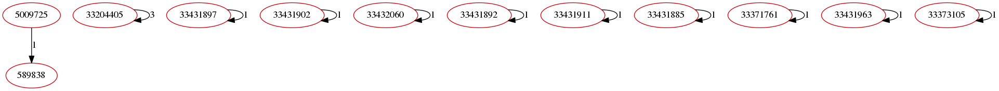

mean distance  8.898992105511782
Project name: next-product-selector, project owner: Financial-Times, ghtorrent id: 21391687


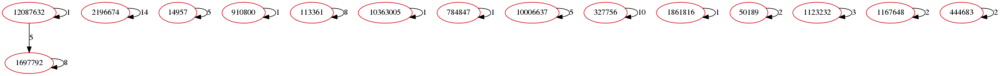

mean distance  9.06294703690524
Project name: boston-bar-review, project owner: aimeebachari, ghtorrent id: 55064603


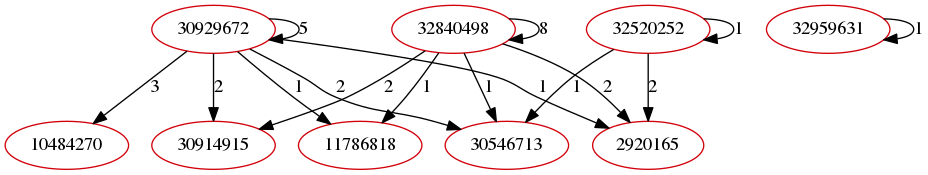

mean distance  9.838376618859131
Project name: Common, project owner: aspnet, ghtorrent id: 16439239


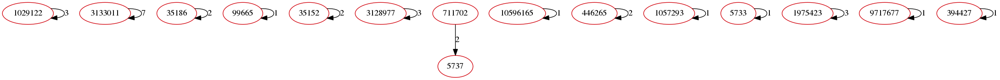

mean distance  10.644393675694182
Project name: dev-dec-19, project owner: githubteacher, ghtorrent id: 53019708


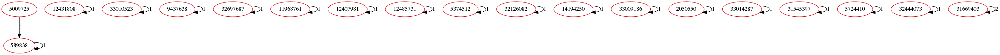

mean distance  11.72829382030237
Project name: oct-04-dev, project owner: githubteacher, ghtorrent id: 47472936


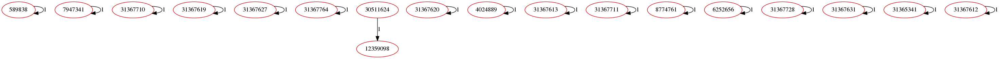

mean distance  11.8959938045437
Project name: docs-rabbitmq-staging, project owner: pivotal-cf, ghtorrent id: 6435067


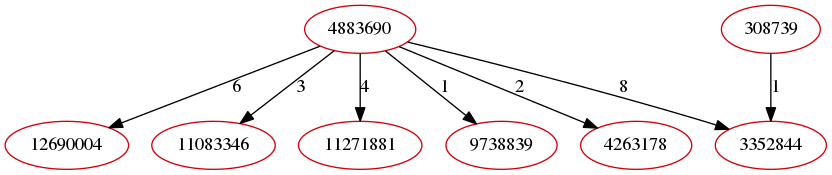

mean distance  13.879281110633412
Project name: fh-openshift-templates, project owner: feedhenry, ghtorrent id: 51412435


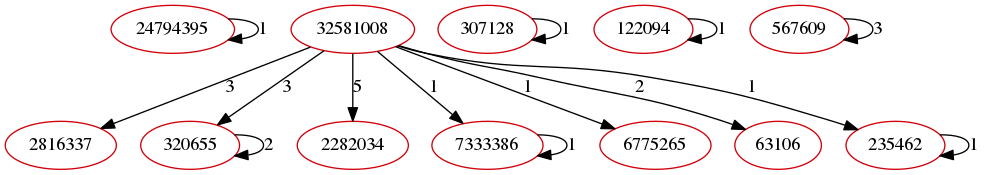

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [109]:
draw_most_representatives(cluster1s1s, feature_vecs_8to20, 10, 0, 0, colors[4])

In [47]:
final_partition={}
for node in cluster0s:
    final_partition[node]=0

for node in cluster2s:
    final_partition[node]=1

for node in cluster1s2s:
    final_partition[node]=2
    
for node in cluster1s0s:
    final_partition[node]=3

for node in cluster1s1s:
    final_partition[node]=4




In [96]:
pickle.dump(final_partition, open("data/final_partition", "wb"))

In [79]:
final_partition = pickle.load(open("data/final_partition", "rb"))

# Metrics for final partition:

Finally, we calculate  Dunn's index and the Connectedness for the final partition to make sure that the subclustering on cluster 3 (cluster1s) has improved and not worsened the partition. 

# Dunn's index

In [49]:
nodes = list(final_partition.keys())
vecs=[feature_vecs_8to20[n] for n in nodes]
labels = [final_partition[n] for n in nodes]
di_final = dunn_centroids(labels, vecs)

print("final dunns index", di_final)

final dunns index 0.2456077886335779


We see, that the Dunn's index has not changed through the subclustering. This is due to the fact, that it is bounded by the diameter of cluster 2, which is the greatest of all clusters. Cluster 2 has all the complex projects in it that show transitivity and reciprocity. This is great because this provides a clear intuitive group type. At the same time there is still a lot of variety across features which results in a high diameter.

# connectedness

In [50]:
dists=distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)
dists = distance.squareform(dists)

In [51]:
sorted_dists = [np.argsort(dists[i]) for i in range(len(nodes))]
sorted_dists = [sorted_dists[i][sorted_dists[i]!=i] for i in range(len(nodes))] #remove distance to itself


In [52]:
index_dict = {node:i for i,node in enumerate(nodes)} 

In [53]:
def connectedness(partition, l=5):
    conn = 0
    for node in partition:
        node_cl = partition[node]
        ind = index_dict[node]
        neighbors_idxs = sorted_dists[index_dict[node]][:l]
        for j,neighbor_idx in enumerate(neighbors_idxs):
            neighbor = nodes[neighbor_idx]
            if partition[neighbor]!=node_cl:
                conn+= 1/(j+1)
    return conn/len(partition)

In [54]:

c = connectedness(final_partition)
print("final connectedness", c)


final connectedness 0.014139081344624084


 # Principal component analysis of clusters
 This is a sanity check and serves to visualize the clusters in 2D. Projects of a cluster should be in the same area which they clearly are. Although this is just in 2 dimensions, we see that cluster 2, which consists of the complex projects seems to be the most widely spread, which is why Dunn's index is bounded by it.

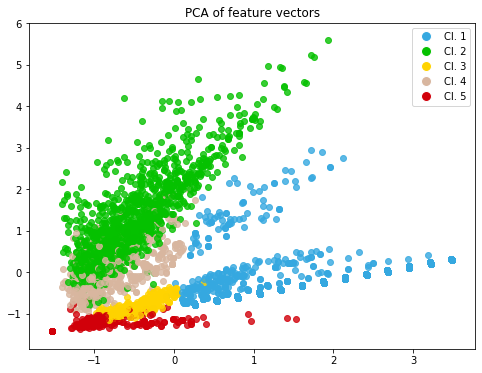

In [55]:
from sklearn.decomposition import PCA
from matplotlib.lines import Line2D

clusters = defaultdict(list)

for k,v in final_partition.items():
    clusters[v].append(k)
keys=[]
fvecs=[]
items= list(feature_vecs_8to20.items()) # List of tuples
random.shuffle(items)
for key,fvec in items:
    keys.append(key)
    fvecs.append(fvec)

pca = PCA(n_components=2, whiten=True)
X_r = pca.fit(fvecs).transform(fvecs)


legend_elements = [Line2D([0], [0], marker='o', color='w', label='Cl. ' + str(i+1), markerfacecolor=colors[i], markersize=10) for i in range(5)]

plt.figure(figsize = (8,6) )
plt.title("PCA of feature vectors")
for i,x in enumerate(X_r):
    if keys[i] in final_partition.keys():
        plt.scatter(x[0], x[1], color=colors[final_partition[keys[i]]], alpha=.8)
plt.legend(loc='best', shadow=False, handles = legend_elements)
plt.show()


# Sizes of final clusters

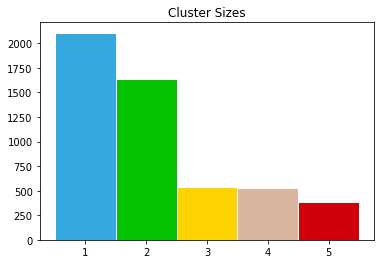

In [15]:
fig, ax = plt.subplots()
N, bins, patches = ax.hist([x+1 for x in list(final_partition.values())],bins=[x-0.5 for x in range(1, len(set(final_partition.values()))+2)],  edgecolor='white', linewidth=1)
for i in range(0,5):
    patches[i].set_facecolor(colors[i])
plt.title("Cluster Sizes")
plt.show()

# Feature distributions

In [57]:
from matplotlib import rc
import math
plt.rc('text', usetex=True)
plt.rc('font', family='serif')
mp.rcParams['xtick.labelsize'] = 15
mp.rcParams['ytick.labelsize'] = 15
rc('text', usetex=True)

# calculate distributions of feature vectors for partition
def get_feature_dist(partition, cluster_n, feature_n):
    id_list=[key for key in partition if partition[key]==cluster_n]
    feature_dist=[]
    for id_ in id_list:
        feature_dist.append(feature_vecs_8to20[id_][feature_n])
    return feature_dist

In [58]:
#Labels for netsimile feature vectors - and define plotranges 
feature_labels=[r"$d_{i}^+$", r"$d_{i}^-$",  r"$c_i$", r"$\overline{d^-_{N(i)^+}}$", r"$\overline{d^+_{N(i)^+}}$", r"$\overline{d^-_{N(i)^-}}$",r"$\overline{d^+_{N(i)^-}}$", r"$\overline{c_{N(i)^-}}$", r"$\overline{c_{N(i)^+}}$",r"$|E_{ego(i)^-}|$", r"$|E_{ego(i)^+}|$", r"$r_i$"]
plot_ranges=[(0,100), (0,0.5),(0,100),(0,0.4),(0,100), (0,50),(0,100),(0,100), (0,0.5),(0,100),(0,0.4),(0,120), (0,50),(0,100),(0,60), (0,0.3), (0,50), (0,0.2), (0,50), (0,30), (0,50), (-3,6),(0,6), (-5,5), (0,6), (-5,5),(-5,5), (-5,5), (0,20), (0,10), (0,20), (0,20), (0,30), (-5,20), (-5,20)]
feature_labels_netsimile=[label + statlabel for statlabel in [" mean", " median", " std", " skew", " kurtosis"] for label in feature_labels]


In [59]:
feature_selection1=list(range(12))
feature_selection2=list(range(24,36))
n_feat=60
n_partitions = max(final_partition.values())+1
xmin=np.zeros(n_feat)
xmax=np.zeros(n_feat)
nbins=20
distributions={}

for i in range(1, n_partitions+1):
    for j in range(n_feat):
        dist=get_feature_dist(final_partition,i-1,j)
        xmin[j]=min(xmin[j],min(dist))
        xmax[j]=max(xmax[j],max(dist))
        distributions[str(i)+str(j)]=dist

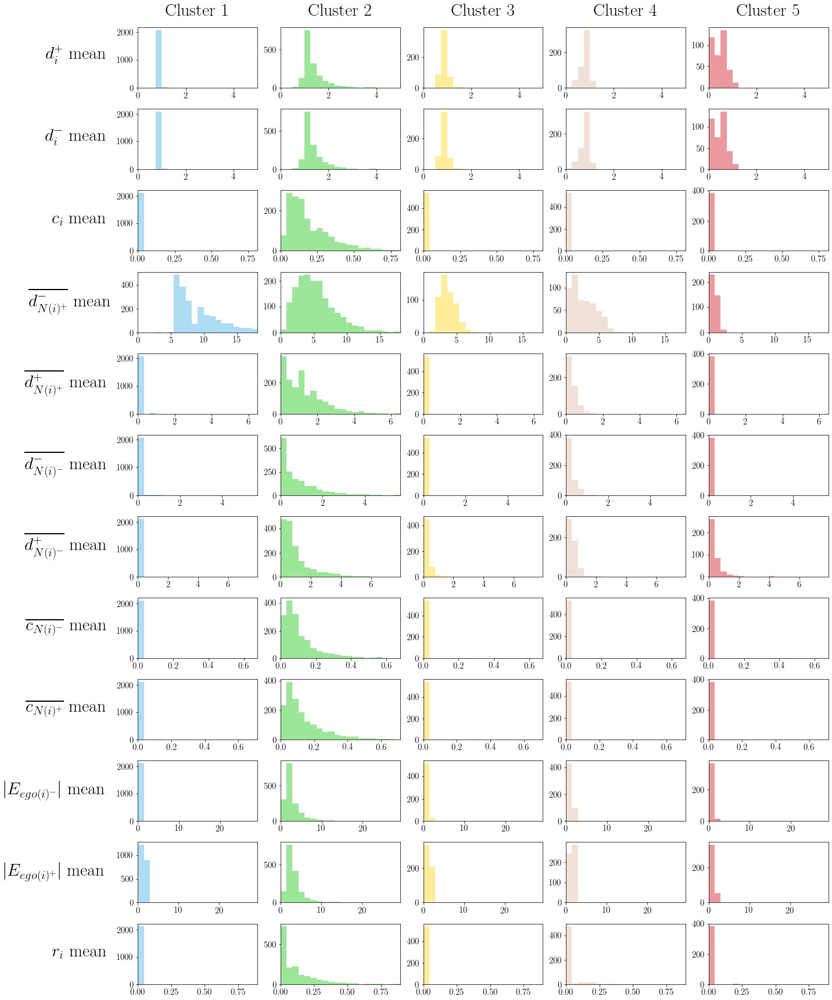

In [60]:
pad=10
fig = plt.figure(figsize=(n_partitions*4, len(feature_selection1)*2))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1, n_partitions+1):
    for no,j in enumerate(feature_selection1):
        ax = fig.add_subplot(len(feature_selection1), n_partitions, no*n_partitions + i)
        #ax.text(n_feat, n_partitions, j*n_partitions + i, fontsize=30)
        sns.distplot(distributions[str(i)+str(j)], bins=[x*(xmax[j] - xmin[j])/nbins for x in range(nbins+1)], hist=True, color=colors[i-1], kde=False)
        if i==1:
            ax.annotate(feature_labels_netsimile[j], xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                 fontsize=30, ha='right', va='center')
        if no==0:
            ax.set_title("Cluster " + str(i),pad=20, fontsize=30)
            #ax.set_ylabel(feature_labels_netsimile[j], fontsize=30, rotation=0)
        
        plt.xlim(xmin[j], xmax[j])
plt.tight_layout()

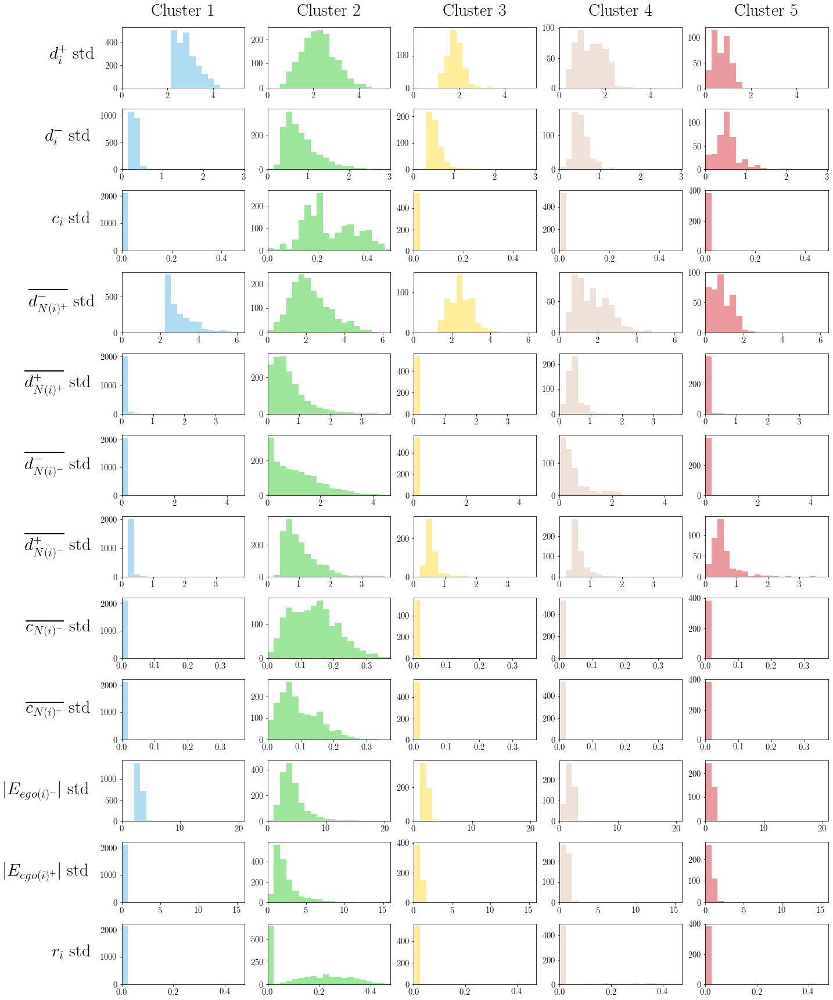

In [61]:
fig = plt.figure(figsize=(n_partitions*4, len(feature_selection2)*2))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1, n_partitions+1):
    for no,j in enumerate(feature_selection2):
        ax = fig.add_subplot(len(feature_selection2), n_partitions, no*n_partitions + i)
        #ax.text(n_feat, n_partitions, j*n_partitions + i, fontsize=30)
        sns.distplot(distributions[str(i)+str(j)], bins=[x*(xmax[j] - xmin[j])/nbins for x in range(nbins+1)], hist=True, color=colors[i-1], kde=False)
        if i==1:
            ax.annotate(feature_labels_netsimile[j], xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                 fontsize=30, ha='right', va='center')
        if no==0:
            ax.set_title("Cluster " + str(i),pad=20, fontsize=30)
        plt.xlim(xmin[j], xmax[j])
plt.tight_layout()

# Clustering on the complete graph
As a sanity check, we cluster on an untresholded graph to see wether we get a similar result.

In [56]:
np.random.seed(seed=123)

nodes= feature_vecs_8to20.keys()
Y=distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)

Y_min = np.min(Y)
Y_max = np.max(Y)
print(Y_min, Y_max)

tuples=combinations(nodes,2)
G=nx.Graph()
G.add_weighted_edges_from([(*indeces, 1 - (dist - Y_min)/(Y_max - Y_min)) for indeces, dist in zip(tuples,Y) ])

G_nodes=G.nodes
for node in nodes:
    if node not in G_nodes:
        G.add_node(node)
#compute the best partition

partition_complete_graph = community.best_partition(G, resolution=1.0)
modularity_complete_graph=community.modularity(partition, G, weight='weight')



   

0.0 59.802066817089106


In [57]:
p=partition_complete_graph
cluster0=[x for x in p if p[x]==0]
cluster1=[x for x in p if p[x]==1]
cluster2=[x for x in p if p[x]==2]
cluster3=[x for x in p if p[x]==3]

print("cluster 0: ", len(cluster0))
print("cluster 1: ", len(cluster1))
print("cluster 2: ", len(cluster2))
print("cluster 3: ", len(cluster3))


cluster 0:  2255
cluster 1:  1392
cluster 2:  1883
cluster 3:  0


Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  2.7171971099133385
Project name: ArchiBot, project owner: JustArchi, ghtorrent id: 18167347


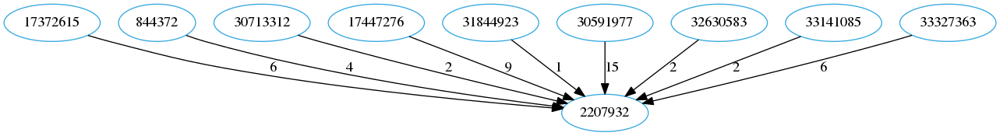

mean distance  2.7171971099133385
Project name: puppet-rsyslog, project owner: saz, ghtorrent id: 70825


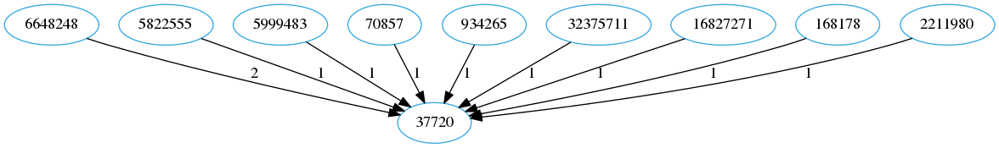

mean distance  2.7171971099133385
Project name: optim, project owner: torch, ghtorrent id: 4631399


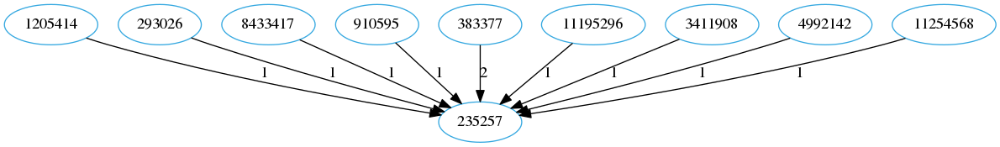

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  10.87644263368112
Project name: flatpak.github.io, project owner: flatpak, ghtorrent id: 37298662


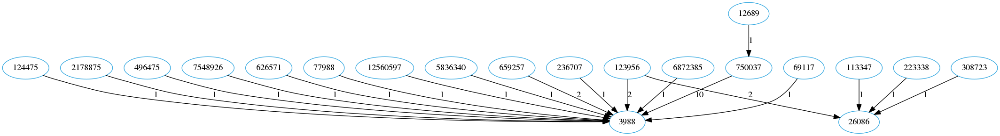

mean distance  10.90668530044819
Project name: laravel-medialibrary, project owner: Spatie, ghtorrent id: 20374325


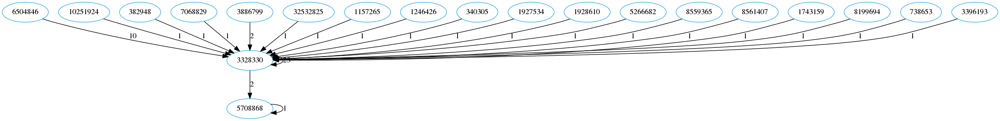

mean distance  10.993226409199778
Project name: chain, project owner: chain, ghtorrent id: 49081522


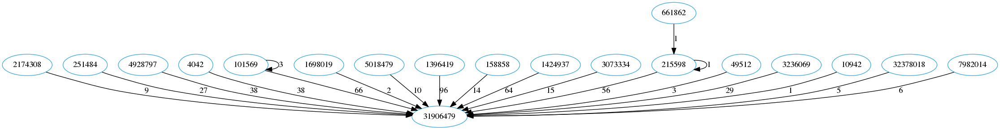

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [58]:
draw_most_representatives(cluster0, feature_vecs_8to20, 3, 0, 0, colors[0])

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  3.806313380748135
Project name: nativescript-background-http, project owner: NativeScript, ghtorrent id: 25181147


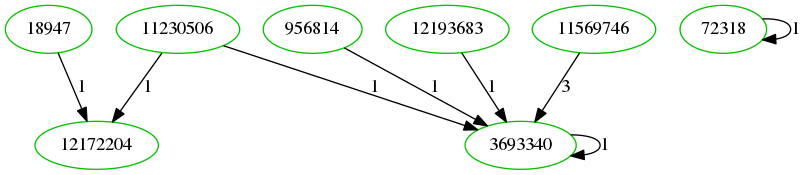

mean distance  3.8321408326219255
Project name: legion, project owner: StanfordLegion, ghtorrent id: 2939782


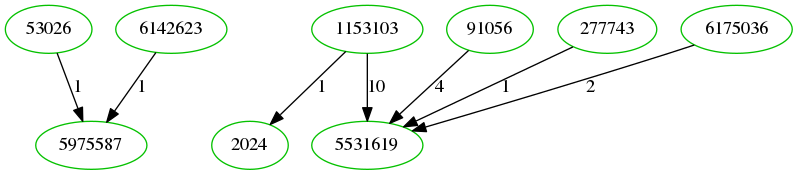

mean distance  3.836862579989924
Project name: legal-docs, project owner: mozilla, ghtorrent id: 7944641


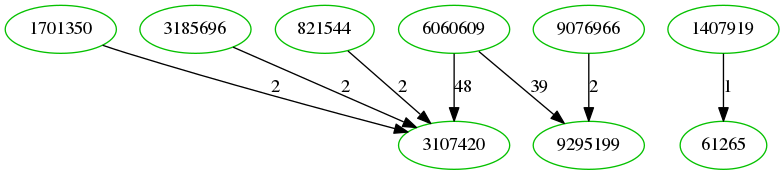

mean distance  3.836862579989924
Project name: hyperlinks, project owner: Zeit, ghtorrent id: 41430396


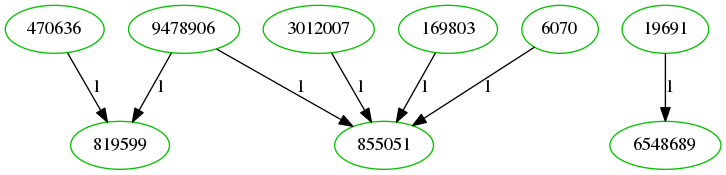

mean distance  3.837135015527667
Project name: acklenavenue.github.io, project owner: AcklenAvenue, ghtorrent id: 9703348


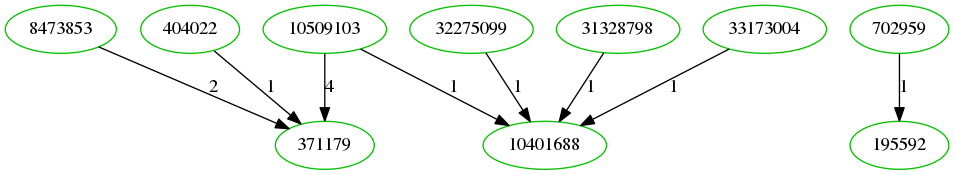

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  9.821374403615184
Project name: devs-september, project owner: githubteacher, ghtorrent id: 45268976


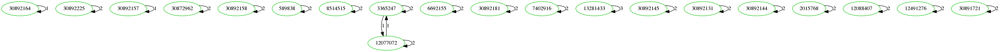

mean distance  9.943505487915338
Project name: next-product-selector, project owner: Financial-Times, ghtorrent id: 21391687


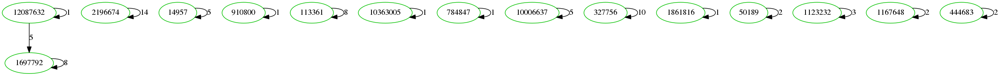

mean distance  11.04712886313044
Project name: Common, project owner: aspnet, ghtorrent id: 16439239


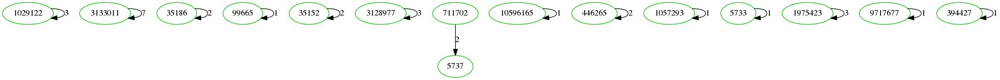

mean distance  11.799936978782565
Project name: dev-dec-19, project owner: githubteacher, ghtorrent id: 53019708


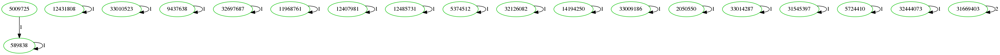

mean distance  12.819408183522912
Project name: oct-04-dev, project owner: githubteacher, ghtorrent id: 47472936


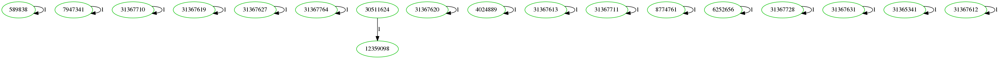

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [59]:
draw_most_representatives(cluster1, feature_vecs_8to20, 5, 0, 0, colors[1])

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  8.577839238373791
Project name: kumascript, project owner: mozilla, ghtorrent id: 52973


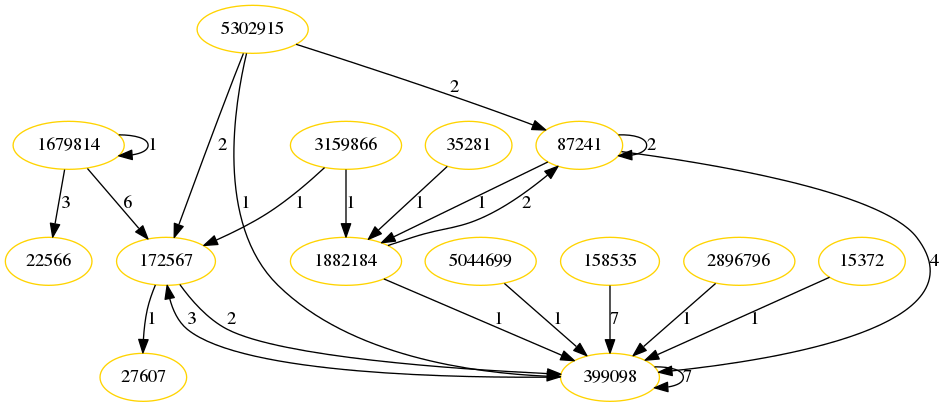

mean distance  8.578228932409534
Project name: hiyaoroshigo, project owner: matsueoss, ghtorrent id: 43818409


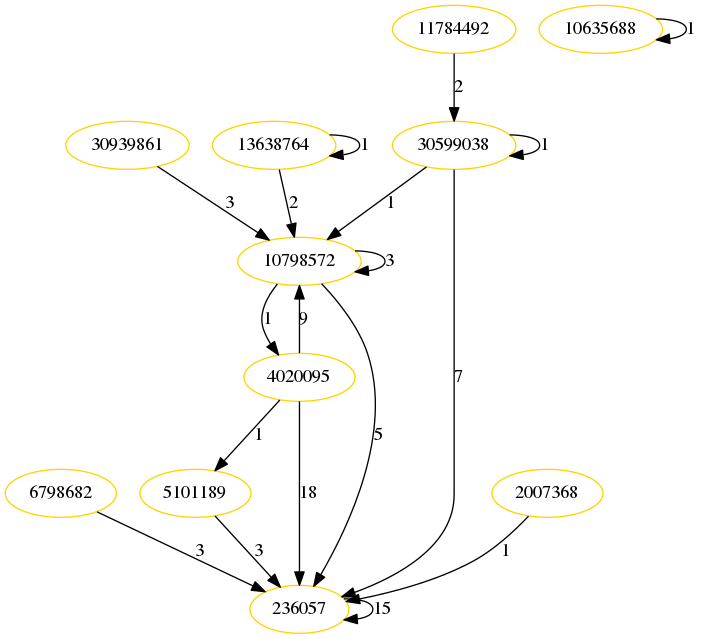

mean distance  8.61860648220868
Project name: prestashop.github.io, project owner: PrestaShop, ghtorrent id: 17251585


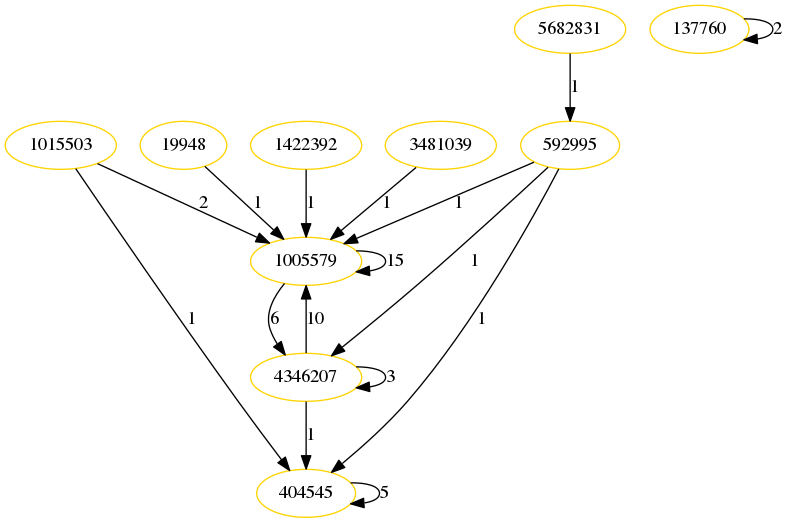

mean distance  8.717490111806837
Project name: one-to-one-sample-apps, project owner: opentok, ghtorrent id: 34338150


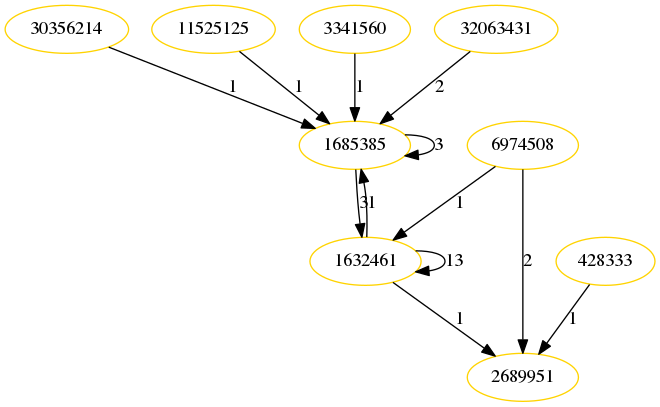

mean distance  8.72079435526908
Project name: CS-190-F2016, project owner: Purdue-CSUSB, ghtorrent id: 40844290


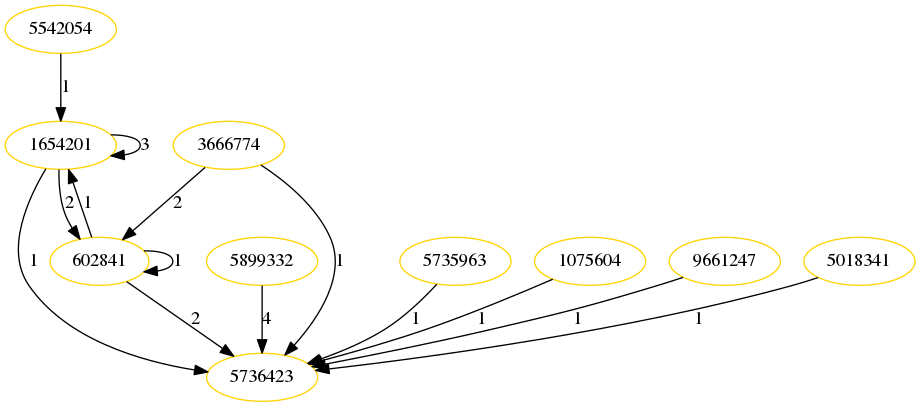

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  41.77713907557349
Project name: investment-tax-relief-submission-frontend, project owner: hmrc, ghtorrent id: 38819714


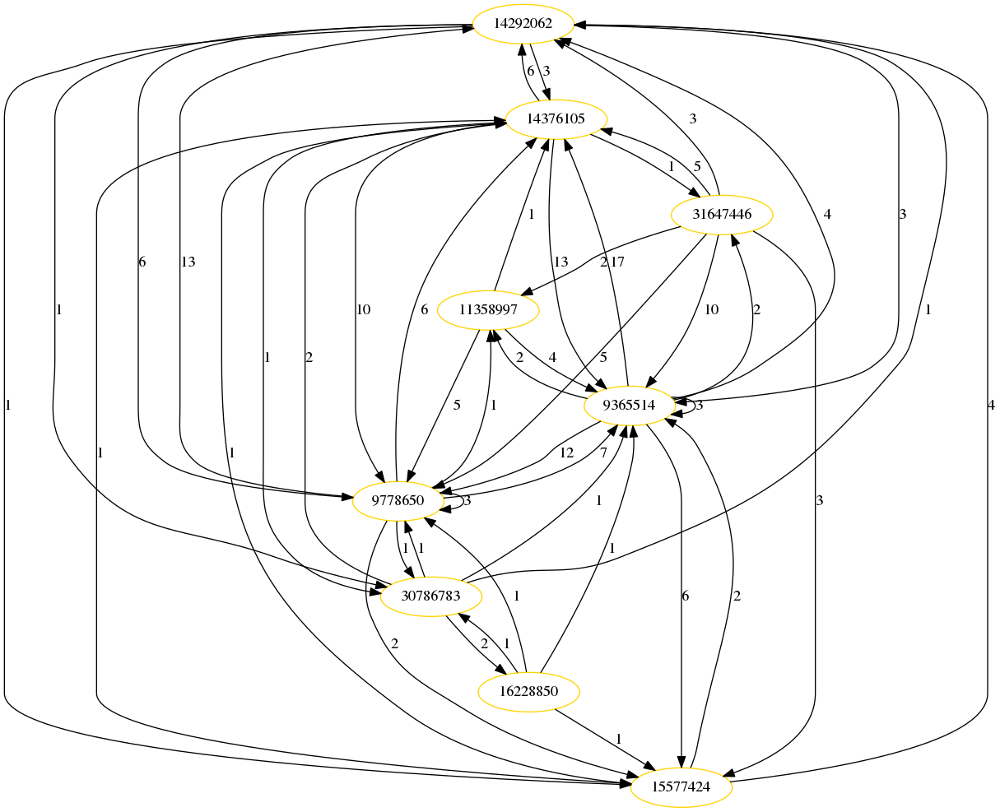

mean distance  43.90182665444047
Project name: kuzzle, project owner: kuzzleio, ghtorrent id: 23725660


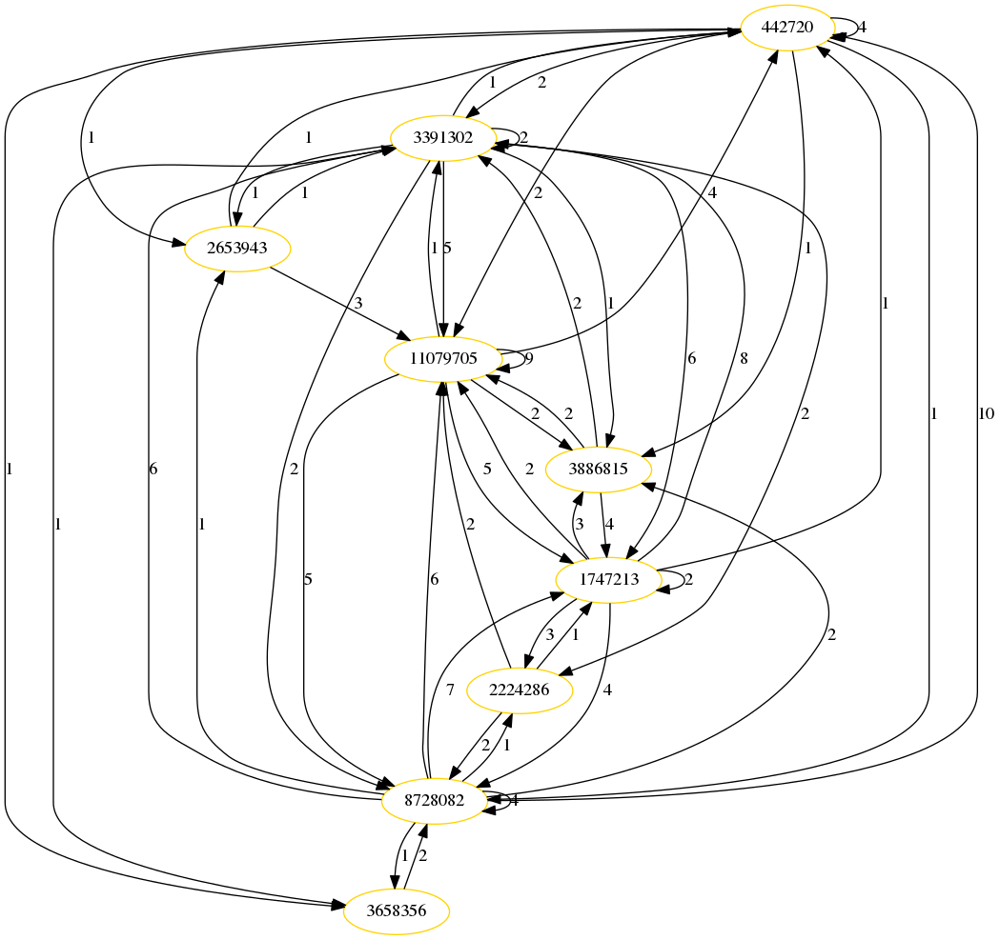

mean distance  43.93877859167244
Project name: calcentral, project owner: ets-berkeley-edu, ghtorrent id: 424371


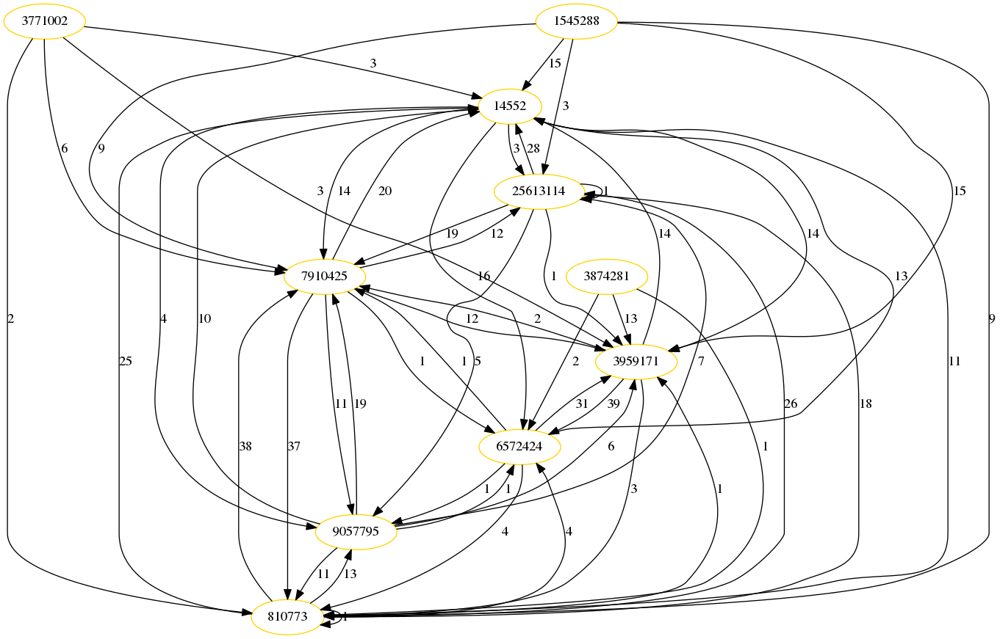

mean distance  47.78426334967303
Project name: int-perl, project owner: a-panayotopoulos, ghtorrent id: 45897740


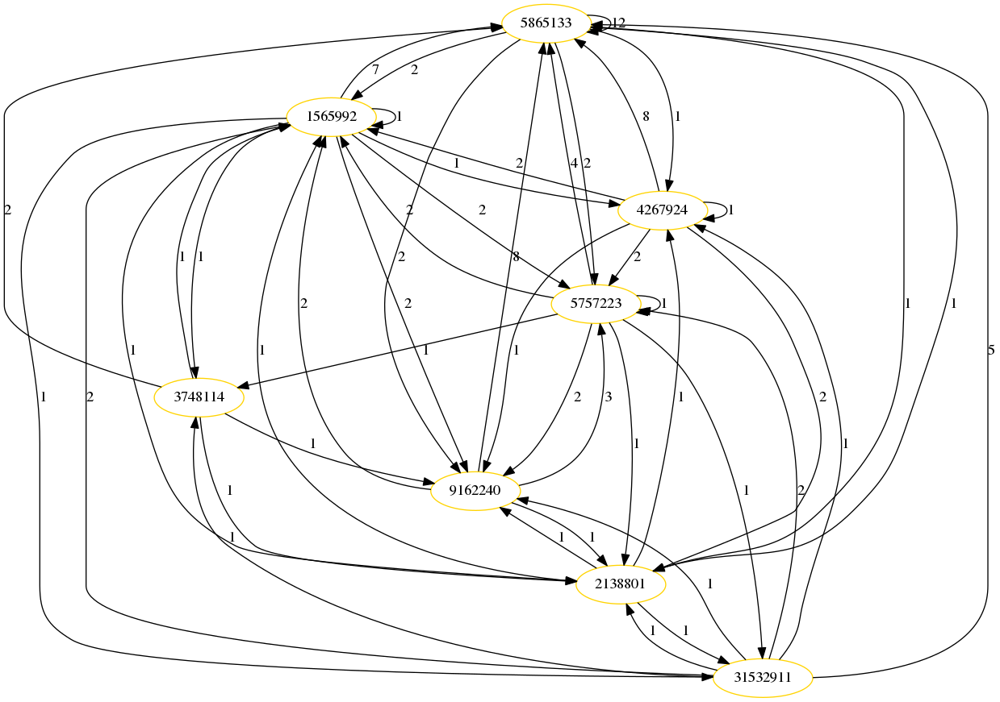

mean distance  53.32461196630459
Project name: quasar, project owner: quasar-analytics, ghtorrent id: 27825237


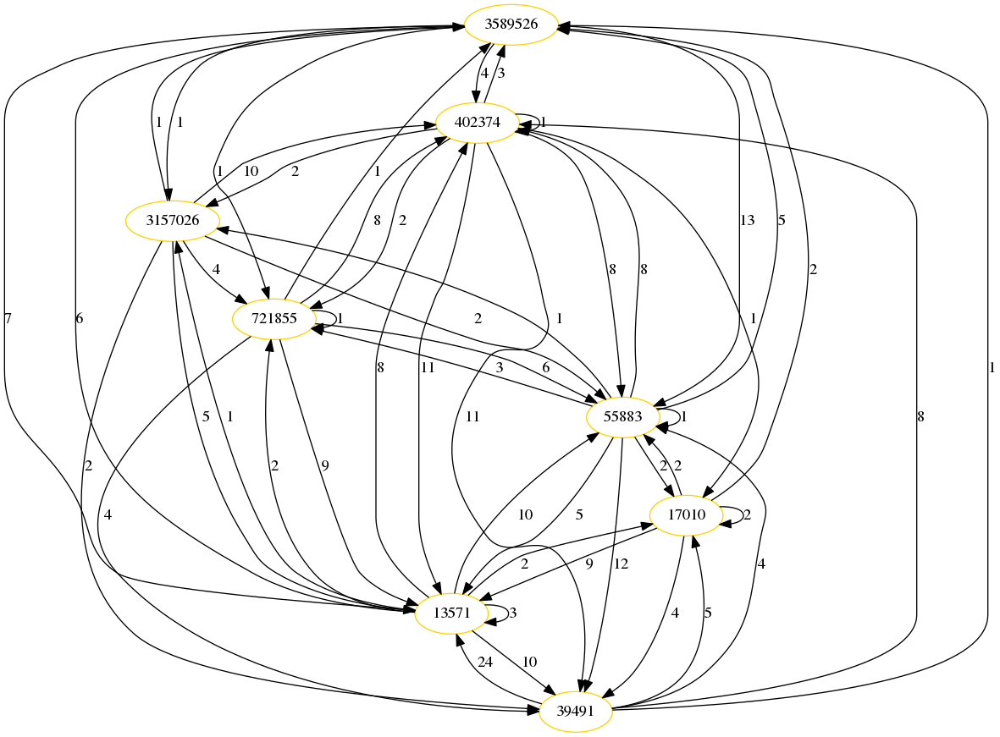

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [60]:
draw_most_representatives(cluster2, feature_vecs_8to20, 5, 0, 0, colors[2])

In [62]:
np.random.seed(seed=123)
nodes= cluster1
Y=distance.pdist([feature_vecs_8to20[node] for node in nodes], 'seuclidean', V=varis)

Y_min = np.min(Y)
Y_max = np.max(Y)

tuples=combinations(nodes,2)
G=nx.Graph()
G.add_weighted_edges_from([(*indeces, 1 - (dist - Y_min)/(Y_max - Y_min)) for indeces, dist in zip(tuples,Y) ])

G_nodes=G.nodes
for node in nodes:
    if node not in G_nodes:
        G.add_node(node)
#compute the best partition

partition2 = community.best_partition(G, resolution=1.0)
modularity2=community.modularity(partition2, G, weight='weight')

In [69]:
cluster10=[x for x in partition2 if partition2[x]==0]
cluster11=[x for x in partition2 if partition2[x]==1]
cluster12=[x for x in partition2 if partition2[x]==2]
cluster13=[x for x in partition2 if partition2[x]==3]

print("cluster 0: ", len(cluster10))
print("cluster 1: ", len(cluster11))
print("cluster 2: ", len(cluster12))
print("cluster 3: ", len(cluster13))


cluster 0:  516
cluster 1:  365
cluster 2:  511
cluster 3:  0


Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  3.819150593270004
Project name: Platform-CI, project owner: RHQE, ghtorrent id: 33806433


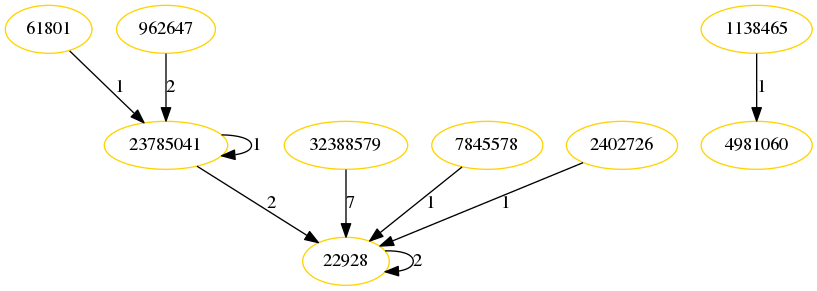

mean distance  3.8593116731511694
Project name: linux-sgx, project owner: 01org, ghtorrent id: 39882805


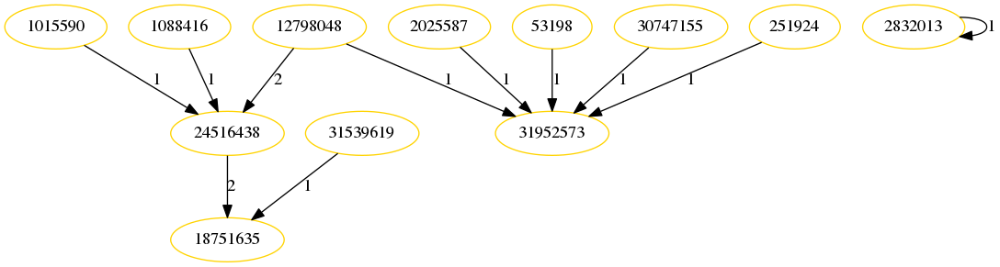

mean distance  3.9178661881097105
Project name: Magneticraft, project owner: Magneticraft-Team, ghtorrent id: 30965635


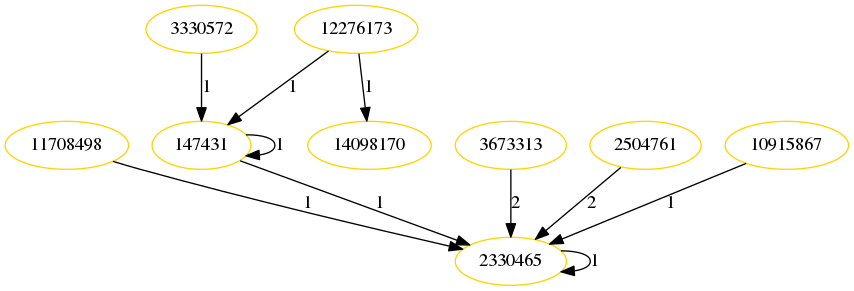

mean distance  3.932617465203834
Project name: fedy, project owner: folkswithhats, ghtorrent id: 22281442


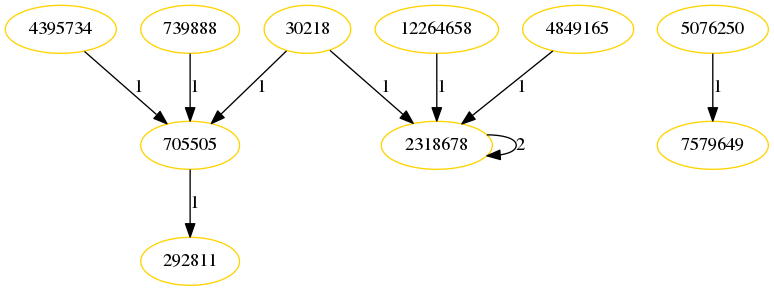

mean distance  3.9485355742616055
Project name: kafka-connect-hdfs, project owner: confluentinc, ghtorrent id: 28852302


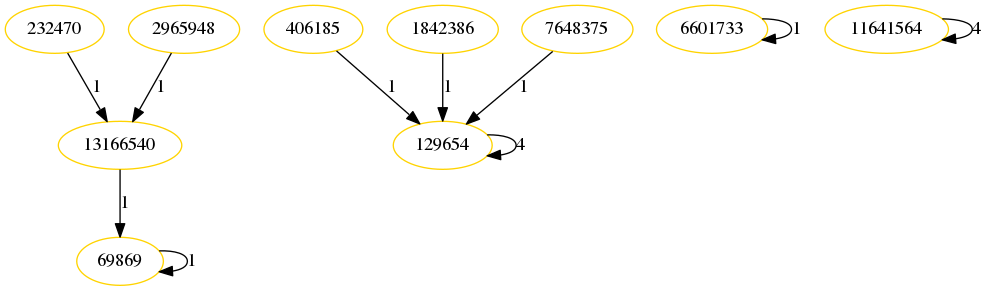

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  7.769025907291712
Project name: next-beacon-v2, project owner: Financial-Times, ghtorrent id: 29966389


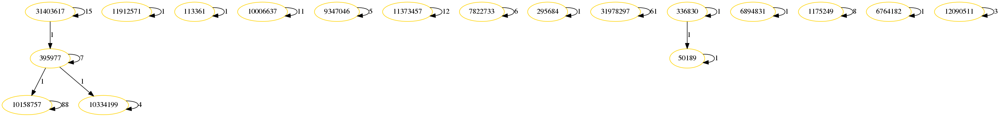

mean distance  8.089915912389264
Project name: gds-sso, project owner: alphagov, ghtorrent id: 333984


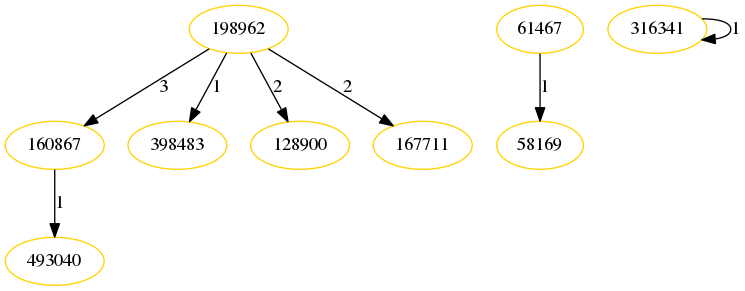

mean distance  8.115283773253662
Project name: find-and-replace, project owner: Atom, ghtorrent id: 8233337


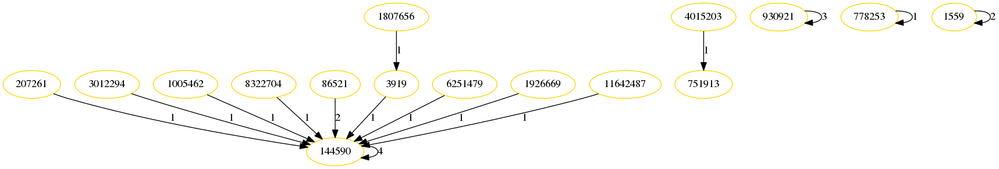

mean distance  8.820523534151858
Project name: maslow, project owner: alphagov, ghtorrent id: 5640587


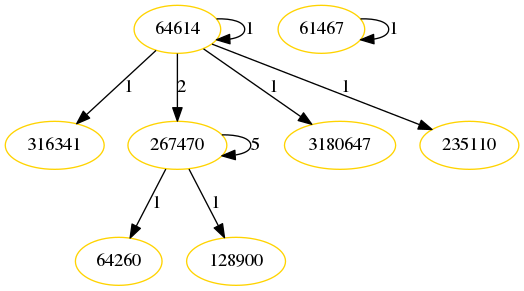

mean distance  9.383510857445277
Project name: devs-september, project owner: githubteacher, ghtorrent id: 45268976


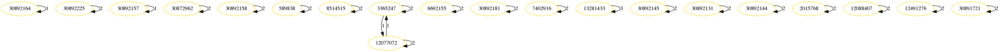

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [70]:
draw_most_representatives(cluster10, feature_vecs_8to20, 5, 0, 0, colors[2])

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  3.3125211562586085
Project name: hazelcast-code-samples, project owner: hazelcast, ghtorrent id: 10304631


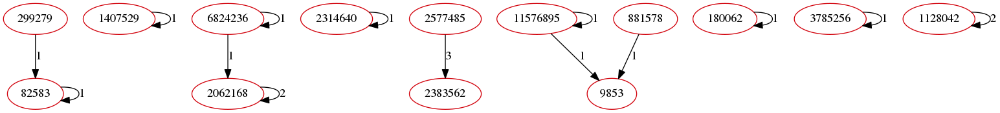

mean distance  3.331744179306473
Project name: sentry-plugins, project owner: getsentry, ghtorrent id: 42885683


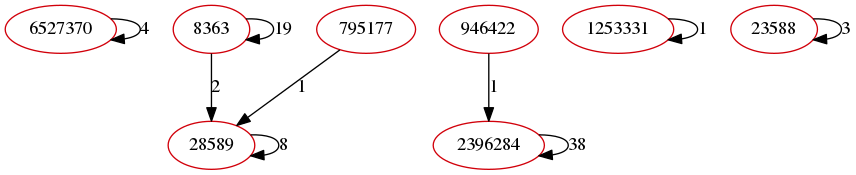

mean distance  3.334492196287692
Project name: strong-error-handler, project owner: strongloop, ghtorrent id: 36892254


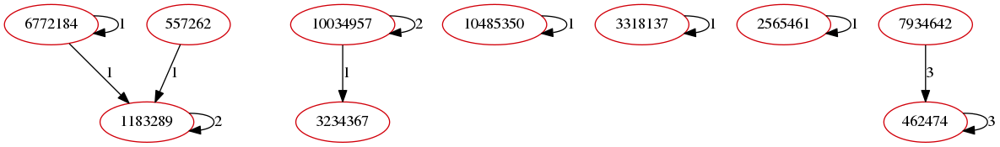

mean distance  3.3407842939776127
Project name: cloudify-agent, project owner: cloudify-cosmo, ghtorrent id: 19094257


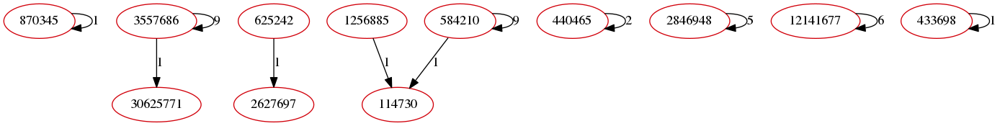

mean distance  3.348397045569968
Project name: api-enumerations, project owner: companieshouse, ghtorrent id: 22218377


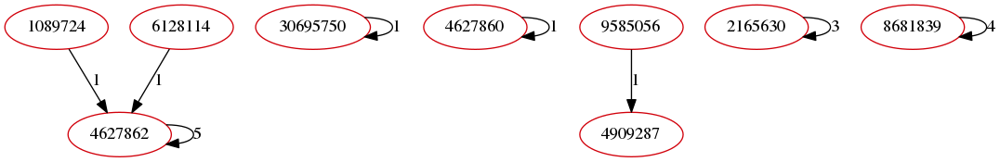

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  7.923707270166654
Project name: developers-jan-12, project owner: githubteacher, ghtorrent id: 54664375


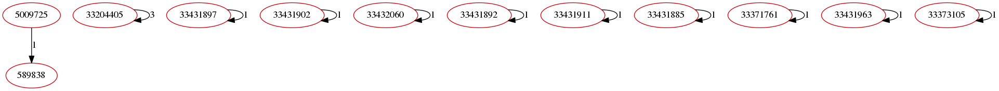

mean distance  8.811367656110242
Project name: next-product-selector, project owner: Financial-Times, ghtorrent id: 21391687


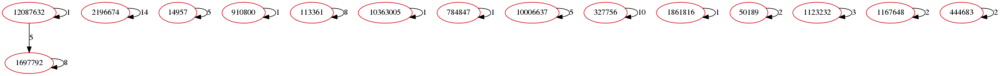

mean distance  9.745878425070687
Project name: Common, project owner: aspnet, ghtorrent id: 16439239


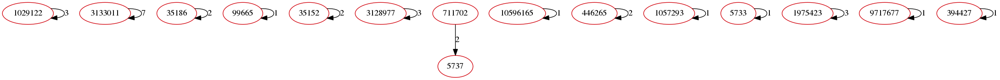

mean distance  10.552730342124818
Project name: dev-dec-19, project owner: githubteacher, ghtorrent id: 53019708


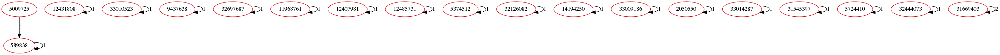

mean distance  11.640800389162305
Project name: oct-04-dev, project owner: githubteacher, ghtorrent id: 47472936


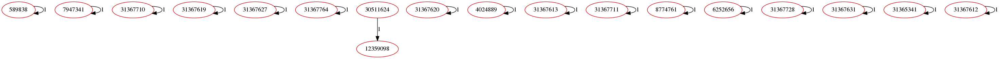

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [71]:
draw_most_representatives(cluster11, feature_vecs_8to20, 5, 0, 0, colors[4])

Distance distribution
---------------------------------------------------------------------------------
most central projects in cluster:
---------------------------------------------------------------------------------
mean distance  1.874078200581276
Project name: opensips, project owner: OpenSIPS, ghtorrent id: 3648248


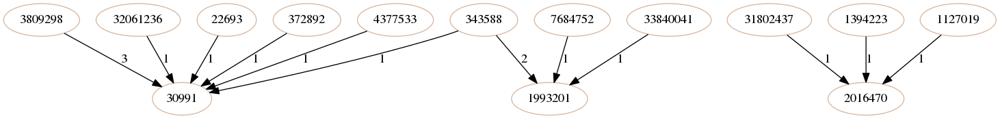

mean distance  1.8761744195713101
Project name: ransack, project owner: activerecord-hackery, ghtorrent id: 6442229


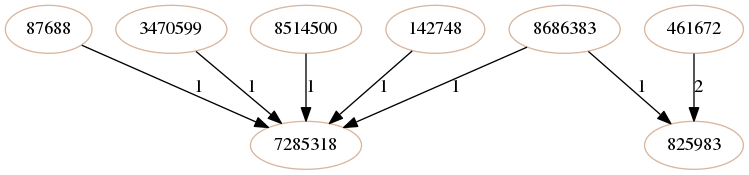

mean distance  1.8761744195713101
Project name: proxmark3, project owner: Proxmark, ghtorrent id: 8618875


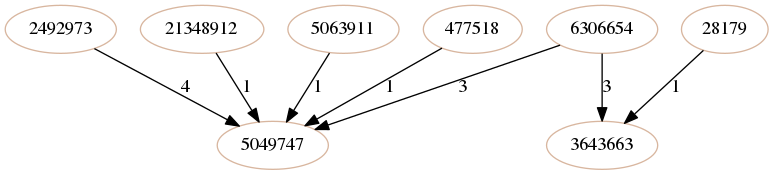

mean distance  1.8761744195713101
Project name: HackCU2017, project owner: HackCU, ghtorrent id: 36851764


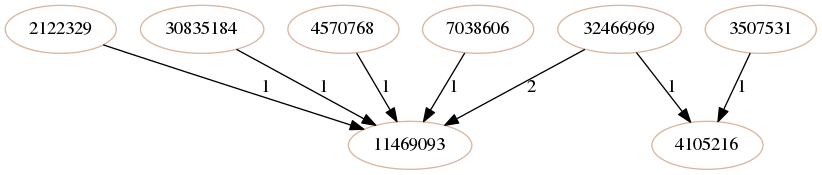

mean distance  1.8777612923327698
Project name: xrootd, project owner: xrootd, ghtorrent id: 3181271


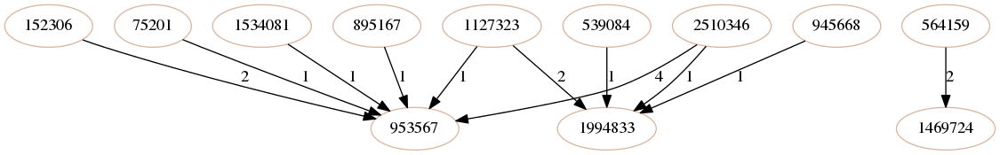

most decentral projects in cluster:
---------------------------------------------------------------------------------
mean distance  5.171035256639844
Project name: portal-educacao, project owner: cefet-inf-2015, ghtorrent id: 46623051


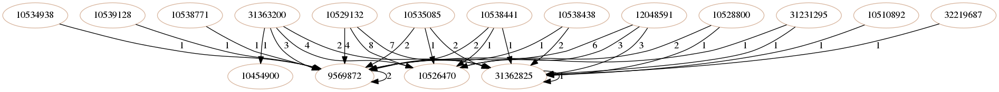

mean distance  5.2553763864605365
Project name: ensembl-webcode, project owner: Ensembl, ghtorrent id: 6977976


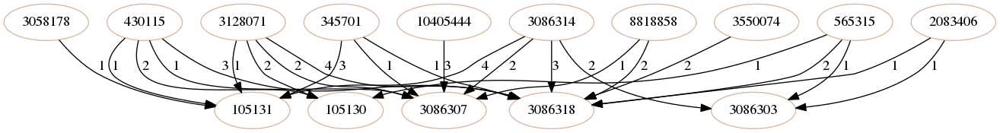

mean distance  5.269902273688949
Project name: ruby-oct-2016, project owner: CodingDojoDallas, ghtorrent id: 47480675


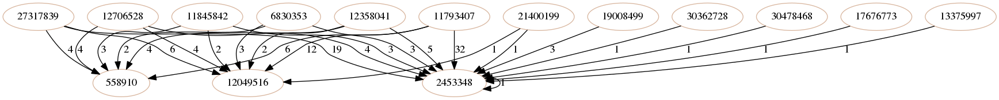

mean distance  5.536219097430246
Project name: dl-ui, project owner: danliris, ghtorrent id: 42787101


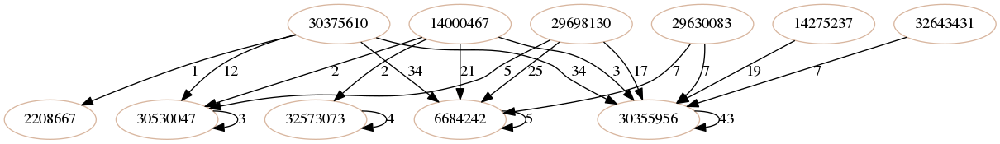

mean distance  5.610827599759529
Project name: oe-alliance-plugins, project owner: oe-alliance, ghtorrent id: 123568


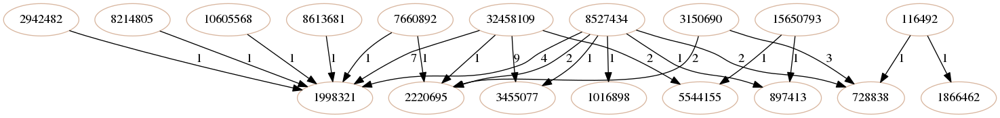

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

<Figure size 720x144 with 0 Axes>

In [72]:
draw_most_representatives(cluster12, feature_vecs_8to20, 5, 0, 0, colors[3])

In [76]:
completegraph_finalpartition = {}
for node in cluster0:
    completegraph_finalpartition[node]=0

for node in cluster2:
    completegraph_finalpartition[node]=1

for node in cluster10:
    completegraph_finalpartition[node]=2
    
for node in cluster11:
    completegraph_finalpartition[node]=3

for node in cluster12:
    completegraph_finalpartition[node]=4




Since we discarded some projects before we cannot calculate the adjusted rand score as is.
But we can do so if we remove the discarded projects also from completegraph_finalpartition.

In [87]:
completegraph_finalpartition_without_garbage = {k:v for k,v in completegraph_finalpartition.items() if k in final_partition}
print(adjusted_rand_score(list(final_partition.values()), list(completegraph_finalpartition_without_garbage.values())))

0.8943811420797366


#### We see, both from the plots above and the high adjusted rand score between the partitions, that we would get a very similar partition even without using the treshold on the distance.